In [1]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
from scipy import sparse
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams['pdf.fonttype'] = 42


/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/

In [ ]:
1. DEGs between D1/D2 vs. Hybrid subclass per species among primates - Yuanyuan

2. Veen plot across species for up/down-regulated genes in Hybrids - Yuanyuan

3. highlight TF patterns [and will also check DNAseqModel results later - Nelson] - Yuanyuan

4. for core genes(overlapped up-regulated); do GO enrichment analysis - Yuanyuan

5. for human-specific higher genes, do GO analysis - Yuanyuan

6. any abundance changes betwen D1/D2 islands and Hybrid island across species (also, in primates vs. mouse) - Matthew?

Also,

1. within Hybrid subclass, what make D1D2 hyrbid Group distinct? conserved features across species.

2. within D1D2 hyrbid Group, DRD1/DRD2 expression fraction changes across species

3. Speaking of Hybrids, any conserved and divergent features between D1D2 Hyrbids group and D2StrioMat Group? - Matthew?

Also, 

how do ATAC/Model best fit in?

In [2]:
#data_dir = "/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/data/xspecies"

work_dir = "/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/Hybrids/D1D2vsHyrbids_Subclass"
os.makedirs(work_dir, exist_ok=True)
os.chdir(work_dir)

In [3]:
adata = sc.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/neurotransmitter" + "/temp_consensus_preprint_3species_adata_withlogCPM_X.h5ad")

In [6]:
print(len(set(adata.obs['Neighborhood'])))
print(len(set(adata.obs['Class'])))
print(len(set(adata.obs['Subclass'])))
print(len(set(adata.obs['Group'])))
print(len(set(adata.obs['Cluster'])))

4
12
36
61
1435


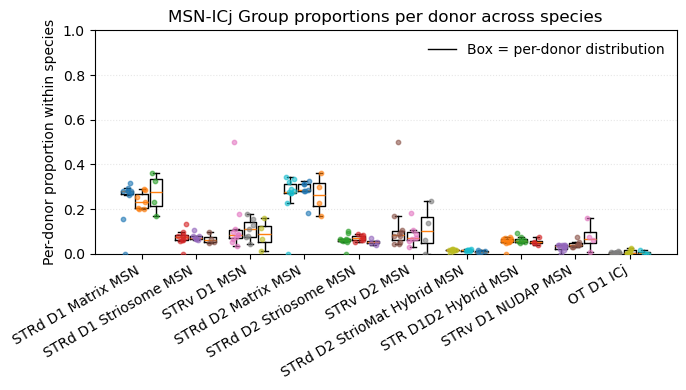

In [6]:
#adata = sc.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/neurotransmitter" + "/temp_consensus_preprint_3species_adata_withlogCPM_X.h5ad")

# --- subset to the three MSN subclasses ---
#selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"]
selected = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
obs = adata.obs[adata.obs["Group"].isin(selected)].copy()

# --- per-donor totals (MSN cells) within species ---
totals = (obs.groupby(["organism","donor_id"])
            .size()
            .rename("total_msn_per_donor"))

# --- per-donor subclass counts ---
counts = (obs.groupby(["organism","donor_id","Group"])
            .size()
            .rename("n_cells"))

# merge and compute per-donor proportion of each subclass
df = (counts.reset_index()
            .merge(totals.reset_index(), on=["organism","donor_id"], how="left"))
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]

# desired orders
subclass_order =['STRd D1 Matrix MSN', 'STRd D1 Striosome MSN', 'STRv D1 MSN','STRd D2 Matrix MSN',  'STRd D2 Striosome MSN', 'STRv D2 MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
species_order  = [sp for sp in ["Human","Macaque","Marmoset"] if sp in df["organism"].unique()]

# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
labels_pos  = []
x = np.arange(len(subclass_order))      # 3 groups
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp,1)

positions = []
for i, sc in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[(df["Group"]==sc) & (df["organism"]==sp), "proportion"].dropna().values
        data_lists.append(vals)
        # x-position for this box
        pos = x[i] + (j - (nsp-1)/2)*dx
        positions.append(pos)

# --- plot ---
fig, ax = plt.subplots(figsize=(7, 4))

# boxplot 
bp = ax.boxplot(
    data_lists,
    positions=positions,
    widths=dx*0.85,
    manage_ticks=False,
    showfliers=False
)


rng = np.random.default_rng(0)
for vals, pos in zip(data_lists, positions):
    if len(vals):
        jitter = (rng.random(len(vals)) - 0.5) * dx*0.6
        ax.scatter(np.full_like(vals, pos)+jitter, vals, s=10, alpha=0.6, zorder=3)


ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")

ax.set_ylabel("Per-donor proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN-ICj Group proportions per donor across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)


from matplotlib.lines import Line2D
legend_handles = [Line2D([0],[0], color="black", lw=1)]
legend_labels  = ["Box = per-donor distribution"]
ax.legend(legend_handles, legend_labels, frameon=False, loc="upper right")

plt.tight_layout()
plt.savefig("MSN_ICj_group_proportions_per_donor_across_species.pdf")
plt.show()


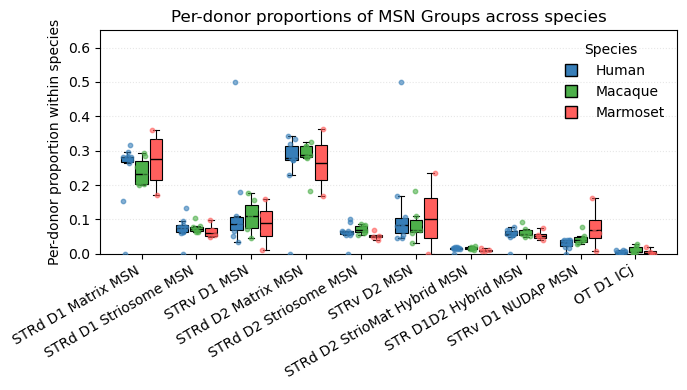

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- subset to selected MSN Groups ---
selected =['STRd D1 Matrix MSN', 'STRd D1 Striosome MSN', 'STRv D1 MSN','STRd D2 Matrix MSN',  'STRd D2 Striosome MSN', 'STRv D2 MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
obs = adata.obs[adata.obs["Group"].isin(selected)].copy()

# --- per-donor totals (within species) ---
totals = (
    obs.groupby(["organism", "donor_id"])
    .size()
    .rename("total_msn_per_donor")
)

# --- per-donor Group counts ---
counts = (
    obs.groupby(["organism", "donor_id", "Group"])
    .size()
    .rename("n_cells")
)

# --- merge and compute per-donor proportions ---
df = (
    counts.reset_index()
    .merge(totals.reset_index(), on=["organism", "donor_id"], how="left")
)
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]

# --- desired orders ---
subclass_order =['STRd D1 Matrix MSN', 'STRd D1 Striosome MSN', 'STRv D1 MSN','STRd D2 Matrix MSN',  'STRd D2 Striosome MSN', 'STRv D2 MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
species_order = [sp for sp in ["Human", "Macaque", "Marmoset"] if sp in df["organism"].unique()]

# --- species colors (paper-consistent mapping) ---
species_colors = {
    "Human": "#377eb8",
    "Macaque": "#4daf4a",
    "Marmoset": "#FF5F5D",
}

# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
positions = []
colors = []

x = np.arange(len(subclass_order))
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp, 1)

for i, sc_name in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[
            (df["Group"] == sc_name) & (df["organism"] == sp),
            "proportion",
        ].dropna().values

        data_lists.append(vals)
        positions.append(x[i] + (j - (nsp - 1) / 2) * dx)
        colors.append(species_colors[sp])

# --- plot ---
fig, ax = plt.subplots(figsize=(7, 4))

# Draw one colored box at a time (keeps species color mapping explicit)
for vals, pos, c in zip(data_lists, positions, colors):
    if len(vals) == 0:
        continue
    ax.boxplot(
        [vals],
        positions=[pos],
        widths=dx * 0.85,
        patch_artist=True,
        showfliers=False,
        boxprops=dict(facecolor=c, edgecolor="black", linewidth=0.8),
        medianprops=dict(color="black", linewidth=1.0),
        whiskerprops=dict(color="black", linewidth=0.8),
        capprops=dict(color="black", linewidth=0.8),
    )

# Overlay jittered donor points
rng = np.random.default_rng(0)
for vals, pos, c in zip(data_lists, positions, colors):
    if len(vals) == 0:
        continue
    jitter = (rng.random(len(vals)) - 0.5) * dx * 0.6
    ax.scatter(
        np.full_like(vals, pos) + jitter,
        vals,
        s=10,
        color=c,
        alpha=0.6,
        zorder=3,
    )

# Axes labels and aesthetics
ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")
ax.set_ylabel("Per-donor proportion within species")
ax.set_ylim(0, 0.65)
ax.set_title("Per-donor proportions of MSN Groups across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)

# Species legend
legend_handles = [
    Line2D(
        [0], [0],
        marker="s",
        linestyle="none",
        markerfacecolor=species_colors[sp],
        markeredgecolor="black",
        markersize=8,
        label=sp,
    )
    for sp in species_order
]
ax.legend(handles=legend_handles, title="Species", frameon=False, loc="upper right")

plt.tight_layout()

# Save figure
plt.savefig(
    "MSN_Group_proportions_per_donor_across_species.pdf",
    format="pdf",
    bbox_inches="tight",
)

plt.show()


In [18]:
# --- median per-donor proportion by species x Group ---
mean_df = (
    df.groupby(["organism", "Group"])["proportion"]
      .mean()
      .reset_index()
      .rename(columns={"proportion": "mean_proportion"})
)

# Optional: keep plotting order
mean_df["Group"] = pd.Categorical(mean_df["Group"], categories=subclass_order, ordered=True)
mean_df["organism"] = pd.Categorical(mean_df["organism"], categories=species_order, ordered=True)
mean_df = mean_df.sort_values(["organism", "Group"])

print(mean_df)

mean_df.to_csv("MSN_group_mean_proportion_by_species.csv", index=False)


     organism                  Group  mean_proportion
48      Human     STRd D1 Matrix MSN         0.242934
49      Human  STRd D1 Striosome MSN         0.072729
53      Human            STRv D1 MSN         0.128848
50      Human     STRd D2 Matrix MSN         0.261840
52      Human  STRd D2 Striosome MSN         0.062181
..        ...                    ...              ...
178  Marmoset                    NaN         0.000000
179  Marmoset                    NaN         0.000000
180  Marmoset                    NaN         0.000000
181  Marmoset                    NaN         0.000000
182  Marmoset                    NaN         0.000000

[183 rows x 3 columns]


In [19]:
import pandas as pd

# --- count cells per species x Group ---
cell_counts = (
    obs.groupby(["organism", "Group"])
       .size()
       .rename("n_cells")
       .reset_index()
)

# --- total MSN cells per species ---
total_counts = (
    obs.groupby("organism")
       .size()
       .rename("total_msn_cells")
       .reset_index()
)

# --- merge and compute cell-level proportion ---
cell_level_df = (
    cell_counts
    .merge(total_counts, on="organism", how="left")
)

cell_level_df["cell_level_proportion"] = (
    cell_level_df["n_cells"] / cell_level_df["total_msn_cells"]
)

# --- keep desired order ---
cell_level_df["Group"] = pd.Categorical(
    cell_level_df["Group"],
    categories=subclass_order,
    ordered=True
)
cell_level_df["organism"] = pd.Categorical(
    cell_level_df["organism"],
    categories=species_order,
    ordered=True
)

cell_level_df = cell_level_df.sort_values(["organism", "Group"])

print(cell_level_df)

cell_level_df.to_csv(
    "MSN_Group_cell_level_proportion_by_species.csv",
    index=False
)


     organism                  Group  n_cells  total_msn_cells  \
48      Human     STRd D1 Matrix MSN   122353           450613   
49      Human  STRd D1 Striosome MSN    36816           450613   
53      Human            STRv D1 MSN    38739           450613   
50      Human     STRd D2 Matrix MSN   131276           450613   
52      Human  STRd D2 Striosome MSN    31146           450613   
..        ...                    ...      ...              ...   
178  Marmoset                    NaN        0           115860   
179  Marmoset                    NaN        0           115860   
180  Marmoset                    NaN        0           115860   
181  Marmoset                    NaN        0           115860   
182  Marmoset                    NaN        0           115860   

     cell_level_proportion  
48                0.271526  
49                0.081702  
53                0.085970  
50                0.291328  
52                0.069119  
..                     ...  
178 

In [10]:
import pandas as pd
import scanpy as sc
from pathlib import Path
import anndata as ad

def apply_palette_from_excel(
    adata: ad.AnnData,
    excel_path: str | Path,
    *,
    sheet_name: str = "consensus_anno_pre-print",
    level: str = "Neighborhood",  # Neighborhood / Class / Subclass
):
    """
    Automatically apply color palettes and display order for any level
    (Class / Subclass / Neighborhood) from Excel sheet.
    """
    level_lower = level.lower()
    color_col = f"color_hex_{level_lower}"
    order_col = f"display_order_{level_lower}"

    df = pd.read_excel(excel_path, sheet_name=sheet_name, engine="openpyxl")

    if color_col not in df.columns or order_col not in df.columns or level not in df.columns:
        raise KeyError(f"Expected columns '{level}', '{color_col}', and '{order_col}' not found in Excel.")

    df = df[[level, color_col, order_col]].dropna(subset=[level, color_col])
    df = df.drop_duplicates(subset=[level], keep="first").sort_values(by=order_col)

    # Build palette
    palette_dict = dict(zip(df[level], df[color_col]))
    palette_list = [palette_dict[k] for k in df[level].tolist()]

    # Ensure category and assign colors
    if level not in adata.obs.columns:
        raise KeyError(f"'{level}' not found in adata.obs columns.")
    adata.obs[level] = adata.obs[level].astype("category")
    ordered_cats = df[level].tolist()
    adata.obs[level] = adata.obs[level].cat.reorder_categories(ordered_cats, ordered=True)
    adata.uns[f"{level}_colors"] = palette_list

    print(f"✅ Applied palette for {level} ({len(palette_list)} colors)")
    return palette_dict

excel_path = work_dir + "/HMBA_BG_consensus_annotation-6.xlsx"


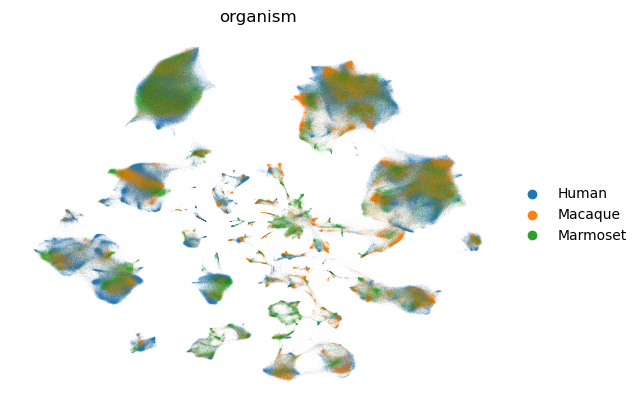

In [9]:
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=['organism'],
    frameon=False,
    save="BG_3species_coloredby_organism.png"
)

/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/openpyxl/worksheet/_read_only.py:85: UserWarning: Sparkline Group extension is not supported and will be removed
  for idx, row in parser.parse():


✅ Applied palette for Neighborhood (4 colors)


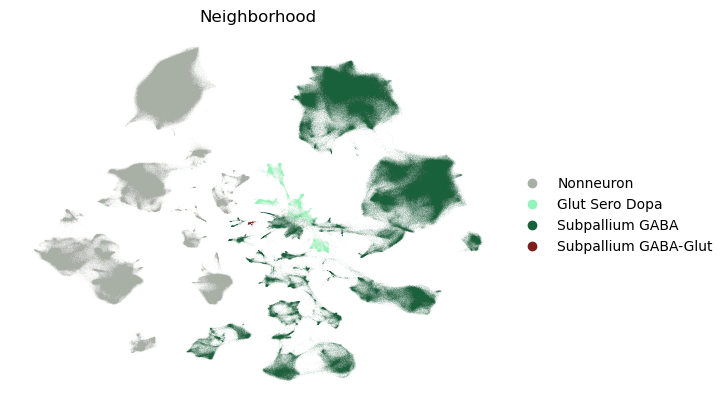

/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/openpyxl/worksheet/_read_only.py:85: UserWarning: Sparkline Group extension is not supported and will be removed
  for idx, row in parser.parse():


✅ Applied palette for Class (12 colors)


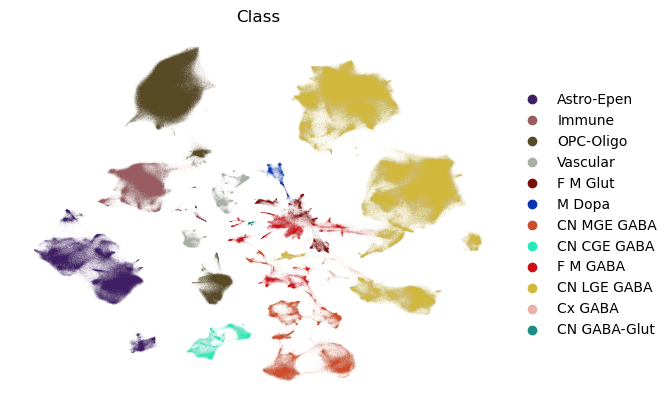

/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/openpyxl/worksheet/_read_only.py:85: UserWarning: Sparkline Group extension is not supported and will be removed
  for idx, row in parser.parse():


✅ Applied palette for Subclass (36 colors)


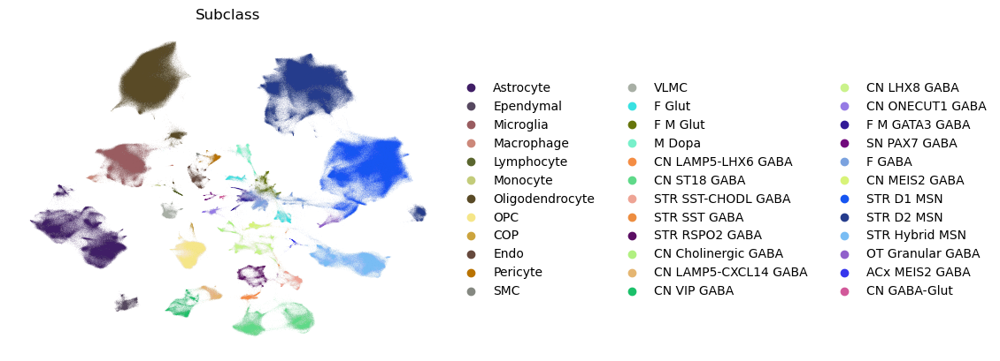

In [12]:
palette_dict = apply_palette_from_excel(
    adata,
    excel_path,
    level="Neighborhood", 
    sheet_name="consensus_anno_pre-print"
)
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=["Neighborhood"],
    frameon=False,
    save="BG_3species_coloredby_Neighborhood.png"
)


palette_dict = apply_palette_from_excel(
    adata,
    excel_path,
    level="Class", 
    sheet_name="consensus_anno_pre-print"
)
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=["Class"],
    frameon=False,
    save="BG_3species_coloredby_Class.png"
)



palette_dict = apply_palette_from_excel(
    adata,
    excel_path,
    level="Subclass", 
    sheet_name="consensus_anno_pre-print"
)
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=["Subclass"],
    frameon=False,
    save="BG_3species_coloredby_Subclass.png"
)

/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/openpyxl/worksheet/_read_only.py:85: UserWarning: Sparkline Group extension is not supported and will be removed
  for idx, row in parser.parse():


✅ Applied palette for Group (61 colors)


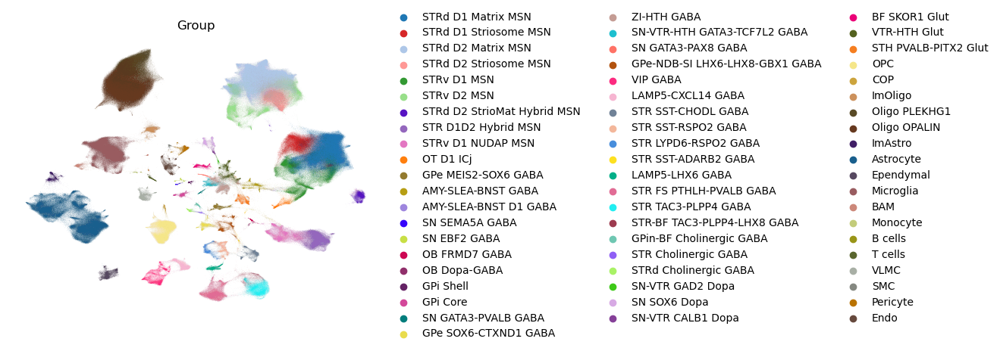

In [13]:
palette_dict = apply_palette_from_excel(
    adata,
    excel_path,
    level="Group", 
    sheet_name="consensus_anno_pre-print"
)
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=["Group"],
    frameon=False,
    save="BG_3species_coloredby_Group.png"
)

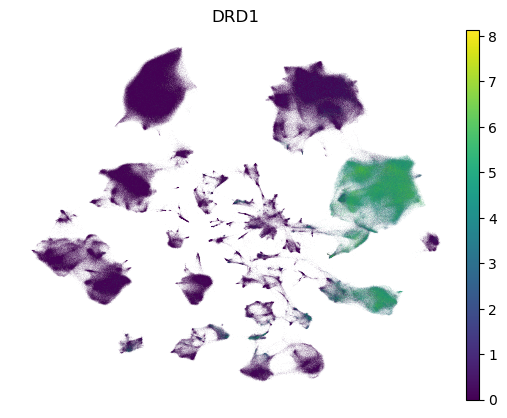

In [4]:
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=['DRD1'],
    frameon=False,
)

## subsetting MSNs

In [4]:
set(adata.obs['Subclass'])

{'ACx MEIS2 GABA',
 'Astrocyte',
 'CN Cholinergic GABA',
 'CN GABA-Glut',
 'CN LAMP5-CXCL14 GABA',
 'CN LAMP5-LHX6 GABA',
 'CN LHX8 GABA',
 'CN MEIS2 GABA',
 'CN ONECUT1 GABA',
 'CN ST18 GABA',
 'CN VIP GABA',
 'COP',
 'Endo',
 'Ependymal',
 'F GABA',
 'F Glut',
 'F M GATA3 GABA',
 'F M Glut',
 'Lymphocyte',
 'M Dopa',
 'Macrophage',
 'Microglia',
 'Monocyte',
 'OPC',
 'OT Granular GABA',
 'Oligodendrocyte',
 'Pericyte',
 'SMC',
 'SN PAX7 GABA',
 'STR D1 MSN',
 'STR D2 MSN',
 'STR Hybrid MSN',
 'STR RSPO2 GABA',
 'STR SST GABA',
 'STR SST-CHODL GABA',
 'VLMC'}

In [5]:
#selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN"]
selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"]
adata_msn = adata[adata.obs["Subclass"].isin(selected)].copy()


In [ ]:
#adata_msn.write_h5ad("Consensus_preprint_3species_MSNs_withlogCPM_X.h5ad") #9 groups
adata_msn.write_h5ad("Consensus_preprint_3species_MSNs-ICj_withlogCPM_X.h5ad") #10 groups

In [4]:
adata_msn=sc.read_h5ad("Consensus_preprint_3species_MSNs-ICj_withlogCPM_X.h5ad") #10 groups

In [5]:
group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
adata_msn.obs['Group'] = pd.Categorical(adata_msn.obs['Group'],
                                          categories=group_order,
                                          ordered=True)

In [14]:
set(adata.obs['organism'])

{'Human', 'Macaque', 'Marmoset'}

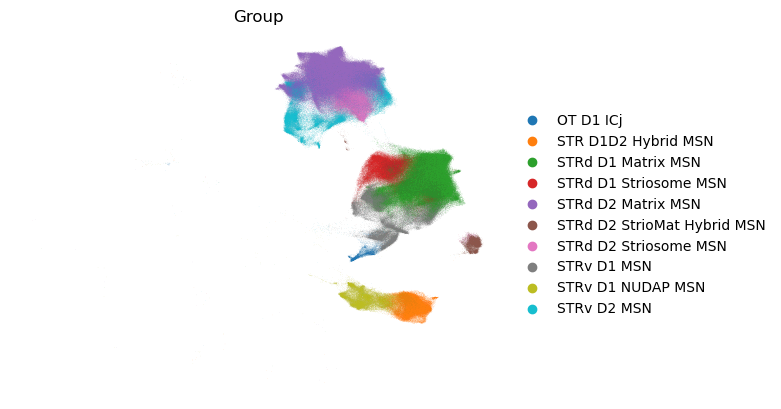

In [7]:
sc.pl.embedding(
    adata_msn,
    basis="X_umap",
    color=['Group'],
    frameon=False,
)

### 4 species MSNS,  composition

In [3]:
adata = sc.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/xspecies/BasalGanglia/HMBA_Human_Macaque_Marmoset_Mouse_snRNA-seq_BG_neuron_alignment_labeltransfer_allgenes.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 1298997 × 15466
    obs: 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster', 'cluster_id', 'cell_type_ontology_term', 'load_id', 'donor_id', 'assay', 'assay_ontology_term_id', 'organism', 'organism_ontology_term_id', 'development_stage', 'anatomical_region', 'anatomical_region_merged', 'anatomical_region_ontology_term_id', 'brain_region_ontology_term_id', 'self_reported_sex', 'self_reported_sex_ontology_term_id', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'disease', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'total_counts', 'total_genes', 'doublet_score', 'organism_sci', 'accession_group', 'embedding_set', 'CL:ID_group', 'tokens_group', 'display_order_group', 'literature_support', 'literature_name_short', 'literature_name_long', 'curated_markers', 'color_hex_group', 'color_group', 'accession_subclass', 'CL:ID_subclass', 'tokens_subclass', 'display_order_subclass', 'color_hex_subclass', 'color_s

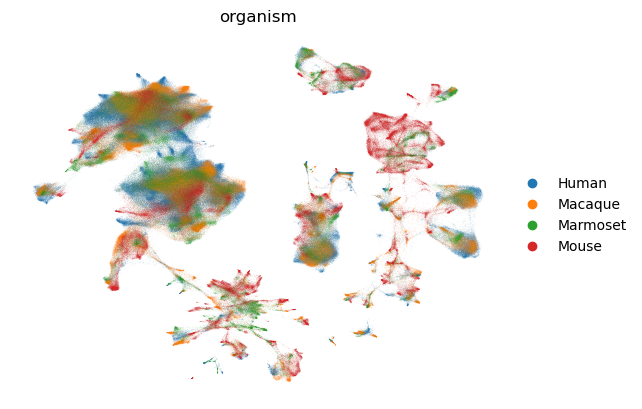

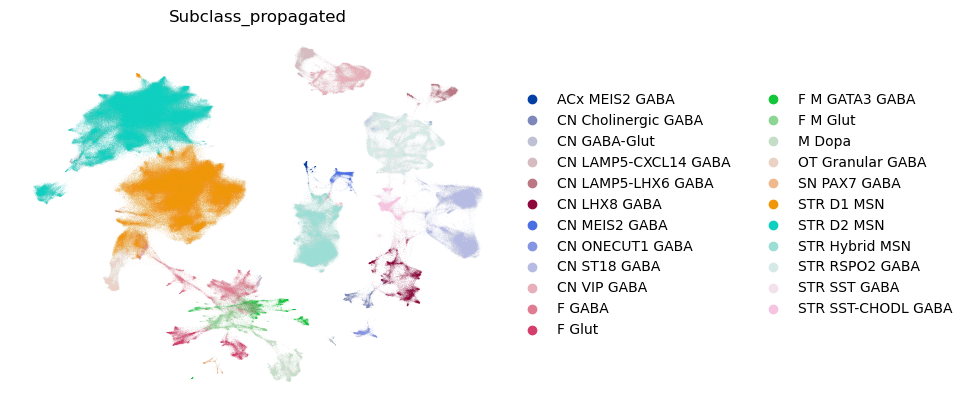

In [6]:
sc.pl.embedding(
    adata,
    basis="X_umap",
    color=['organism'], # Subclass
    frameon=False,
)

sc.pl.embedding(
    adata,
    basis="X_umap",
    color=['Subclass_propagated'], # Subclass
    frameon=False,
)

In [7]:
set(adata.obs['Subclass_propagated'])

{'ACx MEIS2 GABA',
 'CN Cholinergic GABA',
 'CN GABA-Glut',
 'CN LAMP5-CXCL14 GABA',
 'CN LAMP5-LHX6 GABA',
 'CN LHX8 GABA',
 'CN MEIS2 GABA',
 'CN ONECUT1 GABA',
 'CN ST18 GABA',
 'CN VIP GABA',
 'F GABA',
 'F Glut',
 'F M GATA3 GABA',
 'F M Glut',
 'M Dopa',
 'OT Granular GABA',
 'SN PAX7 GABA',
 'STR D1 MSN',
 'STR D2 MSN',
 'STR Hybrid MSN',
 'STR RSPO2 GABA',
 'STR SST GABA',
 'STR SST-CHODL GABA'}

In [5]:
#selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN"]
selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"]
adata_msn = adata[adata.obs["Subclass_propagated"].isin(selected)].copy()


#### for panel G (4 species conserved higher in D2StrioMat compared to other D2 MSNs) - from StrioMat primate-mouse.ipynb

In [6]:
group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
adata_msn.obs['Group_propagated'] = pd.Categorical(adata_msn.obs['Group_propagated'],
                                          categories=group_order,
                                          ordered=True)

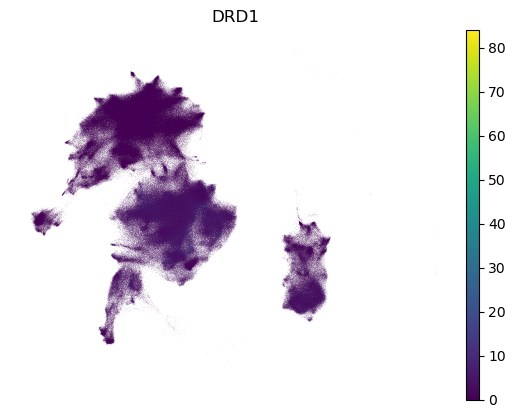

In [7]:
sc.pl.embedding(
    adata_msn,
    basis="X_umap",
    color=['DRD1'],
    frameon=False,
)

In [8]:
sc.pp.normalize_total(adata_msn, target_sum=1e6)
sc.pp.log1p(adata_msn)

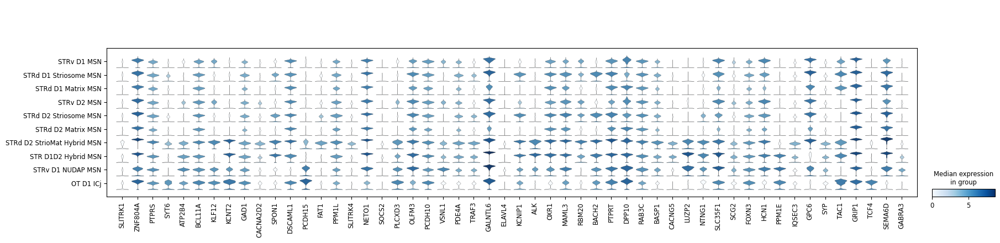

In [10]:
d2striomatlist= ['SLITRK1', 'ZNF804A', 'PTPRS', 'SYT6', 'ATP2B4', 'BCL11A', 'KLF12', 'KCNT2', 'GAD1', 'CACNA2D2', 'SPON1', 'DSCAML1', 'PCDH15', 'FAT1', 'PPM1L', 'SLITRK4', 'NETO1', 'SOCS2', 'PLCXD3', 'OLFM3',
                 'PCDH10', 'VSNL1', 'PDE4A', 'TRAF3', 'GALNTL6', 'ELAVL4', 'KCNIP1', 'ALK', 'OXR1', 'MAML3', 'RBM20', 'BACH2', 'PTPRT', 'DPP10', 'RAB3C', 'BASP1', 'CACNG5', 'LUZP2', 'NTNG1', 'SLC35F1', 'SCG2', 
                 'FOXN3', 'HCN1', 'PPM1E', 'IQSEC3', 'GPC6', 'SYP', 'TAC1', 'GRIP1', 'TCF4', 'SEMA6D', 'GABRA3'] #52 genes from Veen

sc.pl.stacked_violin(
    adata_msn, #from 4species h5ad
    d2striomatlist, 
    groupby='Group_propagated', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    save="notOrdered_Violinplot_of_D2stiromat_4species_conservedhigher_comparedtoD2MSNs.pdf"
)

In [ ]:
d2striomatlist_ordered= [
    'FAT1','SLITRK4', #D2StrioMat
    'CACNA2D2','CACNG5', 'IQSEC3', #D2StrioMat + eccentric_hybrid
    'ALK', 'LUZP2', 'NTNG1','SYP',  'KCNT2', 'ATP2B4','PLCXD3',  'PPM1E', 'PCDH15',  'TAC1', #D2StrioMat + eccentric + ICj
    'VSNL1', 'SCG2','KLF12',   #D2StrioMat + Ventral(STRv D1.D2, NUDAP, ICj)
    'SPON1','TRAF3', 'KCNIP1','BACH2',  #D2StrioMat + eccentric_hybrid + Strio
    'GABRA3', 'TCF4', # only 1-2 groups in high-level expression acorss 10 groups
    'SYT6', #D1 Strio, StrioMat, OT-ICj 
    'SLITRK1','SOCS2', 'ELAVL4',# no high-level expression across 10 groups
    'GPC6','SEMA6D','PDE4A', 'BASP1','HCN1','RBM20',  'ZNF804A', 'PTPRS', 'BCL11A','GAD1', 'DSCAML1',  'PPM1L', 'NETO1',  'OLFM3', 'PCDH10', 'GALNTL6',  'OXR1', 'MAML3','PTPRT', 'DPP10', 'RAB3C', 'SLC35F1', 'FOXN3', 'GRIP1',  #  high-level expression across 10 groups
] #52 genes from Veen


sc.pl.stacked_violin(
    adata_msn, #from 4species h5ad
    d2striomatlist_ordered, 
    groupby='Group_propagated', 
    use_raw=False, 
    swap_axes=False, 
    figsize=(10,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    save="Ordered_Violinplot_of_D2stiromat_4species_conservedhigher_comparedtoD2MSNs.pdf"
)

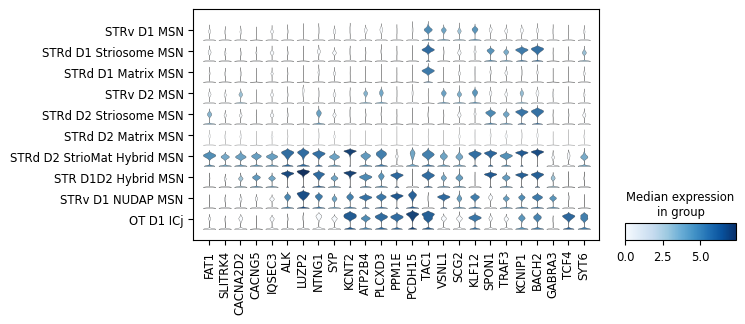

In [11]:
d2striomatlist_ordered= [
    'FAT1','SLITRK4', #D2StrioMat
    'CACNA2D2','CACNG5', 'IQSEC3', #D2StrioMat + eccentric_hybrid
    'ALK', 'LUZP2', 'NTNG1','SYP',  'KCNT2', 'ATP2B4','PLCXD3', 'PPM1E', 'PCDH15',  'TAC1', #D2StrioMat + eccentric + ICj
    'VSNL1', 'SCG2','KLF12',   #D2StrioMat + Ventral(STRv D1.D2, NUDAP, ICj)
    'SPON1','TRAF3', 'KCNIP1','BACH2',  #D2StrioMat + eccentric_hybrid + Strio
    'GABRA3', 'TCF4', # only 1-2 groups in high-level expression acorss 10 groups
    'SYT6', #D1 Strio, StrioMat, OT-ICj 
    #'SLITRK1','SOCS2', 'ELAVL4',# no high-level expression across 10 groups
    #'GPC6','SEMA6D','PDE4A', 'BASP1','HCN1','RBM20',  'ZNF804A', 'PTPRS', 'BCL11A','GAD1', 'DSCAML1',  'PPM1L', 'NETO1',  'OLFM3', 'PCDH10', 'GALNTL6',  'OXR1', 'MAML3','PTPRT', 'DPP10', 'RAB3C', 'SLC35F1', 'FOXN3', 'GRIP1',  #  high-level expression across 10 groups
] #left/unique gene list of 52 genes from Veen


sc.pl.stacked_violin(
    adata_msn, #from 4species h5ad
    d2striomatlist_ordered, 
    groupby='Group_propagated', 
    use_raw=False, 
    swap_axes=False, 
    figsize=(7,3),
    #cmap='rainbow', #Blues
    dendrogram=False,
    save="Ordered_Violinplot_of_D2stiromat_4species_conservedhigher_comparedtoD2MSNs_notbroadlyPart.pdf"
)

In [11]:
d2striomatlist= ['SLITRK1', 'ZNF804A', 'PTPRS', 'SYT6', 'ATP2B4', 'BCL11A', 'KLF12', 'KCNT2', 'GAD1', 'CACNA2D2', 'SPON1', 'DSCAML1', 'PCDH15', 'FAT1', 'PPM1L', 'SLITRK4', 'NETO1', 'SOCS2', 'PLCXD3', 'OLFM3',
                 'PCDH10', 'VSNL1', 'PDE4A', 'TRAF3', 'GALNTL6', 'ELAVL4', 'KCNIP1', 'ALK', 'OXR1', 'MAML3', 'RBM20', 'BACH2', 'PTPRT', 'DPP10', 'RAB3C', 'BASP1', 'CACNG5', 'LUZP2', 'NTNG1', 'SLC35F1', 'SCG2', 
                 'FOXN3', 'HCN1', 'PPM1E', 'IQSEC3', 'GPC6', 'SYP', 'TAC1', 'GRIP1', 'TCF4', 'SEMA6D', 'GABRA3'] #52 genes from Veen

sc.pl.stacked_violin(
    adata_msn, #from 4species h5ad
    d2striomatlist, 
    groupby='Group_propagated', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=True,
    save="Violinplot_of_D2stiromat_4species_conservedhigher_comparedtoD2MSNs.pdf"
)

         Falling back to preprocessing with `sc.pp.pca` and default params.


KeyboardInterrupt: 

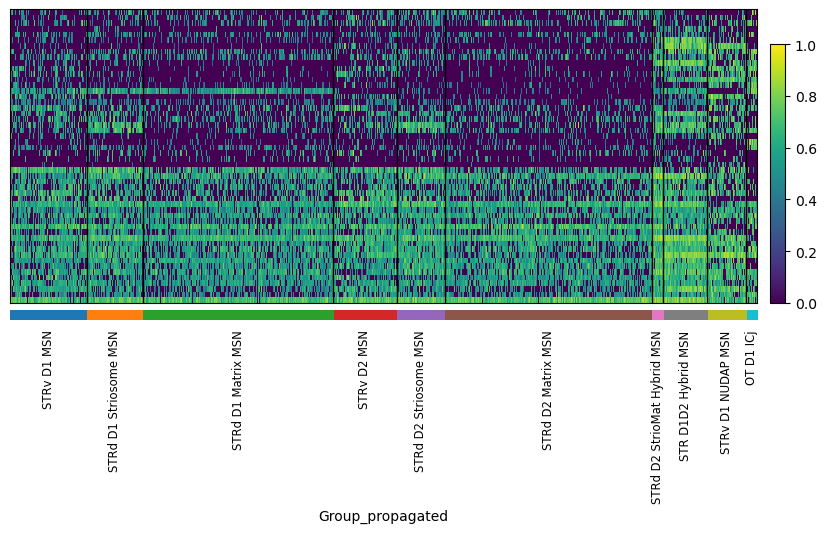

In [9]:
d2striomatlist_ordered= [
    'FAT1','SLITRK4', #D2StrioMat
    'CACNA2D2','CACNG5', 'IQSEC3', #D2StrioMat + eccentric_hybrid
    'ALK', 'LUZP2', 'NTNG1','SYP',  'KCNT2', 'ATP2B4','PLCXD3',  'PPM1E', 'PCDH15',  'TAC1', #D2StrioMat + eccentric + ICj
    'VSNL1', 'SCG2','KLF12',   #D2StrioMat + Ventral(STRv D1.D2, NUDAP, ICj)
    'SPON1','TRAF3', 'KCNIP1','BACH2',  #D2StrioMat + eccentric_hybrid + Strio
    'GABRA3', 'TCF4', # only 1-2 groups in high-level expression acorss 10 groups
    'SYT6', #D1 Strio, StrioMat, OT-ICj 
    'SLITRK1','SOCS2', 'ELAVL4',# no high-level expression across 10 groups
    'GPC6','SEMA6D','PDE4A', 'BASP1','HCN1','RBM20',  'ZNF804A', 'PTPRS', 'BCL11A','GAD1', 'DSCAML1',  'PPM1L', 'NETO1',  'OLFM3', 'PCDH10', 'GALNTL6',  'OXR1', 'MAML3','PTPRT', 'DPP10', 'RAB3C', 'SLC35F1', 'FOXN3', 'GRIP1',  #  high-level expression across 10 groups
] #52 genes from Veen


sc.pl.heatmap(
    adata_msn,
    var_names=d2striomatlist_ordered,
    groupby='Group_propagated',
    use_raw=False,
    #cmap='vlag',
    standard_scale='var',
    dendrogram=False,     
    swap_axes=True,
    #figsize=(7,4),
    save="Heatmap_of_D2stiromat_4species_conservedhigher_comparedtoD2MSNs.pdf"
)


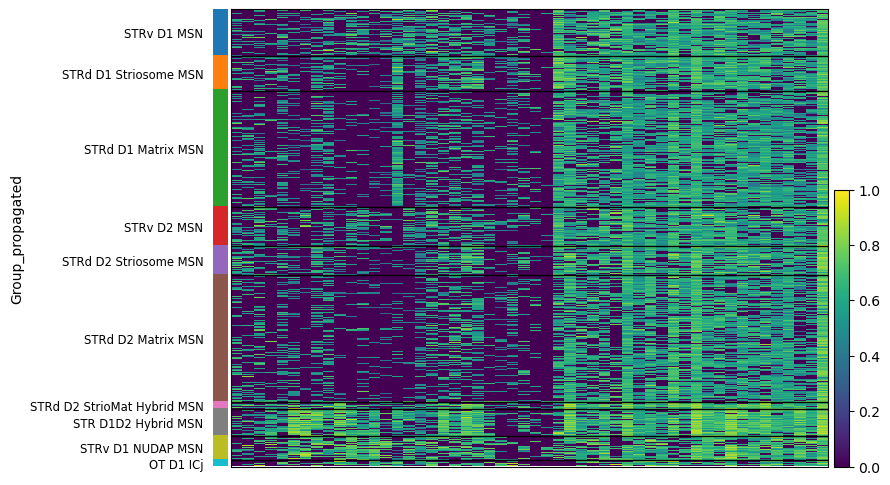

In [10]:
d2striomatlist_ordered= [
    'FAT1','SLITRK4', #D2StrioMat
    'CACNA2D2','CACNG5', 'IQSEC3', #D2StrioMat + eccentric_hybrid
    'ALK', 'LUZP2', 'NTNG1','SYP',  'KCNT2', 'ATP2B4','PLCXD3',  'PPM1E', 'PCDH15',  'TAC1', #D2StrioMat + eccentric + ICj
    'VSNL1', 'SCG2','KLF12',   #D2StrioMat + Ventral(STRv D1.D2, NUDAP, ICj)
    'SPON1','TRAF3', 'KCNIP1','BACH2',  #D2StrioMat + eccentric_hybrid + Strio
    'GABRA3', 'TCF4', # only 1-2 groups in high-level expression acorss 10 groups
    'SYT6', #D1 Strio, StrioMat, OT-ICj 
    'SLITRK1','SOCS2', 'ELAVL4',# no high-level expression across 10 groups
    'GPC6','SEMA6D','PDE4A', 'BASP1','HCN1','RBM20',  'ZNF804A', 'PTPRS', 'BCL11A','GAD1', 'DSCAML1',  'PPM1L', 'NETO1',  'OLFM3', 'PCDH10', 'GALNTL6',  'OXR1', 'MAML3','PTPRT', 'DPP10', 'RAB3C', 'SLC35F1', 'FOXN3', 'GRIP1',  #  high-level expression across 10 groups
] #52 genes from Veen


sc.pl.heatmap(
    adata_msn,
    var_names=d2striomatlist_ordered,
    groupby='Group_propagated',
    use_raw=False,
    #cmap='vlag',
    standard_scale='var',
    dendrogram=False,     
    swap_axes=False,
    #figsize=(7,4),
    save="Heatmap_of_D2stiromat_4species_conservedhigher_comparedtoD2MSNs22.pdf"
)


#### proportions

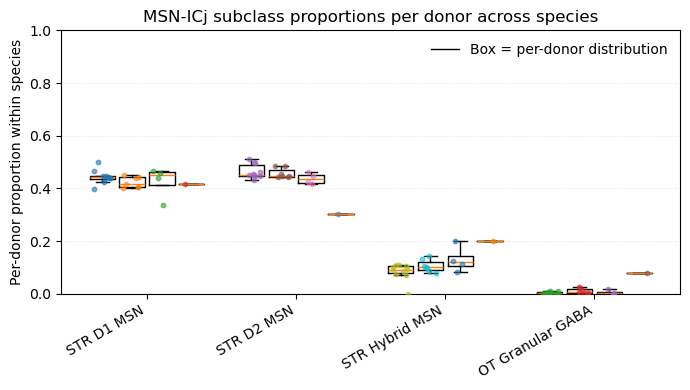

In [9]:
# --- subset to the three MSN subclasses ---
selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"]
obs = adata_msn.obs[adata_msn.obs["Subclass_propagated"].isin(selected)].copy()

# --- per-donor totals (MSN cells) within species ---
totals = (obs.groupby(["organism","donor_id"])
            .size()
            .rename("total_msn_per_donor"))

# --- per-donor subclass counts ---
counts = (obs.groupby(["organism","donor_id","Subclass_propagated"])
            .size()
            .rename("n_cells"))

# merge and compute per-donor proportion of each subclass
df = (counts.reset_index()
            .merge(totals.reset_index(), on=["organism","donor_id"], how="left"))
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]

# desired orders
subclass_order = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"]
species_order  = [sp for sp in ["Human","Macaque","Marmoset", "Mouse"] if sp in df["organism"].unique()]

# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
labels_pos  = []
x = np.arange(len(subclass_order))      # 3 groups
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp,1)

positions = []
for i, sc in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[(df["Subclass_propagated"]==sc) & (df["organism"]==sp), "proportion"].dropna().values
        data_lists.append(vals)
        # x-position for this box
        pos = x[i] + (j - (nsp-1)/2)*dx
        positions.append(pos)

# --- plot ---
fig, ax = plt.subplots(figsize=(7, 4))

# boxplot 
bp = ax.boxplot(
    data_lists,
    positions=positions,
    widths=dx*0.85,
    manage_ticks=False,
    showfliers=False
)


rng = np.random.default_rng(0)
for vals, pos in zip(data_lists, positions):
    if len(vals):
        jitter = (rng.random(len(vals)) - 0.5) * dx*0.6
        ax.scatter(np.full_like(vals, pos)+jitter, vals, s=10, alpha=0.6, zorder=3)


ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")

ax.set_ylabel("Per-donor proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN-ICj subclass proportions per donor across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)


from matplotlib.lines import Line2D
legend_handles = [Line2D([0],[0], color="black", lw=1)]
legend_labels  = ["Box = per-donor distribution"]
ax.legend(legend_handles, legend_labels, frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


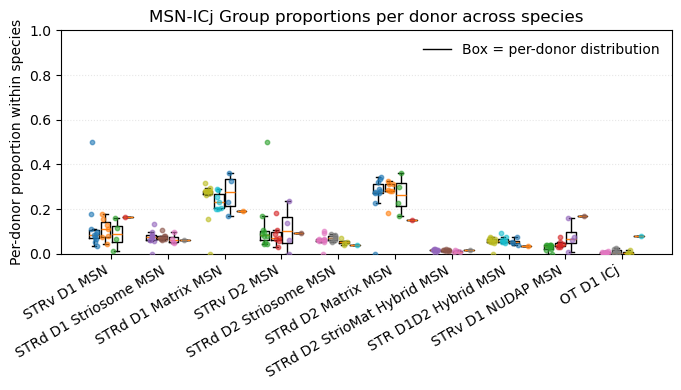

In [10]:
# --- subset to the three MSN subclasses ---
#selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"]
selected = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
obs = adata_msn.obs[adata_msn.obs["Group_propagated"].isin(selected)].copy()

# --- per-donor totals (MSN cells) within species ---
totals = (obs.groupby(["organism","donor_id"])
            .size()
            .rename("total_msn_per_donor"))

# --- per-donor subclass counts ---
counts = (obs.groupby(["organism","donor_id","Group_propagated"])
            .size()
            .rename("n_cells"))

# merge and compute per-donor proportion of each subclass
df = (counts.reset_index()
            .merge(totals.reset_index(), on=["organism","donor_id"], how="left"))
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]

# desired orders
subclass_order =['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']
species_order  = [sp for sp in ["Human","Macaque","Marmoset", "Mouse"] if sp in df["organism"].unique()]

# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
labels_pos  = []
x = np.arange(len(subclass_order))      # 3 groups
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp,1)

positions = []
for i, sc in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[(df["Group_propagated"]==sc) & (df["organism"]==sp), "proportion"].dropna().values
        data_lists.append(vals)
        # x-position for this box
        pos = x[i] + (j - (nsp-1)/2)*dx
        positions.append(pos)

# --- plot ---
fig, ax = plt.subplots(figsize=(7, 4))

# boxplot 
bp = ax.boxplot(
    data_lists,
    positions=positions,
    widths=dx*0.85,
    manage_ticks=False,
    showfliers=False
)


rng = np.random.default_rng(0)
for vals, pos in zip(data_lists, positions):
    if len(vals):
        jitter = (rng.random(len(vals)) - 0.5) * dx*0.6
        ax.scatter(np.full_like(vals, pos)+jitter, vals, s=10, alpha=0.6, zorder=3)


ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")

ax.set_ylabel("Per-donor proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN-ICj Group proportions per donor across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)


from matplotlib.lines import Line2D
legend_handles = [Line2D([0],[0], color="black", lw=1)]
legend_labels  = ["Box = per-donor distribution"]
ax.legend(legend_handles, legend_labels, frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


In [7]:
adata_msn_mouse = adata_msn[adata_msn.obs["organism"].isin(['Mouse'])].copy()

In [10]:
adata_msn_mouse

AnnData object with n_obs × n_vars = 84699 × 15466
    obs: 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster', 'cluster_id', 'cell_type_ontology_term', 'load_id', 'donor_id', 'assay', 'assay_ontology_term_id', 'organism', 'organism_ontology_term_id', 'development_stage', 'anatomical_region', 'anatomical_region_merged', 'anatomical_region_ontology_term_id', 'brain_region_ontology_term_id', 'self_reported_sex', 'self_reported_sex_ontology_term_id', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'disease', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'total_counts', 'total_genes', 'doublet_score', 'organism_sci', 'accession_group', 'embedding_set', 'CL:ID_group', 'tokens_group', 'display_order_group', 'literature_support', 'literature_name_short', 'literature_name_long', 'curated_markers', 'color_hex_group', 'color_group', 'accession_subclass', 'CL:ID_subclass', 'tokens_subclass', 'display_order_subclass', 'color_hex_subclass', 'color_sub

In [12]:
sc.pp.normalize_total(adata_msn_mouse, target_sum=1e6)
sc.pp.log1p(adata_msn_mouse)

In [16]:
group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 
               'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj',
               'AMY-SLEA-BNST D1 GABA', 'AMY-SLEA-BNST GABA', 'STR FS PTHLH-PVALB GABA', 'STR LYPD6-RSPO2 GABA','STR SST-ADARB2 GABA', 'STR TAC3-PLPP4 GABA', 'STR-BF TAC3-PLPP4-LHX8 GABA',]
adata_msn_mouse.obs['Group_propagated'] = pd.Categorical(adata_msn_mouse.obs['Group_propagated'],
                                          categories=group_order,
                                          ordered=True)

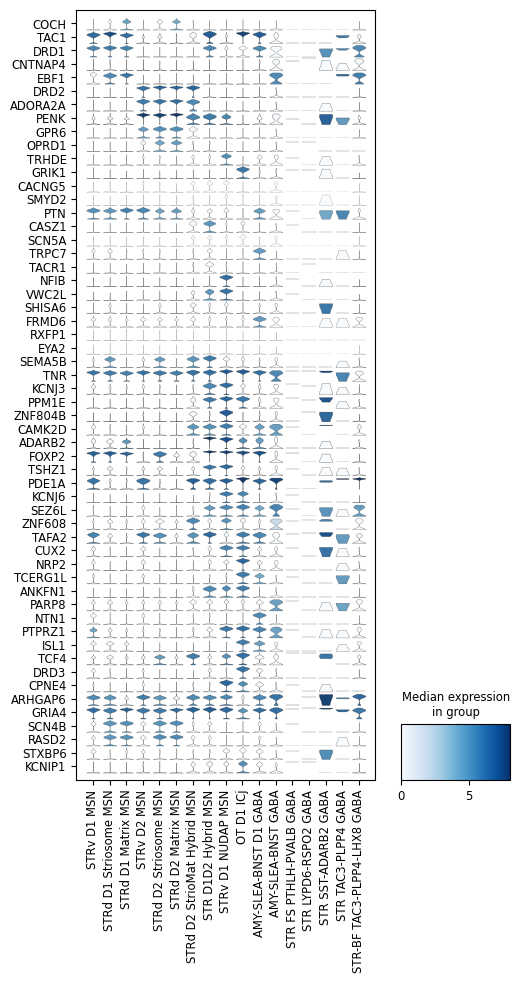

In [18]:
import scanpy as sc

list1 = ['COCH', # drd1 + drd2
         'TAC1', 'DRD1', 'CNTNAP4', 'EBF1', # DRD1 #'PDYN',
        'DRD2', 'ADORA2A', 'PENK', 'GPR6', 'OPRD1',  # DRD2
        'TRHDE',   # striomat hybrid + d1d2 hyrbid + nudap
        'GRIK1', 'CACNG5',  #striomat hybrid + d1d2 hyrbid
        'SMYD2', 'PTN', #striomat hybrid
        'CASZ1', 'SCN5A', 'TRPC7', 'TACR1', #d1d2 hybrid
        'NFIB',  'VWC2L', 'SHISA6', 'FRMD6',  #nudap  'NFIX',  #'ITGA6',   'ELAVL4'
        'RXFP1', 'EYA2', # d1d2 hybrid + nudap
        'SEMA5B', 'TNR', 'KCNJ3', 'PPM1E', 'ZNF804B', 'CAMK2D', 'ADARB2', # d1d2 hybrid + nudap + ICj
        'FOXP2', 'TSHZ1', # d1d2 hybrid + nudap + ICj (foxp1_d1; tshz1_striosome)
        'PDE1A', 'KCNJ6', 'SEZ6L', 'ZNF608', 'TAFA2', 'CUX2', 'NRP2', 'TCERG1L', 'ANKFN1', 'PARP8',  #nudap + icj
        'NTN1', 'PTPRZ1',  'ISL1', 'TCF4', 'DRD3', 'CPNE4', #ICJ  
        'ARHGAP6', 'GRIA4', # Ventral; 'COL19A1', 'FGFR2','PKP2', 
        'SCN4B', 'RASD2',  # dorsal !!! (strio, mat) 
        'STXBP6',  # Matrix;  'GLI3', 'TCF7L1',  
        'KCNIP1', #striosome
       ]

sc.pl.stacked_violin(
    adata_msn_mouse, 
    list1, 
    groupby='Group_propagated', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(5.6,10),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

In [15]:
set(adata_msn_mouse.obs['Subclass_propagated'])

{'OT Granular GABA', 'STR D1 MSN', 'STR D2 MSN', 'STR Hybrid MSN'}

In [14]:
set(adata_msn_mouse.obs['Group_propagated'])

{'AMY-SLEA-BNST D1 GABA',
 'AMY-SLEA-BNST GABA',
 'OT D1 ICj',
 'STR D1D2 Hybrid MSN',
 'STR FS PTHLH-PVALB GABA',
 'STR LYPD6-RSPO2 GABA',
 'STR SST-ADARB2 GABA',
 'STR TAC3-PLPP4 GABA',
 'STR-BF TAC3-PLPP4-LHX8 GABA',
 'STRd D1 Matrix MSN',
 'STRd D1 Striosome MSN',
 'STRd D2 Matrix MSN',
 'STRd D2 StrioMat Hybrid MSN',
 'STRd D2 Striosome MSN',
 'STRv D1 MSN',
 'STRv D1 NUDAP MSN',
 'STRv D2 MSN'}

#### spatial dorsal/ventral genes

In [ ]:
selected = ["STR D1D2 Hybrid MSN", "STRv D1 NUDAP MSN",'STRd D1 Matrix MSN','STRd D1 Striosome MSN','STRv D1 MSN', 'STRd D2 Matrix MSN','STRd D2 Striosome MSN','STRv D2 MSN','STRd D2 StrioMat Hybrid MSN',]
adata_msn_true = adata_msn[adata_msn.obs["Group_propagated"].isin(selected)].copy()

group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 
               'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj',
               ]
adata_msn_true.obs['Group_propagated'] = pd.Categorical(adata_msn_true.obs['Group_propagated'],
                                          categories=group_order,
                                          ordered=True)

In [ ]:
sc.pp.normalize_total(adata_msn_true, target_sum=1e6)
sc.pp.log1p(adata_msn_true)

In [ ]:
import scanpy as sc

list1 = ['CNR1', 'TESPA1', #dorsal
         'CRYM', 'ST6GALNAC5', 'DPP10', 'ARHGAP6', 'GDA' #ventral
       ]

sc.pl.dotplot(
    adata_msn_true,
    var_names=list1, 
    groupby=["Group_propagated", 'organism'], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=True,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)


## for fig3. panel A (10 Groups here)

### my curated gene list

In [3]:
adata_msn=sc.read_h5ad("Consensus_preprint_3species_MSNs-ICj_withlogCPM_X.h5ad") #10 groups

In [4]:
#group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 
#               'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj',
#               ]
group_order = [ 'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN', 'STRv D1 MSN',  'STRd D2 Matrix MSN', 'STRd D2 Striosome MSN', 'STRv D2 MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj']

adata_msn.obs['Group'] = pd.Categorical(adata_msn.obs['Group'],
                                          categories=group_order,
                                          ordered=True)

In [26]:
list1 = ['COCH', # drd1 + drd2
         'TAC1', 'DRD1', 'CNTNAP4', 'EBF1', # DRD1 #'PDYN',
         'DRD2', 'ADORA2A', 'PENK', 'GPR6', 'OPRD1',  # DRD2
         'KCNT2', # striomat hybrid + d1d2 hyrbid + nudap + ICj
         'TRHDE',   # striomat hybrid + d1d2 hyrbid + nudap
         'GRIK1', 'CACNG5',  #striomat hybrid + d1d2 hyrbid
         'SMYD2', 'PTN', 'SULF2',  #striomat hybrid
         'CASZ1', 'SCN5A', 'TRPC7', 'TACR1', #d1d2 hybrid
         'NFIB',  'VWC2L', 'SHISA6', 'FRMD6',  #nudap  'NFIX',  #'ITGA6',   'ELAVL4'
         'RXFP1', 'EYA2', # d1d2 hybrid + nudap
         'SEMA5B', 'TNR', 'KCNJ3', 'PPM1E', 'ZNF804B', 'CAMK2D', 'ADARB2', # d1d2 hybrid + nudap + ICj
         'FOXP2', 'TSHZ1', # d1d2 hybrid + nudap + ICj (foxp1_d1; tshz1_striosome)
         'PDE1A', 'KCNJ6', 'SEZ6L', 'ZNF608', 'TAFA2', 'CUX2', 'NRP2', 'TCERG1L', 'ANKFN1', 'PARP8',  #nudap + icj
         'NTN1', 'PTPRZ1',  'ISL1', 'TCF4', 'DRD3', 'CPNE4', #ICJ  
         'ARHGAP6', 'GRIA4', # Ventral; 'COL19A1', 'FGFR2','PKP2', 
         'SCN4B', 'RASD2',  # dorsal !!! (strio, mat) 
         'STXBP6',  # Matrix;  'GLI3', 'TCF7L1',  
         'KCNIP1', #striosome
        ]

sc.pl.stacked_violin(
    adata_msn, 
    list1, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

AttributeError: 'str' object has no attribute 'pl'

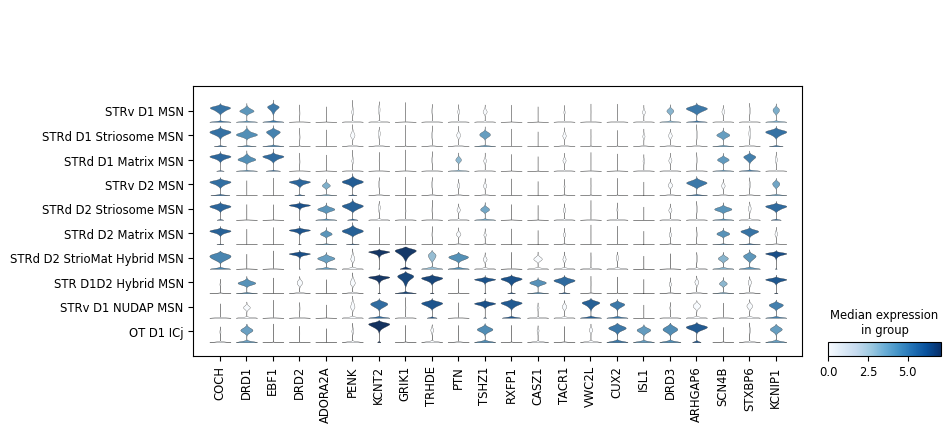

In [7]:
list2 = ['COCH','DRD1','EBF1','DRD2','ADORA2A','PENK','KCNT2','GRIK1','TRHDE','PTN','TSHZ1','RXFP1','CASZ1','TACR1','VWC2L','CUX2','ISL1','DRD3','ARHGAP6','SCN4B','STXBP6','KCNIP1']

sc.pl.stacked_violin(
    adata_msn, 
    list2, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

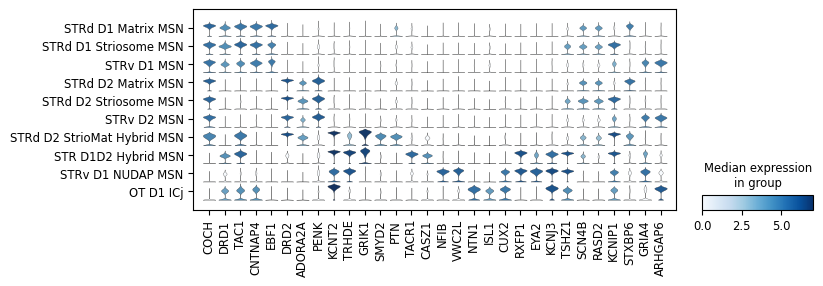

In [5]:
import scanpy as sc
list3 = ['COCH',
         'DRD1', 'TAC1', 'CNTNAP4', 'EBF1',#
         'DRD2','ADORA2A','PENK', #
         'KCNT2','TRHDE','GRIK1','SMYD2','PTN',  #'CACNG5','SMYD2',
         'TACR1','CASZ1', 'NFIB','VWC2L',
         'NTN1','ISL1',
         'CUX2',
         'RXFP1', 'EYA2',
         'KCNJ3', 'TSHZ1', #'ADARB2', 
         'SCN4B','RASD2','KCNIP1','STXBP6', 'GRIA4','ARHGAP6'
        ]

sc.pl.stacked_violin(
    adata_msn, 
    list3, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    figsize=(8,2.6),
    #cmap='rainbow', #Blues
    dendrogram=False,
    save="Violinplot_of_MSNs_fig2a.pdf"
)

In [14]:
### add expressologs_AUROC values for panel B first (then for panel G).
df = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/expressologs//MSN_vignette/group/group_expressologs_MSN_auroc_tau_metrics.csv") #for primate!!!
df

,gene,human,macaque,marmoset,xspecies_mean,xspecies_median,xspecies_min,xspecies_max,xspecies_recurrence,species1,species2,sp1_expr_stat,sp2_expr_stat,expr_cor,sp_order,median_cor,rank,auroc
0,A1BG,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,marmoset,macaque,0.004134,0.028733,0.743588,2,0.369119,6940,0.417318
1,A1BG,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,marmoset,human,0.004134,0.092533,0.103231,1,0.369119,6940,0.417318
2,A1BG,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,human,marmoset,0.092533,0.004134,0.103231,2,0.369119,6940,0.417318
3,A1BG,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,human,macaque,0.092533,0.028733,0.369119,2,0.369119,6940,0.417318
4,A1BG,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,macaque,human,0.028733,0.092533,0.369119,1,0.369119,6940,0.417318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99595,ZZEF1,0.099871,0.105707,0.164681,0.12342,0.105707,0.099871,0.164681,0.0,macaque,marmoset,0.373012,0.521876,0.611830,1,0.534662,9482,0.570174
99596,ZZEF1,0.099871,0.105707,0.164681,0.12342,0.105707,0.099871,0.164681,0.0,human,macaque,0.164498,0.373012,0.305460,2,0.534662,9482,0.570174
99597,ZZEF1,0.099871,0.105707,0.164681,0.12342,0.105707,0.099871,0.164681,0.0,macaque,human,0.373012,0.164498,0.305460,1,0.534662,9482,0.570174
99598,ZZEF1,0.099871,0.105707,0.164681,0.12342,0.105707,0.099871,0.164681,0.0,marmoset,macaque,0.521876,0.373012,0.611830,2,0.534662,9482,0.570174


In [15]:
list3 = ['COCH',
         'DRD1', 'TAC1', 'CNTNAP4', 'EBF1',#
         'DRD2','ADORA2A','PENK', #
         'KCNT2','TRHDE','GRIK1','SMYD2','PTN',  #'CACNG5','SMYD2',
         'TACR1','CASZ1', 'NFIB','VWC2L',
         'NTN1','ISL1',
         'CUX2',
         'RXFP1', 'EYA2',
         'KCNJ3', 'TSHZ1', #'ADARB2', 
         'SCN4B','RASD2','KCNIP1','STXBP6', 'GRIA4','ARHGAP6'
        ]


/scratch/fast/4733333/ipykernel_71521/278893459.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique["gene_up"] = df_unique["gene"].astype(str).str.upper()


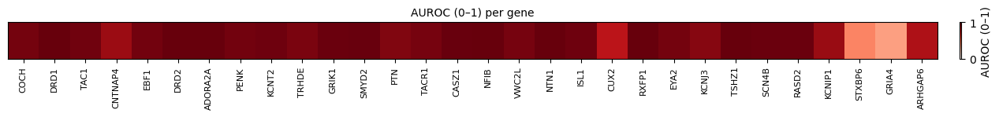

In [24]:
df_unique = df.drop_duplicates(subset=["gene"], keep="first")

genes_order = [g.strip().upper() for g in list3]
df_unique["gene_up"] = df_unique["gene"].astype(str).str.upper()
sub = df_unique[df_unique["gene_up"].isin(genes_order)].copy()
sub = sub.set_index("gene_up").reindex(genes_order)

vals = sub["auroc"].fillna(0).clip(0, 1).values.reshape(1, -1)


fig, ax = plt.subplots(figsize=(0.45 * len(genes_order) + 1, 1.6))
im = ax.imshow(vals, aspect="auto", vmin=0, vmax=1, cmap="Reds")  #Reds

ax.set_yticks([])
ax.set_xticks(np.arange(len(genes_order)))
ax.set_xticklabels(genes_order, rotation=90, ha="center", fontsize=8)
ax.set_title("AUROC (0–1) per gene", fontsize=10)

# colorbar
cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label("AUROC (0–1)")

plt.tight_layout()
plt.savefig("AUROC_strip_list3.pdf", bbox_inches="tight")
plt.show()


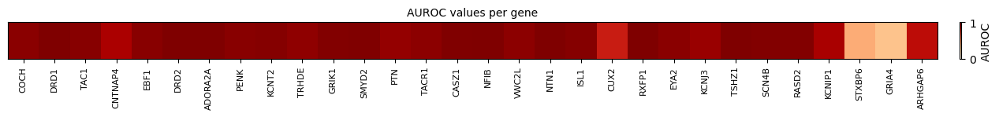

In [22]:
df_unique = df.drop_duplicates(subset=["gene"], keep="first")

sub = df_unique[df_unique["gene"].isin(list3)].copy()
sub = sub.set_index("gene").reindex(list3)

vals = sub["auroc"].fillna(0).clip(0, 1).values.reshape(1, -1)


fig, ax = plt.subplots(figsize=(0.45 * len(list3) + 1, 1.6))
im = ax.imshow(vals, aspect="auto", vmin=0, vmax=1, cmap="OrRd")  #Reds

ax.set_yticks([])
ax.set_xticks(np.arange(len(list3)))
ax.set_xticklabels(list3, rotation=90, ha="center", fontsize=8)
ax.set_title("AUROC values per gene", fontsize=10)

# colorbar
cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label("AUROC")

plt.tight_layout()
plt.savefig("AUROC_strip_list3_2.pdf", bbox_inches="tight")
plt.show()


In [3]:
df = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/expressologs/MSN_vignette/group/expressologs_MSN_with_mouse_group.csv")
df

,gene,species1,species2,sp1_expr_stat,sp2_expr_stat,expr_cor,sp_order
0,PLEKHJ1,mouse,macaque,0.084344,0.024936,0.133857,1
1,SNX7,mouse,macaque,0.174016,0.988156,0.304168,1
2,TMEM9B,mouse,macaque,0.045871,0.062167,0.692223,1
3,CAPSL,mouse,macaque,0.006426,0.009346,-0.022889,1
4,PLEKHM2,mouse,macaque,0.062689,0.188731,0.618267,1
...,...,...,...,...,...,...,...
185587,STRBP,human,marmoset,0.275842,0.533815,0.585912,2
185588,IL31RA,human,marmoset,0.005653,0.002933,0.542758,2
185589,NUCKS1,human,marmoset,0.125556,0.197054,-0.314177,2
185590,ATXN10,human,marmoset,0.115473,0.344509,0.176505,2


In [10]:
accessologs = df 
## Compute rank and auroc
accessologs['median_cor'] = accessologs.groupby('gene')['expr_cor'].transform('median')
accessologs = accessologs.sort_values(by='median_cor', ascending=True).reset_index(drop=True)
accessologs['rank'] = accessologs['median_cor'].rank(method='dense', ascending=True)
accessologs['auroc'] = accessologs['rank'] / accessologs['gene'].nunique()
accessologs

,gene,species1,species2,sp1_expr_stat,sp2_expr_stat,expr_cor,sp_order,median_cor,rank,auroc
0,DQX1,mouse,macaque,0.003758,0.006685,-0.842768,1,-0.612624,1.0,0.000065
1,DQX1,human,macaque,0.010741,0.006685,-0.728273,2,-0.612624,1.0,0.000065
2,DQX1,marmoset,macaque,0.002965,0.006685,0.512946,2,-0.612624,1.0,0.000065
3,DQX1,mouse,marmoset,0.003758,0.002965,-0.496976,1,-0.612624,1.0,0.000065
4,DQX1,macaque,mouse,0.006685,0.003758,-0.842768,2,-0.612624,1.0,0.000065
...,...,...,...,...,...,...,...,...,...,...
185587,HOXD12,marmoset,human,0.000000,0.000039,NaN,1,NaN,NaN,NaN
185588,HOXA1,human,marmoset,0.000014,0.000000,NaN,2,NaN,NaN,NaN
185589,FOXB2,human,marmoset,0.000000,0.000000,NaN,2,NaN,NaN,NaN
185590,KRTAP29-1,human,marmoset,0.000024,0.000000,NaN,2,NaN,NaN,NaN


In [11]:
df = accessologs

In [12]:
import scanpy as sc
d2striomatlist_ordered= [
    'FAT1','SLITRK4', #D2StrioMat
    'CACNA2D2','CACNG5', 'IQSEC3', #D2StrioMat + eccentric_hybrid
    'ALK', 'LUZP2', 'NTNG1','SYP',  'KCNT2', 'ATP2B4','PLCXD3', 'PPM1E', 'PCDH15',  'TAC1', #D2StrioMat + eccentric + ICj
    'VSNL1', 'SCG2','KLF12',   #D2StrioMat + Ventral(STRv D1.D2, NUDAP, ICj)
    'SPON1','TRAF3', 'KCNIP1','BACH2',  #D2StrioMat + eccentric_hybrid + Strio
    'GABRA3', 'TCF4', # only 1-2 groups in high-level expression acorss 10 groups
    'SYT6', #D1 Strio, StrioMat, OT-ICj 
    #'SLITRK1','SOCS2', 'ELAVL4',# no high-level expression across 10 groups
    #'GPC6','SEMA6D','PDE4A', 'BASP1','HCN1','RBM20',  'ZNF804A', 'PTPRS', 'BCL11A','GAD1', 'DSCAML1',  'PPM1L', 'NETO1',  'OLFM3', 'PCDH10', 'GALNTL6',  'OXR1', 'MAML3','PTPRT', 'DPP10', 'RAB3C', 'SLC35F1', 'FOXN3', 'GRIP1',  #  high-level expression across 10 groups
] #left/unique gene list of 52 genes from Veen


/scratch/fast/5234240/ipykernel_814721/3977135113.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique["gene_up"] = df_unique["gene"].astype(str).str.upper()


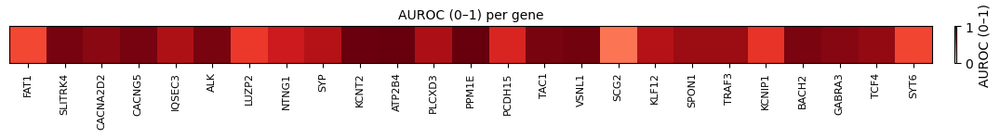

In [13]:
df_unique = df.drop_duplicates(subset=["gene"], keep="first")

genes_order = [g.strip().upper() for g in d2striomatlist_ordered]
df_unique["gene_up"] = df_unique["gene"].astype(str).str.upper()
sub = df_unique[df_unique["gene_up"].isin(genes_order)].copy()
sub = sub.set_index("gene_up").reindex(genes_order)

vals = sub["auroc"].fillna(0).clip(0, 1).values.reshape(1, -1)


fig, ax = plt.subplots(figsize=(0.45 * len(genes_order) + 1, 1.6))
im = ax.imshow(vals, aspect="auto", vmin=0, vmax=1, cmap="Reds")  #Reds

ax.set_yticks([])
ax.set_xticks(np.arange(len(genes_order)))
ax.set_xticklabels(genes_order, rotation=90, ha="center", fontsize=8)
ax.set_title("AUROC (0–1) per gene", fontsize=10)

# colorbar
cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label("AUROC (0–1)")

plt.tight_layout()
plt.savefig("AUROC_strip_d2striomatlist_ordered.pdf", bbox_inches="tight")
plt.show()


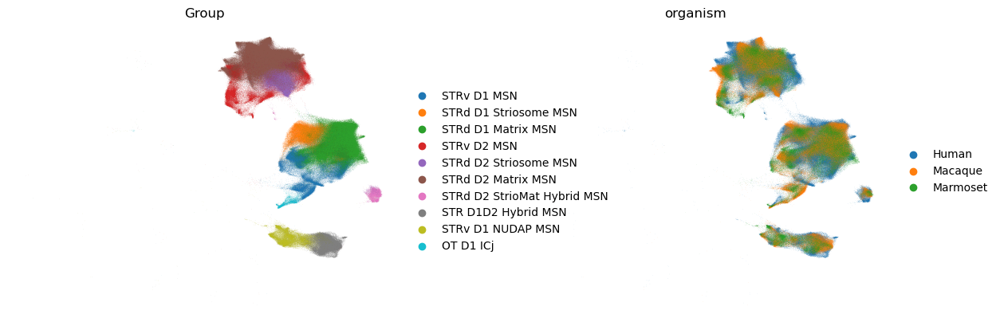

In [28]:
sc.pl.embedding(
    adata_msn,
    basis="X_umap",
    color=['Group', 'organism'],
    frameon=False,
)

In [10]:
adata_msn

AnnData object with n_obs × n_vars = 848201 × 16630
    obs: 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster', 'cluster_id', 'cell_type_ontology_term', 'load_id', 'donor_id', 'assay', 'assay_ontology_term_id', 'organism', 'organism_ontology_term_id', 'development_stage', 'anatomical_region', 'anatomical_region_merged', 'anatomical_region_ontology_term_id', 'brain_region_ontology_term_id', 'self_reported_sex', 'self_reported_sex_ontology_term_id', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'disease', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'atac_confidently_mapped_read_pairs', 'atac_fraction_of_genome_in_peaks', 'atac_fraction_of_high_quality_fragments_in_cells', 'atac_fraction_of_high_quality_fragments_overlapping_tss', 'atac_fraction_of_high_quality_fragments_overlapping_peaks', 'atac_fraction_of_transposition_events_in_peaks_in_cells', 'atac_mean_raw_read_pairs_per_cell', 'atac_median_high_quality_fragments_per_cell', 'atac

In [ ]:
list4 = ['SCN4B','RASD2','STXBP6','KCNIP1','ARHGAP6','GRIA4',]

group_order = ['STRd D1 Striosome MSN', 'STRd D2 Striosome MSN', 'STRd D1 Matrix MSN', 'STRd D2 Matrix MSN', 
               'STRd D2 StrioMat Hybrid MSN', 'STRv D1 MSN', 'STRv D2 MSN',  'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj',
               ]
adata_msn.obs['Group'] = pd.Categorical(adata_msn.obs['Group'],
                                          categories=group_order,
                                          ordered=True)

sc.pl.stacked_violin(
    adata_msn, 
    list4, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    save="Violinplot_of_MSNs_fig2a_dorsalVentral.pdf"
)

In [ ]:
group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 
               'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj',
               ]
adata_msn.obs['Group'] = pd.Categorical(adata_msn.obs['Group'],
                                          categories=group_order,
                                          ordered=True)


list5 = ['COCH',
         'DRD1', 'CNTNAP4', 'EBF1',#
         'DRD2','ADORA2A','PENK', #
         'KCNT2','TRHDE','GRIK1','SMYD2','PTN',  #'CACNG5','SMYD2',
         'TACR1','CASZ1', 'NFIB','VWC2L',
         'NTN1','ISL1',
         'CUX2',
         'RXFP1', #'EYA2',
         'TSHZ1', #'KCNJ3',
         'SCN4B','RASD2','KCNIP1','STXBP6', 'GRIA4','ARHGAP6',
        ]

sc.pl.stacked_violin(
    adata_msn, 
    list5, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    save="Violinplot_of_MSNs_fig2a-2.pdf"
)

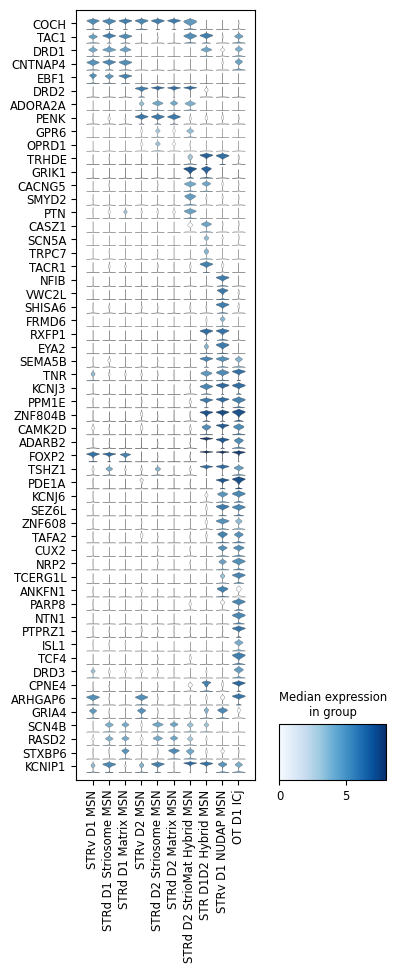

In [14]:
sc.pl.stacked_violin(
    adata_msn, 
    list1, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(4,10),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

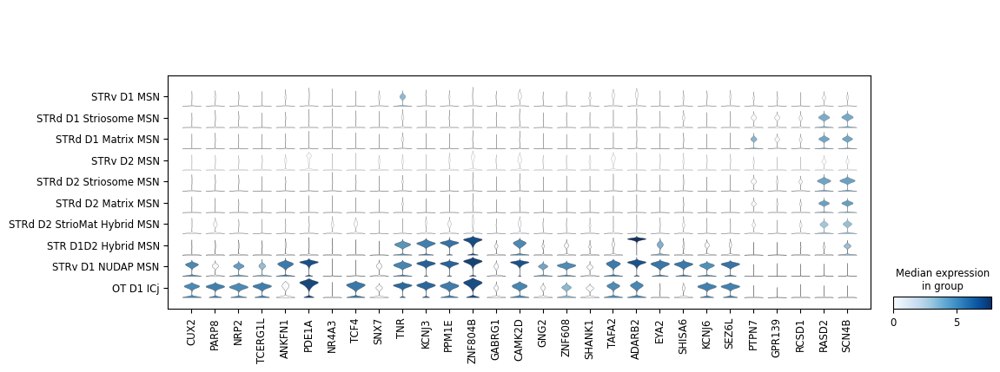

In [10]:
list2 = ['CUX2', 'PARP8', 'NRP2', 'TCERG1L', 'ANKFN1', 'PDE1A', 'NR4A3', 'TCF4', 'SNX7', 'TNR', 'KCNJ3', 'PPM1E', 'ZNF804B', 'GABRG1', 'CAMK2D', 'GNG2', 'ZNF608', 
'SHANK1', 'TAFA2', 'ADARB2', 'EYA2', 'SHISA6', 'KCNJ6', 'SEZ6L', 'PTPN7', 'GPR139', 'RCSD1', 'RASD2', 'SCN4B'] 


sc.pl.stacked_violin(
    adata_msn, 
    list2, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

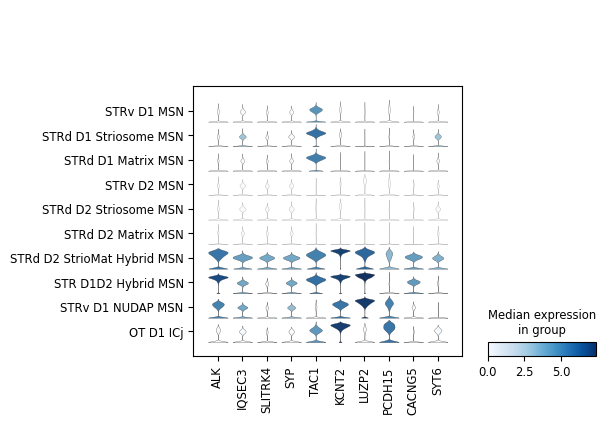

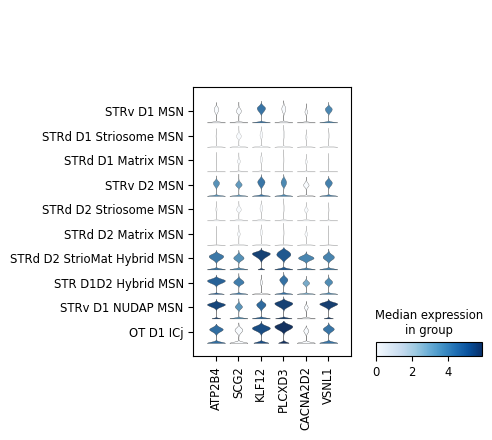

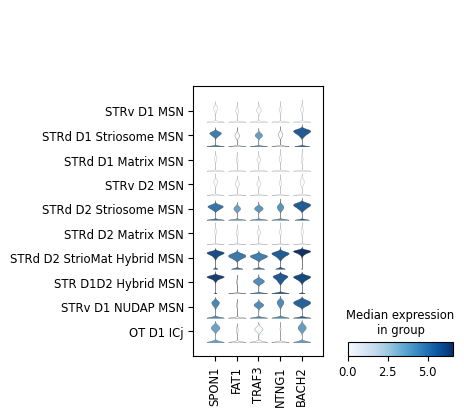

In [6]:
## for ##D2StrioMat## _highly_expr_genes_inD2MSNs

species4_conserved_curated = ['ALK', 'IQSEC3', 'SLITRK4', 'SYP', 'TAC1', 'KCNT2', 'LUZP2', 'PCDH15', 'CACNG5', 'SYT6']
species4_conserved_curated2 = ['ATP2B4', 'SCG2', 'KLF12', 'PLCXD3', 'CACNA2D2', 'VSNL1']
species4_conserved_curated3 = ['SPON1', 'FAT1', 'TRAF3', 'NTNG1', 'BACH2']


sc.pl.stacked_violin(
    adata_msn, 
    species4_conserved_curated, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_MSNs_fig2a-2.pdf"
)

sc.pl.stacked_violin(
    adata_msn, 
    species4_conserved_curated2, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_MSNs_fig2a-2.pdf"
)

sc.pl.stacked_violin(
    adata_msn, 
    species4_conserved_curated3, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_MSNs_fig2a-2.pdf"
)

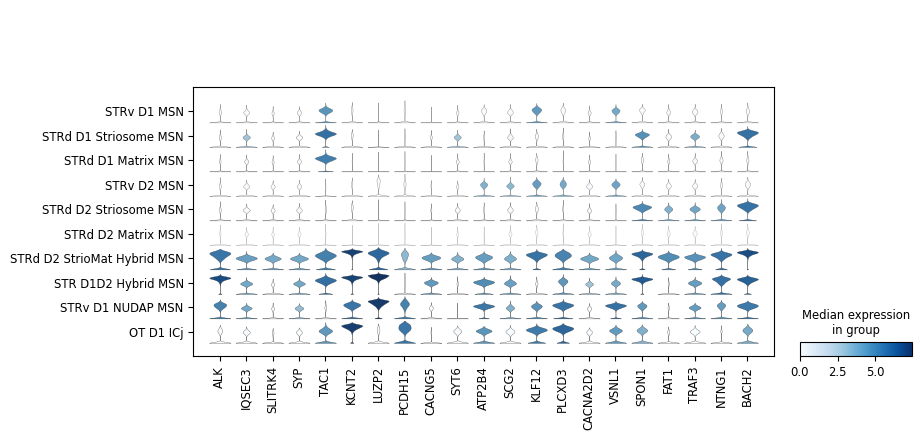

In [9]:
species4_conserved_curated4 = ['ALK', 'IQSEC3', 'SLITRK4', 'SYP', 'TAC1', 'KCNT2', 'LUZP2', 'PCDH15', 'CACNG5', 'SYT6', 'ATP2B4', 'SCG2', 'KLF12', 'PLCXD3', 'CACNA2D2', 'VSNL1','SPON1', 'FAT1', 'TRAF3', 'NTNG1', 'BACH2']


sc.pl.stacked_violin(
    adata_msn, 
    species4_conserved_curated4, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_MSNs_fig2a-2.pdf"
)

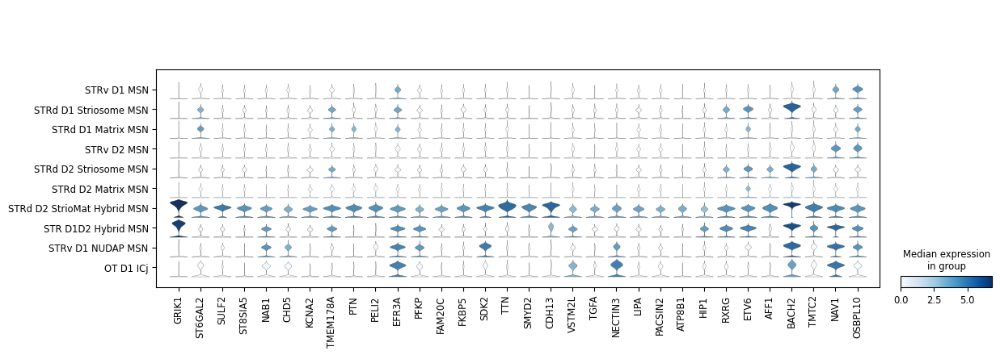

In [8]:
primate3_conserved_curated4 = ['GRIK1', 'ST6GAL2',  'SULF2', 'ST8SIA5', 'NAB1', 'CHD5', 'KCNA2', 'TMEM178A', 'PTN', 'PELI2', 'EFR3A', 'PFKP', 'FAM20C', 'FKBP5', 'SDK2', 'TTN', 'SMYD2', 'CDH13', 
                              'VSTM2L', 'TGFA', 'NECTIN3', 'LIPA', 'PACSIN2', 'ATP8B1',  'HIP1', 'RXRG', 'ETV6', 'AFF1', 'BACH2', 'TMTC2', 'NAV1', 'OSBPL10'] #'ACVR18',  'SLC05A1' not in mouse but also 



sc.pl.stacked_violin(
    adata_msn, 
    primate3_conserved_curated4, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_MSNs_fig2a-2.pdf"
)

### for panel E proportions

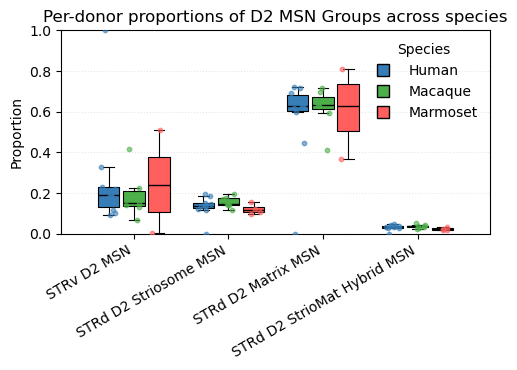

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- subset to the three MSN subclasses ---
selected = ['STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN']
obs = adata_msn.obs[adata_msn.obs["Group"].isin(selected)].copy()

# --- per-donor totals (MSN cells) within species ---
totals = (obs.groupby(["organism","donor_id"])
            .size()
            .rename("total_msn_per_donor"))

# --- per-donor subclass counts ---
counts = (obs.groupby(["organism","donor_id","Group"])
            .size()
            .rename("n_cells"))

# merge and compute per-donor proportion of each subclass
df = (counts.reset_index()
            .merge(totals.reset_index(), on=["organism","donor_id"], how="left"))
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]

# desired orders
subclass_order = ['STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN']
species_order  = [sp for sp in ["Human","Macaque","Marmoset"] if sp in df["organism"].unique()]

# --- assign species colors ---
species_colors = {
    "Human": "#377eb8",      # blue
    "Macaque": "#4daf4a",    # green
    "Marmoset": "#FF5F5D"    # orange
}


# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
positions = []
colors = []

x = np.arange(len(subclass_order))
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp,1)

for i, sc in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[(df["Group"]==sc) & (df["organism"]==sp), "proportion"].dropna().values
        data_lists.append(vals)
        pos = x[i] + (j - (nsp-1)/2)*dx
        positions.append(pos)
        colors.append(species_colors[sp])

# --- plot ---
fig, ax = plt.subplots(figsize=(5.1, 3.8))

# Draw boxplots, one per color
for vals, pos, c in zip(data_lists, positions, colors):
    if len(vals) == 0:
        continue
    bp = ax.boxplot(
        [vals],
        positions=[pos],
        widths=dx*0.85,
        patch_artist=True,
        showfliers=False,
        boxprops=dict(facecolor=c, color="black", linewidth=0.8),
        medianprops=dict(color="black", linewidth=1),
        whiskerprops=dict(color="black", linewidth=0.8),
        capprops=dict(color="black", linewidth=0.8)
    )

# overlay jittered points
rng = np.random.default_rng(0)
for vals, pos, c in zip(data_lists, positions, colors):
    if len(vals):
        jitter = (rng.random(len(vals)) - 0.5) * dx*0.6
        ax.scatter(np.full_like(vals, pos)+jitter, vals, s=10, color=c, alpha=0.6, zorder=3)

# --- labels and aesthetics ---
ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")
ax.set_ylabel("Proportion")
ax.set_ylim(0, 1)
ax.set_title("Per-donor proportions of D2 MSN Groups across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)

# --- legend for species colors ---
legend_handles = [Line2D([0], [0], marker='s', color='none', markerfacecolor=species_colors[sp], 
                         markersize=8, label=sp) for sp in species_order]
ax.legend(handles=legend_handles, frameon=False, title="Species", loc="upper right")

plt.tight_layout()

# --- save figure ---
plt.savefig("D2_Group_proportions_per_donor_across_species.pdf",
            format="pdf", bbox_inches="tight")

plt.show()


In [6]:
g = "STRd D2 StrioMat Hybrid MSN"

df_last = df[df["Group"] == g]

df_last["proportion"].describe()

count    21.000000
mean      0.032071
std       0.011465
min       0.000000
25%       0.027679
50%       0.033978
75%       0.036726
max       0.052211
Name: proportion, dtype: float64

In [7]:
df_last["proportion"].agg(["min", "max", "median", "mean"])

min       0.000000
max       0.052211
median    0.033978
mean      0.032071
Name: proportion, dtype: float64

### gene list from He et al & what we've known or used as markers

In [57]:
marker_list_he= ['DRD1', 'TAC1', 'DRD2', 'PENK', 'CPNE4', 'ARHGAP6', 'GRIA4', 'KCNIP1', 'STXBP6', 'RXFP1', 'FOXP2', 'TSHZ1', 'CASZ1', 'GRIK1']

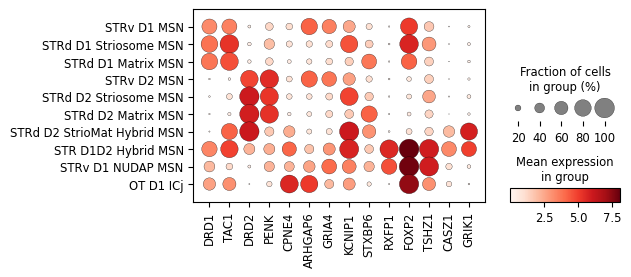

In [58]:
sc.pl.dotplot(
    adata_msn,
    var_names=marker_list_he, 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)


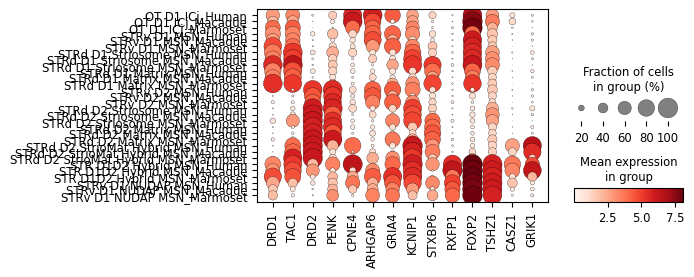

In [69]:
sc.pl.dotplot(
    adata_msn,
    var_names=marker_list_he, 
    groupby=["Group", 'organism'], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)


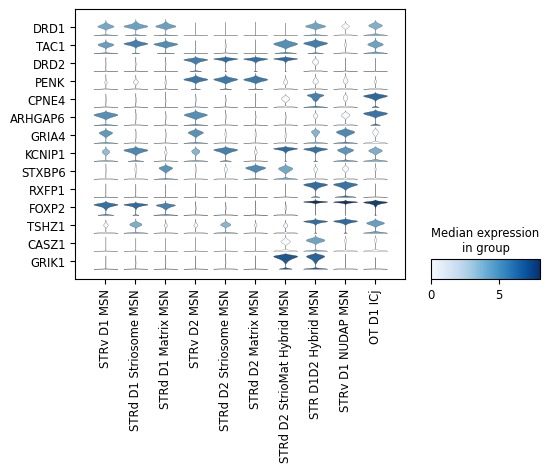

In [59]:
sc.pl.stacked_violin(
    adata_msn, 
    marker_list_he, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

### TFs

In [6]:
df_tfs = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/Human/BasalGanglia/analysis/f1" + "/TFs_lambert_pmid29425488_1.01.txt")
tf_genes = set(df_tfs["hgnc_symbol"]) 
#tf_genes

### gene list from the primate whole taxonomy expr/tau analysis

In [8]:
df = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/expressologs/group/group_expressologs_auroc_tau_metrics.csv")

In [9]:
df

,gene,human,macaque,marmoset,xspecies_mean,xspecies_median,xspecies_min,xspecies_max,xspecies_recurrence,species1,species2,sp1_expr_stat,sp2_expr_stat,expr_cor,sp_order,median_cor,rank,auroc
0,A1BG,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,marmoset,human,0.014842,0.120798,-0.133270,1,0.089677,1591,0.095670
1,A1BG,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,macaque,human,0.078034,0.120798,0.089677,1,0.089677,1591,0.095670
2,A1BG,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,marmoset,macaque,0.014842,0.078034,0.521229,2,0.089677,1591,0.095670
3,A1BG,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,human,macaque,0.120798,0.078034,0.089677,2,0.089677,1591,0.095670
4,A1BG,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,macaque,marmoset,0.078034,0.014842,0.521229,1,0.089677,1591,0.095670
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99721,ZZEF1,0.328245,0.289661,0.348992,0.322299,0.328245,0.289661,0.348992,0.0,marmoset,human,1.327776,0.841711,0.614672,1,0.614672,10486,0.630547
99722,ZZEF1,0.328245,0.289661,0.348992,0.322299,0.328245,0.289661,0.348992,0.0,human,marmoset,0.841711,1.327776,0.614672,2,0.614672,10486,0.630547
99723,ZZEF1,0.328245,0.289661,0.348992,0.322299,0.328245,0.289661,0.348992,0.0,macaque,human,1.176036,0.841711,0.472288,1,0.614672,10486,0.630547
99724,ZZEF1,0.328245,0.289661,0.348992,0.322299,0.328245,0.289661,0.348992,0.0,human,macaque,0.841711,1.176036,0.472288,2,0.614672,10486,0.630547


In [33]:
filtered_df = df[(df["xspecies_min"] > 0.75) & (df["auroc"] > 0.75)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

941
['A4GALT', 'ABCA8', 'ABCB1', 'ABCC9', 'ABCG2', 'ABTB2', 'ACAN', 'ACKR3', 'ACSBG1', 'ACSF2', 'ACSS1', 'ACSS3', 'ACTA2', 'ACTG2', 'ACVRL1', 'ADAM28', 'ADAM7', 'ADAMTS1', 'ADAMTS2', 'ADAMTS3', 'ADAMTS4', 'ADAP2', 'ADCY4', 'ADCYAP1', 'ADGB', 'ADGRA2', 'ADGRF5', 'ADGRL4', 'ADIRF', 'ADORA2A', 'AFAP1L1', 'AFAP1L2', 'AGBL2', 'AGT', 'AHNAK', 'AHNAK2', 'AIF1L', 'AIFM3', 'AK1', 'AK7', 'AKAIN1', 'AKAP14', 'AKAP5', 'ALDH1A1', 'ALDH1A3', 'ALOX5AP', 'AMIGO2', 'ANKRD66', 'ANKRD9', 'ANLN', 'ANO1', 'ANXA1', 'APOD', 'APOE', 'APOLD1', 'AQP4', 'ARHGAP29', 'ARHGAP42', 'ARHGEF26', 'ARMC3', 'ARMC4', 'ARX', 'ASAH2', 'ASB4', 'ASCL1', 'ASIC4', 'ASPA', 'ATP10A', 'ATP10B', 'ATP1A2', 'AXDND1', 'BARX2', 'BCAM', 'BCAN', 'BCAS1', 'BDNF', 'BGN', 'BIN2', 'BLNK', 'BMP5', 'BMP7', 'BNC2', 'BSPRY', 'C10H3orf18', 'C10H6orf141', 'C13H22orf15', 'C15H16orf89', 'C16H10orf90', 'C16H1orf198', 'C1H1orf141', 'C1H1orf87', 'C1QA', 'C1QB', 'C1QC', 'C1QL1', 'C1QL3', 'C3', 'C4H21orf91', 'C5H4orf19', 'C7', 'C8H11orf96', 'C9H7orf57', '

In [35]:
expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

114
['TBR1', 'TBX2', 'LEF1', 'OLIG1', 'ZNF503', 'LHX2', 'RFX2', 'NPAS1', 'SALL3', 'DLX1', 'ONECUT2', 'FOXA1', 'FOXJ1', 'TCF7L1', 'CREB5', 'LHX8', 'ONECUT1', 'FOSL2', 'POU3F4', 'NKX6-2', 'NFATC2', 'NR2F1', 'GBX1', 'LHX9', 'TP73', 'KLF4', 'SOX4', 'CEBPD', 'POU3F1', 'ZIC3', 'LMX1A', 'ZNF488', 'GATA2', 'MAF', 'FOXO6', 'GATA3', 'TEAD4', 'TBX18', 'NKX2-1', 'FOXD1', 'KLF5', 'MECOM', 'ZNF831', 'FOXQ1', 'FLI1', 'NFIX', 'ERG', 'EBF1', 'RXRG', 'YBX3', 'ESRRB', 'SP8', 'SOX1', 'ST18', 'BNC2', 'GLI3', 'NKX2-2', 'ZIC2', 'MAFB', 'SOX10', 'MEIS1', 'LHX6', 'PRDM16', 'HNF4G', 'TBX15', 'HEY2', 'HEYL', 'ZNF366', 'ETS1', 'SIM2', 'ISL1', 'LMX1B', 'PITX2', 'PAX6', 'PROX1', 'CREB3L1', 'BARX2', 'RREB1', 'TBX3', 'NR4A2', 'SCX', 'ZIC4', 'ASCL1', 'PRDM8', 'SP9', 'RORB', 'OLIG2', 'HES1', 'DBX2', 'OTX2', 'POU3F2', 'KLF2', 'EN1', 'EPAS1', 'SALL1', 'FOXC1', 'ARX', 'EBF3', 'LHX1', 'SOX18', 'NHLH2', 'MYRF', 'TWIST1', 'IRF8', 'ZIC1', 'SIX3', 'TAL1', 'FOXA2', 'ETV1', 'PRRX1', 'TFEC', 'UNCX', 'NR2F2', 'LHX5']


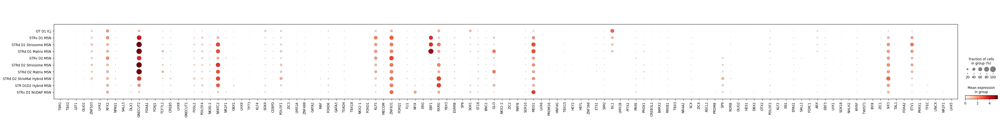

In [36]:
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_tf, 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)


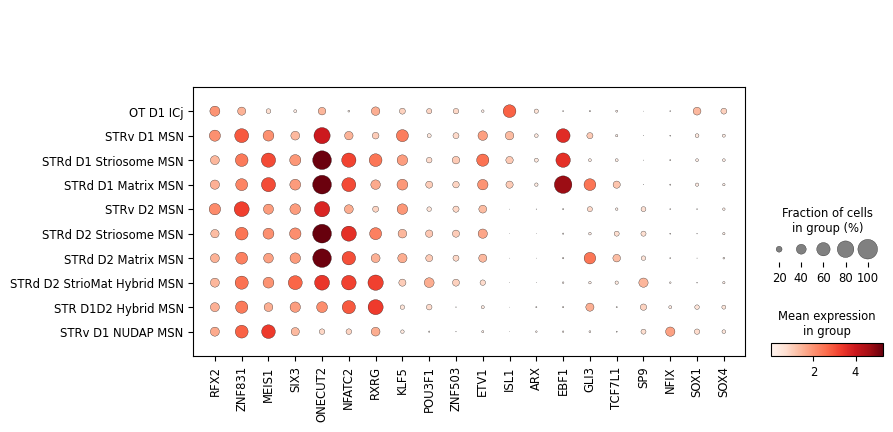

In [39]:
expr_tau_tf_curated = ['RFX2','ZNF831','MEIS1', 'SIX3', 'ONECUT2', 'NFATC2', 'RXRG',  #pan
                       'KLF5', 'POU3F1', 'ZNF503', 'ETV1', 
                       'ISL1','ARX','EBF1', # DRD1
                       'GLI3', 'TCF7L1',  # Matrix
                       'SP9',  # not classic DRD1 
                       'NFIX',  'SOX1', 'SOX4',
                        ]
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_tf_curated, 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

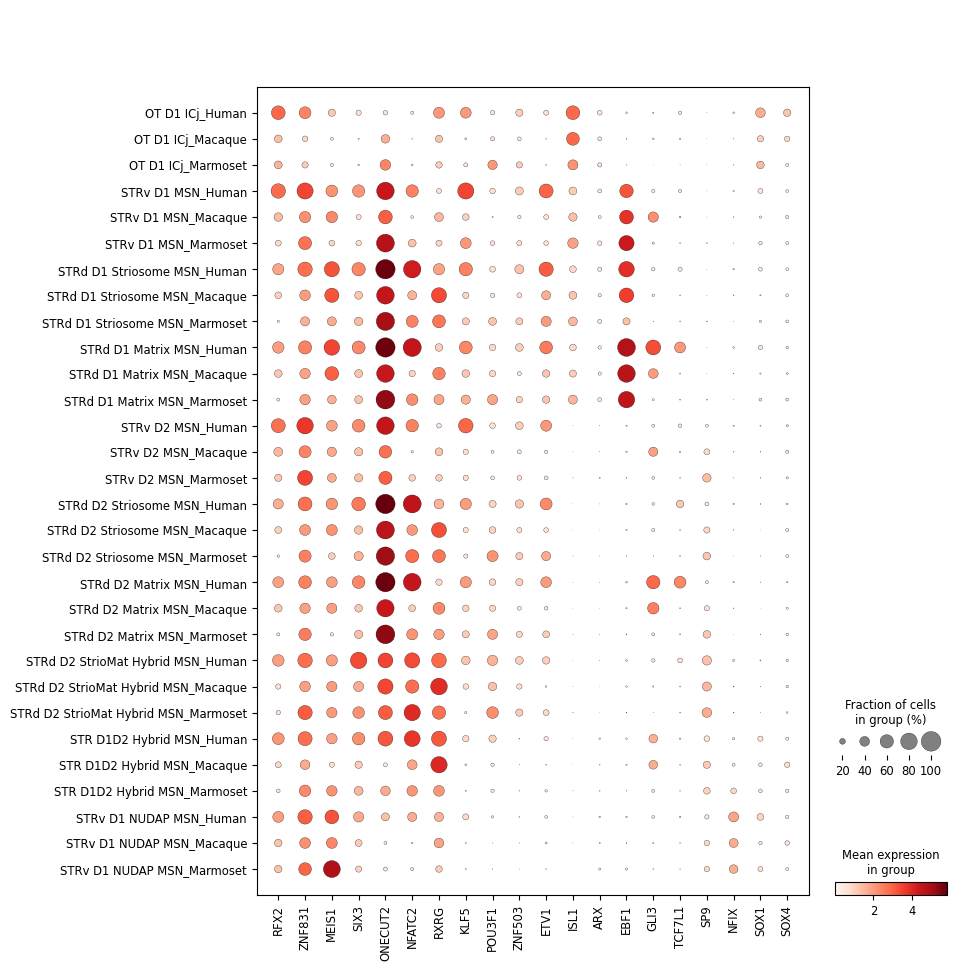

In [68]:
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_tf_curated, 
    groupby=["Group", "organism"], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

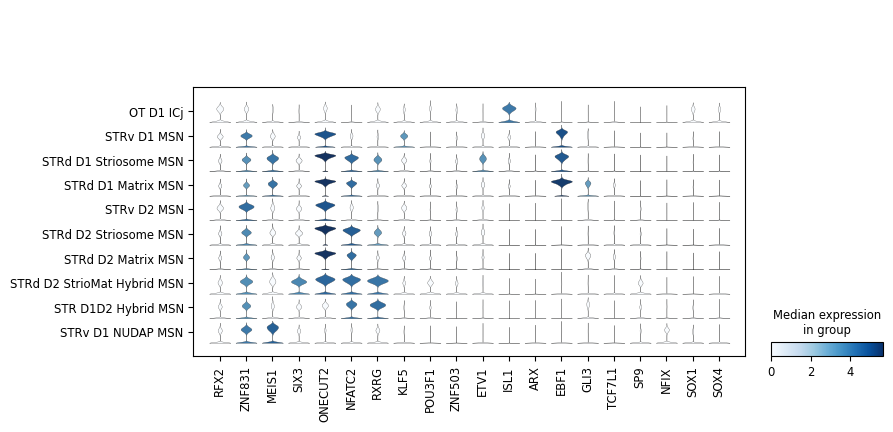

In [41]:
sc.pl.stacked_violin(
    adata_msn, 
    expr_tau_tf_curated, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
   # figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

##### filter genes by fraction & expression_level

In [45]:
from anndata import AnnData
from typing import Iterable, Tuple, List, Optional

def filter_genes_by_group_expression(
    adata: AnnData,
    genes: Iterable[str],
    group_key: str = "Group",
    layer: Optional[str] = None,
    frac_thresh: float = 0.2,
    mean_thresh: float = 1.0,
) -> Tuple[List[str], pd.DataFrame]:
    """
    Keep genes that satisfy, in at least one group:
      (fraction of cells with expr > 0) > frac_thresh  AND
      mean expression > mean_thresh.

    Speed/memory notes:
      - Work on sparse CSR and avoid densification.
      - Mean is computed as column-wise sum / n_cells, which is vectorized and fast.
    """
    # Select expression matrix (layer or X) and ensure CSR for efficient row slicing
    X = adata.layers[layer] if layer is not None else adata.X
    if not hasattr(X, "tocsr"):
        import scipy.sparse as sp
        X = sp.csr_matrix(X)
    else:
        X = X.tocsr()

    # Keep only genes present in adata.var_names
    genes = [g for g in genes if g in adata.var_names]
    if len(genes) == 0:
        return [], pd.DataFrame(columns=["gene", "group", "n_cells", "frac_expr_gt0",
                                         "mean", "pass_pair"])

    # Map genes to column indices
    gene_idx = adata.var_names.get_indexer(genes)

    # Ensure categorical grouping for consistent group order
    groups = adata.obs[group_key].astype("category")
    adata.obs[group_key] = groups
    group_cats = list(groups.cat.categories)

    records = []
    # Compute per-group metrics
    for g in group_cats:
        rows = (groups == g).values
        n = int(rows.sum())
        if n == 0:
            continue

        # Subset rows (cells of this group) and target gene columns
        sub = X[rows, :][:, gene_idx]  # (n_cells_in_group × n_genes)

        # Fraction expressing (>0), vectorized on sparse matrix
        frac_expr_gt0 = (sub > 0).sum(axis=0).A1 / n

        # Mean expression per gene over all cells: sum / n (no densification)
        mean_vals = sub.sum(axis=0).A1 / n

        # Pass rule for this (gene, group)
        pass_pair = (frac_expr_gt0 > frac_thresh) & (mean_vals > mean_thresh)

        # Collect tidy rows
        for j, gene in enumerate(genes):
            records.append({
                "gene": gene,
                "group": g,
                "n_cells": n,
                "frac_expr_gt0": frac_expr_gt0[j],
                "mean": mean_vals[j],
                "pass_pair": bool(pass_pair[j]),
            })

    details = pd.DataFrame.from_records(records)

    # Keep genes that pass in at least one group
    keep_mask = details.groupby("gene")["pass_pair"].any()
    kept_genes = keep_mask[keep_mask].index.tolist()

    # Optional: sort for inspection
    details = details.sort_values(["gene", "group"]).reset_index(drop=True)
    return kept_genes, details


In [51]:
gene_set = list(unique_genes)  
kept, per_group_metrics = filter_genes_by_group_expression(
    adata=adata_msn,
    genes=gene_set,
    group_key="Group",
    frac_thresh=0.15, # at least one Group that frac>0.15 & mean_th >1
    mean_thresh=1.0
)

print(f"Kept {len(kept)} / {len(gene_set)} genes")
per_group_metrics.query("pass_pair").head()


Kept 152 / 941 genes


,gene,group,n_cells,frac_expr_gt0,mean,pass_pair
22,ABCB1,STRd D1 Matrix MSN,221515,0.279945,1.134921,True
23,ABCB1,STRd D1 Striosome MSN,65028,0.336501,1.365729,True
25,ABCB1,STRd D2 StrioMat Hybrid MSN,13483,0.272269,1.051667,True
26,ABCB1,STRd D2 Striosome MSN,56647,0.283722,1.170870,True
27,ABCB1,STRv D1 MSN,81756,0.286205,1.171449,True


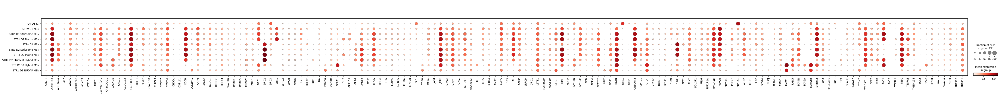

In [52]:
sc.pl.dotplot(
    adata_msn,
    var_names=kept, 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

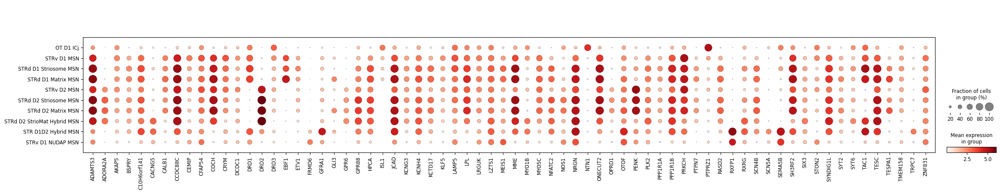

In [49]:
sc.pl.dotplot(
    adata_msn,
    var_names=kept, #median >1, frac>0.2 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

In [66]:
expr_tau_genes_curated= [
 'PTPRZ1', 'NTN1', 'NTN4', 'CHODL', 'COBLL1', 'TAC3', #ICJ
 'TMEM158', 'COCH', 'CALB1', 'ARMC3', 'CDHR1', 'DACT2', 'RGS14', 'ZNF503', #CLASSIC
 'DRD1','TAC1', 'PDYN', 'ISL1', 'EBF1',   #DRD1
 'DRD2', 'ADORA2A', 'GPR6', 'OPRD1', 'PENK', #DRD2
 'RXFP1', 'SEMA5B', 'FRMD6', 'ITGA6',  #HYBRID SUBCLASS
 'GFRA1', 'KIT', 'SCN5A', 'TRPC7', 'LAMA2', #D1D2 HYBRID GROUP
 'CACNG5', #2hyrbid groups
 'ATP10A', 'FHAD1', #D2StrioMat
 'DRD3', #not expressed in D2striomat 
 'TESPA1', 'PTPN7', 'GPR139', 'RCSD1', 'RASD2', 'SCN4B', #DORSAL MATRIX+STRIOSOME
 'MEGF10', 'RXRG','VAV1', #STRIO
 'GLI3', 'TCF7L1', # MATRIX
 'COL19A1', 'FGFR2', 'PKP2', #VENTRAL
 'LYPD1', 'NFIX', 'RHOJ', 'TOX3', #NUDAP
]
 

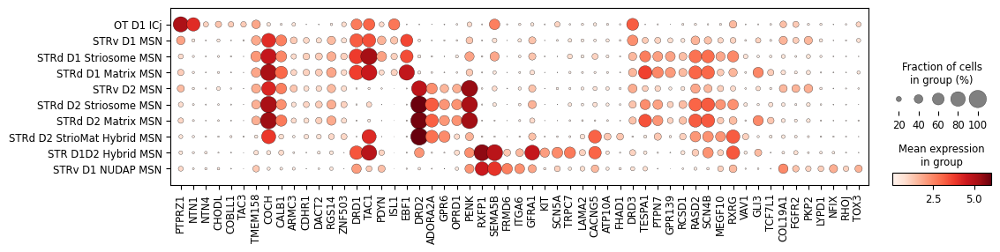

In [61]:
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_genes_curated, 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    figsize=(12, 2.6),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

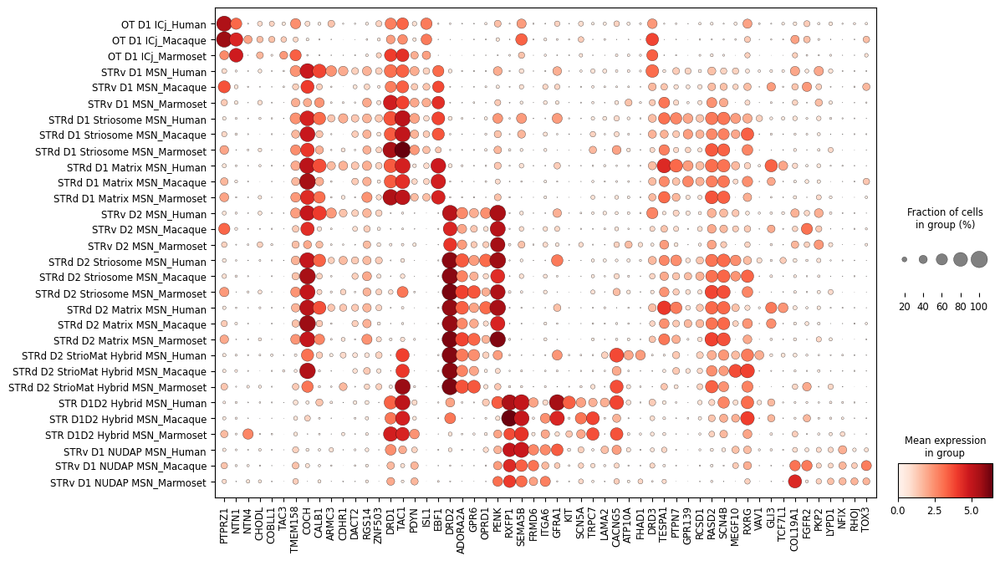

In [70]:
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_genes_curated, 
    groupby=["Group", 'organism'], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    figsize=(12, 7.6),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

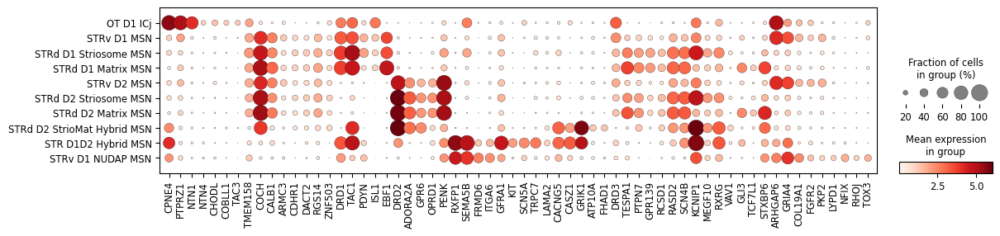

In [64]:
expr_tau_genes_curated_plus_known = [
 'CPNE4', 'PTPRZ1', 'NTN1', 'NTN4', 'CHODL', 'COBLL1', 'TAC3', #ICJ
 'TMEM158', 'COCH', 'CALB1', 'ARMC3', 'CDHR1', 'DACT2', 'RGS14', 'ZNF503', #CLASSIC
 'DRD1','TAC1', 'PDYN', 'ISL1', 'EBF1',   #DRD1
 'DRD2', 'ADORA2A', 'GPR6', 'OPRD1', 'PENK', #DRD2
 'RXFP1', 'SEMA5B', 'FRMD6', 'ITGA6',  #HYBRID SUBCLASS
 'GFRA1', 'KIT', 'SCN5A', 'TRPC7', 'LAMA2', #D1D2 HYBRID GROUP
 'CACNG5', 'CASZ1', 'GRIK1', #2hyrbid groups
 'ATP10A', 'FHAD1', #D2StrioMat
 'DRD3', #not expressed in D2striomat 
 'TESPA1', 'PTPN7', 'GPR139', 'RCSD1', 'RASD2', 'SCN4B', #DORSAL MATRIX+STRIOSOME
 'KCNIP1', 'MEGF10', 'RXRG','VAV1', #STRIO
 'GLI3', 'TCF7L1', 'STXBP6',# MATRIX
 'ARHGAP6', 'GRIA4', 'COL19A1', 'FGFR2', 'PKP2', #VENTRAL
 'LYPD1', 'NFIX', 'RHOJ', 'TOX3', #NUDAP
]
 
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_genes_curated_plus_known , 
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    figsize=(13, 2.6),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

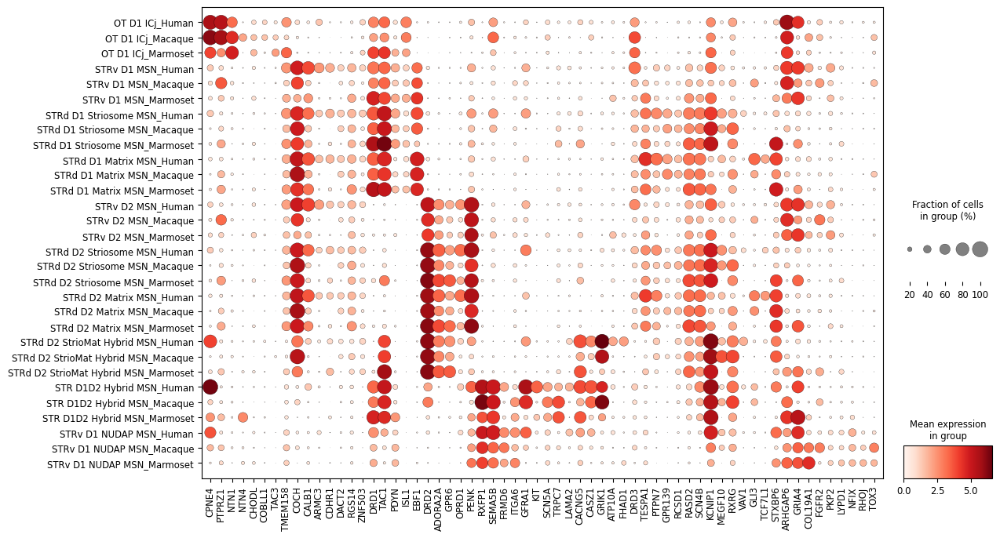

In [65]:
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_genes_curated_plus_known , 
    groupby=["Group", "organism"], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    figsize=(13, 7.8),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

### gene list from the primate MSNs expr/tau analysis

In [42]:
df = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/expressologs//MSN_vignette/group/group_expressologs_MSN_auroc_tau_metrics.csv")

#### 0.75 and 0.75

In [5]:
filtered_df = df[(df["xspecies_min"] > 0.75) & (df["auroc"] > 0.75)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

18
['CUX2', 'EBF1', 'ELAVL4', 'FRMD6', 'GRIK1', 'HTR7', 'KCNJ6', 'MOXD1', 'NFIB', 'NFIX', 'NTN1', 'RXFP1', 'SCN5A', 'SMYD2', 'TCF4', 'TRHDE', 'TRPC7', 'VWC2L']


In [7]:
expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

5
['EBF1', 'NFIB', 'NFIX', 'TCF4', 'CUX2']


In [15]:
unique_genes_ordered = ['CUX2', 'KCNJ6', 'NTN1', 'TCF4', 'EBF1', 'SMYD2', 'HTR7', 'ELAVL4', 'GRIK1', 'TRHDE', 'RXFP1','TRPC7', 'SCN5A',  'FRMD6', 'NFIB', 'NFIX', 'VWC2L']

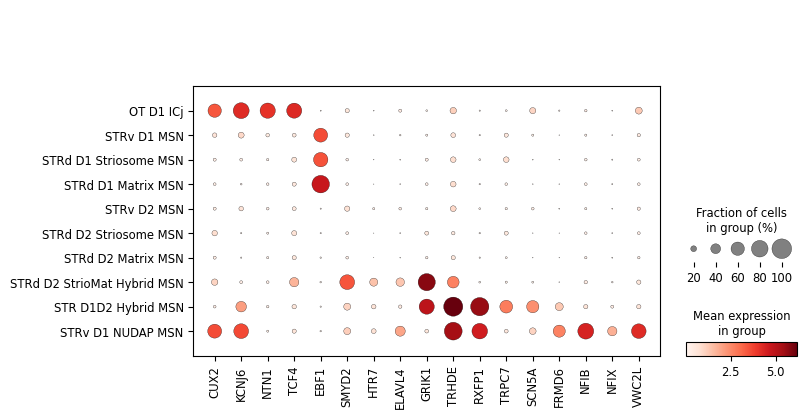

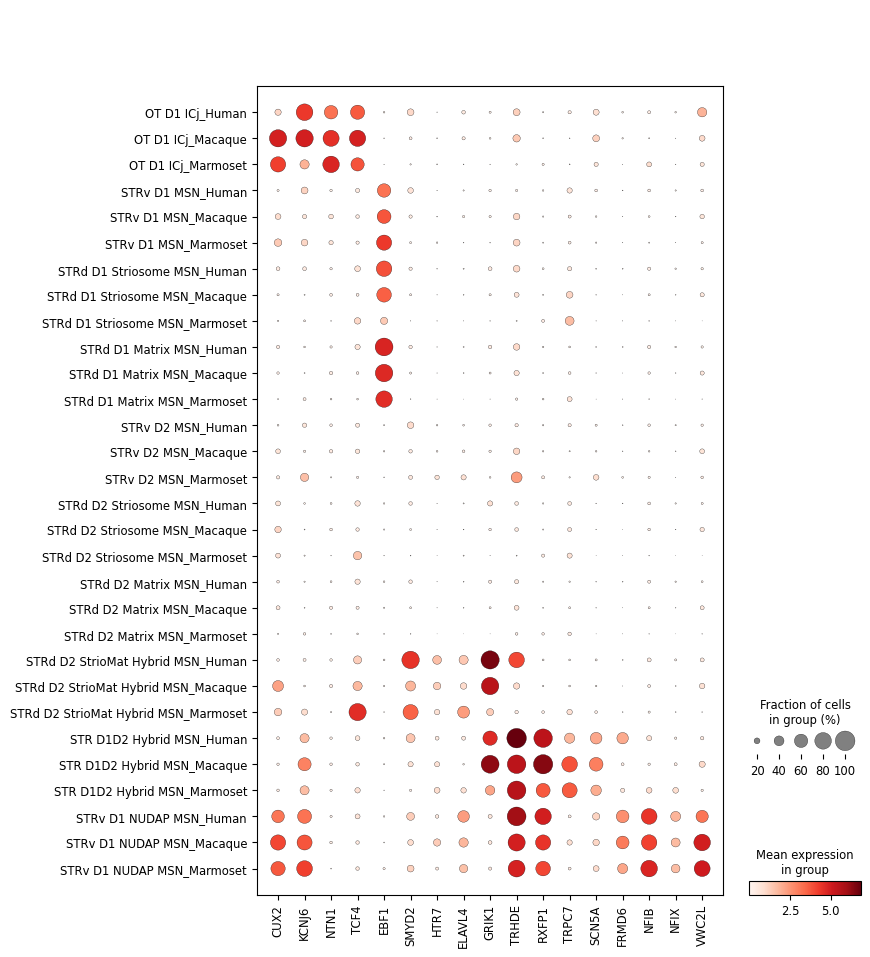

In [16]:
sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_ordered, #unique_genes
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)
sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_ordered, 
    groupby=["Group", "organism"], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)


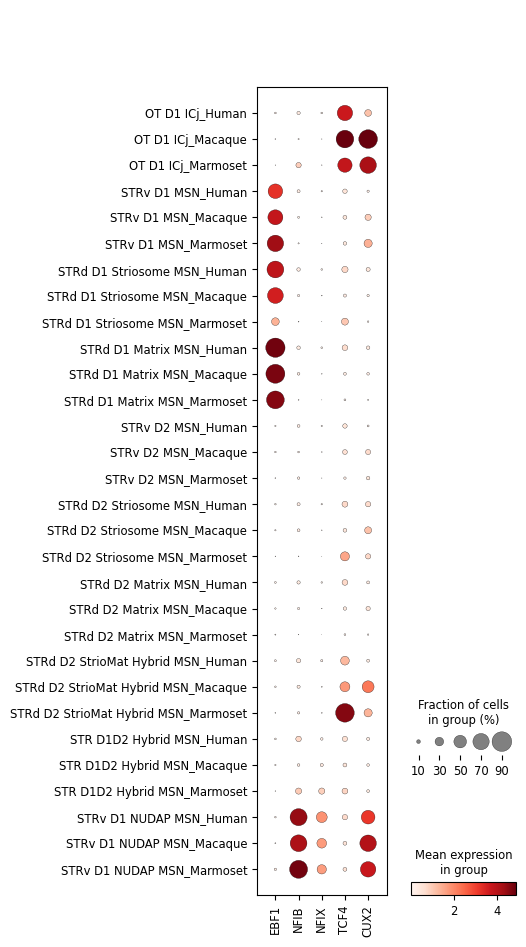

In [12]:
sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_tf, 
    groupby=["Group", "organism"], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

#### auroc 0.75, tau 0.6

In [60]:
filtered_df = df[(df["xspecies_min"] > 0.6) & (df["auroc"] > 0.75)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

85
['ADARB2', 'ADCY2', 'ADORA2A', 'ALK', 'AMOTL1', 'ANKFN1', 'ARHGAP18', 'ATP8B1', 'BTG1', 'CACNG5', 'CADPS2', 'CALCRL', 'CAMK2D', 'CCDC50', 'CHODL', 'CNTNAP4', 'CPNE4', 'CTBP2', 'CUX2', 'DRD2', 'EBF1', 'ELAVL2', 'ELAVL4', 'EPS8', 'EYA2', 'FRMD6', 'GABRA3', 'GABRG1', 'GFRA1', 'GNG2', 'GPR139', 'GPR6', 'GRIK1', 'GRIK3', 'HTR7', 'ILDR2', 'INSYN2B', 'ISL1', 'ITGA6', 'KCNH5', 'KCNJ3', 'KCNJ6', 'KIRREL1', 'LRFN2', 'LRIG1', 'MOXD1', 'NFIB', 'NFIX', 'NR4A3', 'NRP2', 'NTN1', 'OPRD1', 'PARP8', 'PDE1A', 'PLCB4', 'PPM1E', 'PTN', 'RASSF8', 'RXFP1', 'SCN5A', 'SEMA5B', 'SEZ6L', 'SHANK1', 'SHISA6', 'SIDT1', 'SMYD2', 'SNX7', 'SP9', 'STAC', 'TACR1', 'TAFA2', 'TCERG1L', 'TCF4', 'TIMP2', 'TMTC4', 'TNR', 'TRHDE', 'TRPC7', 'TSHZ1', 'UBE2QL1', 'VWC2L', 'WLS', 'ZBTB16', 'ZNF608', 'ZNF804B']


In [61]:
expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

12
['EBF1', 'NR4A3', 'ZBTB16', 'ZNF608', 'SP9', 'CUX2', 'TSHZ1', 'TCF4', 'ISL1', 'NFIX', 'NFIB', 'ZNF804B']


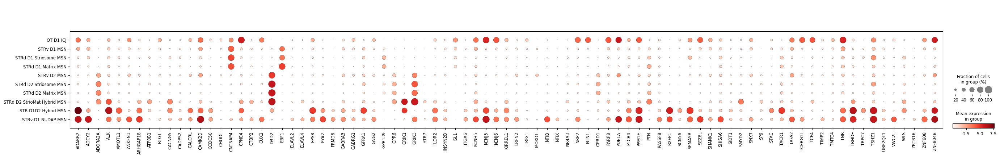

In [19]:
sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes, #unique_genes
    groupby="Group", 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
    #figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)


In [62]:
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import pdist, squareform
from anndata import AnnData

def order_genes_by_pattern(
    adata: AnnData,
    genes: list[str],
    group_key: str = "Group",
    layer: str | None = None,
    use_metric: str = "correlation",   # 'correlation' or 'euclidean'
    use_feature: str = "mean",         # 'mean' or 'fraction' or 'both'
) -> list[str]:
    """
    Returns genes reordered so that similar patterns across groups are adjacent.
    Row (group) order is kept as in adata.obs[group_key] categorical order.
    """
    # fix row order
    groups = adata.obs[group_key].astype("category")
    adata.obs[group_key] = groups
    group_order = list(groups.cat.categories)

    # choose matrix
    X = adata.layers[layer] if layer is not None else adata.X
    X = X.tocsr() if hasattr(X, "tocsr") else X

    # keep existing genes
    genes = [g for g in genes if g in adata.var_names]
    idx = adata.var_names.get_indexer(genes)

    # build group-by matrix (rows=groups, cols=genes)
    rows = []
    for g in group_order:
        mask = (adata.obs[group_key] == g).values
        sub = X[mask, :][:, idx]
        n = sub.shape[0]
        mean_vec = sub.sum(axis=0).A1 / max(n, 1)
        frac_vec = (sub > 0).sum(axis=0).A1 / max(n, 1)
        if use_feature == "mean":
            feat = mean_vec
        elif use_feature == "fraction":
            feat = frac_vec
        else:  # both: concatenate then z-score each block to balance scale
            a = (mean_vec - mean_vec.mean()) / (mean_vec.std() + 1e-9)
            b = (frac_vec - frac_vec.mean()) / (frac_vec.std() + 1e-9)
            feat = np.r_[a, b]
        rows.append(feat)

    M = np.vstack(rows)                # shape: (n_groups, n_genes) or (n_groups, 2*n_genes) for 'both'
    if use_feature == "both":
        # reshape back to gene × features
        nG = len(group_order)
        nV = len(genes)
        M = np.concatenate([M[:nG, :nV], M[:nG, nV:]], axis=0)  # not needed; correlation below works on cols

    # columns = genes; cluster columns by distance of their group-wise profiles
    D = pdist(M.T, metric=use_metric)  # distance between gene columns
    Z = linkage(D, method="average")   # or 'ward' if euclidean
    order = leaves_list(Z)
    return [genes[i] for i in order]


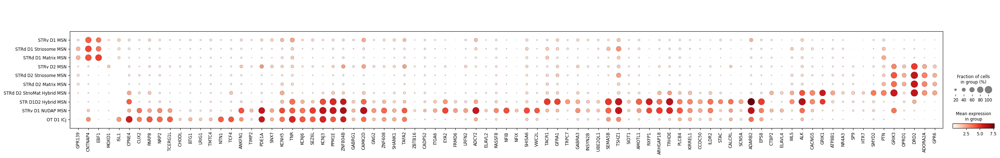

In [63]:
new_gene_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=unique_genes,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="mean"         # 'mean'; 'fraction'; 'both'
)


sc.pl.dotplot(
    adata_msn,
    var_names=new_gene_order,
    groupby="Group",
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)


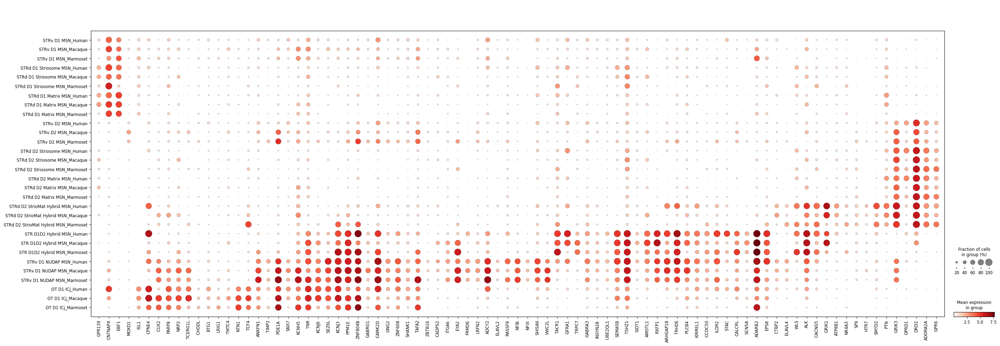

In [64]:
sc.pl.dotplot(
    adata_msn,
    var_names=new_gene_order,
    groupby=["Group", 'organism'],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)


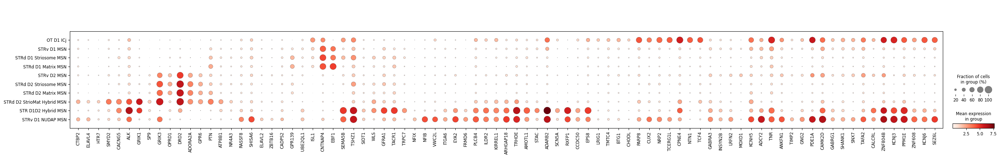

In [24]:
new_gene_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=unique_genes,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="both"         # 'mean'; 'fraction'; 'both'
)


sc.pl.dotplot(
    adata_msn,
    var_names=new_gene_order,
    groupby="Group",
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)


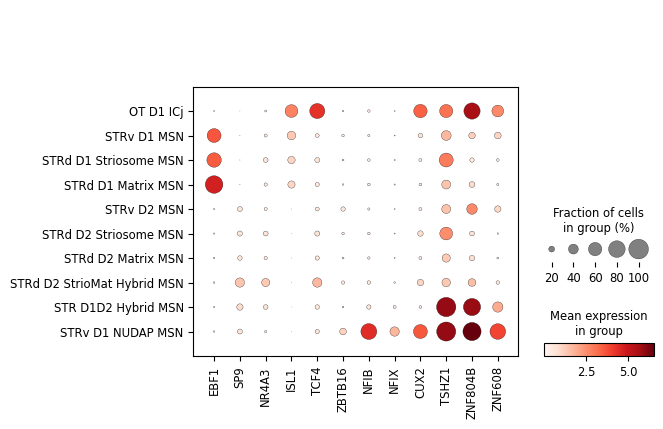

In [23]:
expr_tau_tf_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=expr_tau_tf,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="mean"         
)


sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_tf_order,
    groupby="Group",
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)


#### human tau (type specific) high >0.75, and macaque/marmoset both <0.5 [only cell-type specific in human => potential human-specific markers?!)

In [25]:
filtered_df = df[(df["human"] > 0.75) & (df["macaque"] < 0.5) & (df["marmoset"] < 0.5)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

63
['ADAMTS5', 'AFAP1L2', 'AHRR', 'BLM', 'CA2', 'CAV1', 'CAV2', 'CBLN4', 'CCK', 'CDK15', 'CHRM2', 'COL27A1', 'CREG2', 'CRHR2', 'CXCL13', 'DAPL1', 'DNAH8', 'ENPEP', 'FGF2', 'FGFR1', 'FIGN', 'FREM2', 'GABRQ', 'GLRA1', 'GPR26', 'HMCN1', 'HS3ST1', 'ITGA1', 'KCTD4', 'KYNU', 'LECT2', 'LMNTD1', 'LURAP1L', 'MARCKSL1', 'MFGE8', 'MYO10', 'MYO1H', 'NKAIN1', 'NPFFR1', 'NXPH2', 'OTOGL', 'PDGFRA', 'PDLIM3', 'PHLDB2', 'PKDCC', 'PTGER3', 'RAB37', 'SAMD3', 'SHC2', 'SLC22A6', 'SLC5A8', 'SPINK5', 'SPTLC3', 'ST8SIA6', 'SYNPO2', 'TGFBR3', 'TLE2', 'TMC1', 'TMEM132C', 'TRPM4', 'VIP', 'VSTM5', 'ZNF385C']


In [26]:
expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

2
['AHRR', 'ZNF385C']


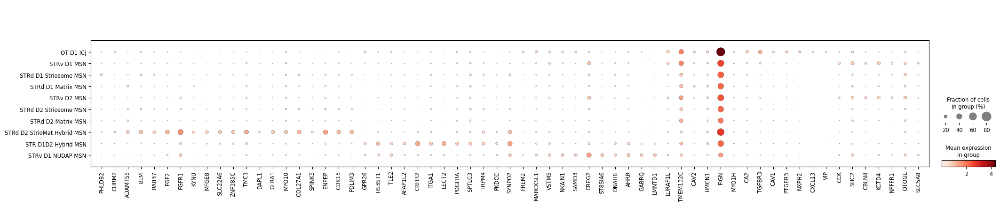

In [27]:
unique_genes_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=unique_genes,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="mean"         
)


sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_order,
    groupby="Group",
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)



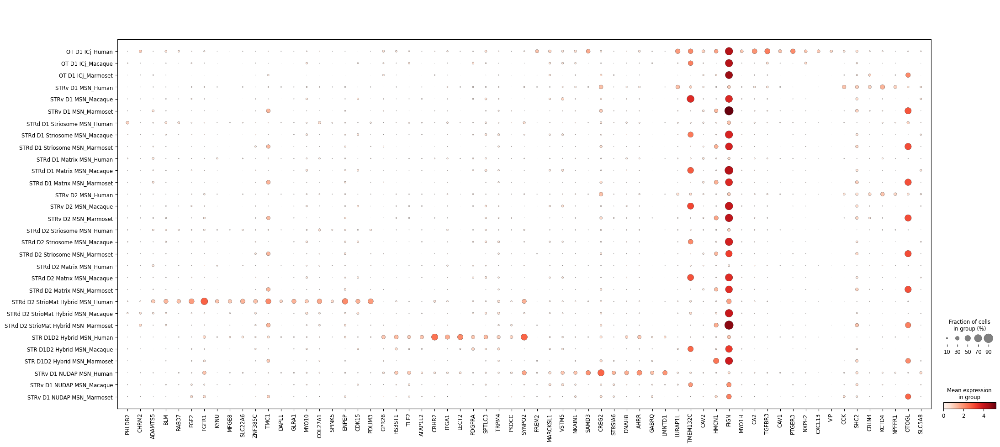

In [28]:
sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_order,
    groupby=["Group", "organism"],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)

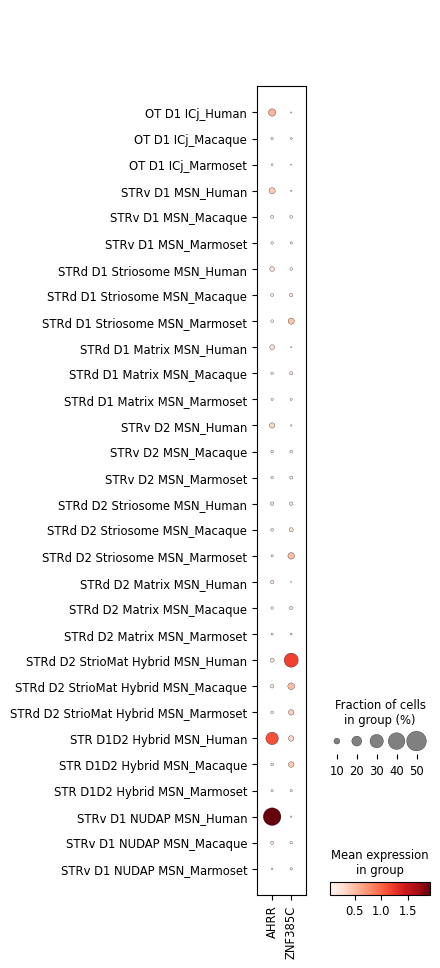

In [29]:
sc.pl.dotplot(
    adata_msn,
    var_names=['AHRR', 'ZNF385C'],
    groupby=["Group", "organism"],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)

#### in contrast of - human tau (type specific) high >0.75, and macaque/marmoset both <0.5 [only cell-type specific in human => potential human-specific markers?!)

In [31]:
filtered_df = df[(df["human"] < 0.5) & (df["macaque"] > 0.75) & (df["marmoset"] > 0.75)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

14
['ADCY8', 'ANKRD55', 'CHST9', 'FARP1', 'HTR2C', 'HUNK', 'IL20RA', 'NTN4', 'PEX5L', 'QRFPR', 'RHOJ', 'SCN7A', 'TAC3', 'TOX3']
0
[]


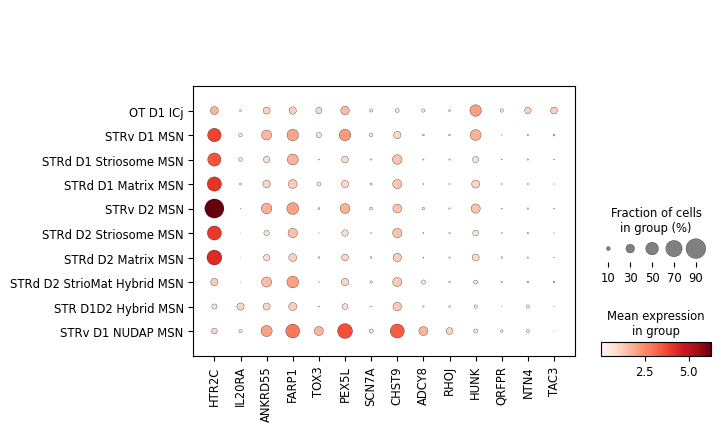

In [32]:
unique_genes_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=unique_genes,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="mean"         
)


sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_order,
    groupby="Group",
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)



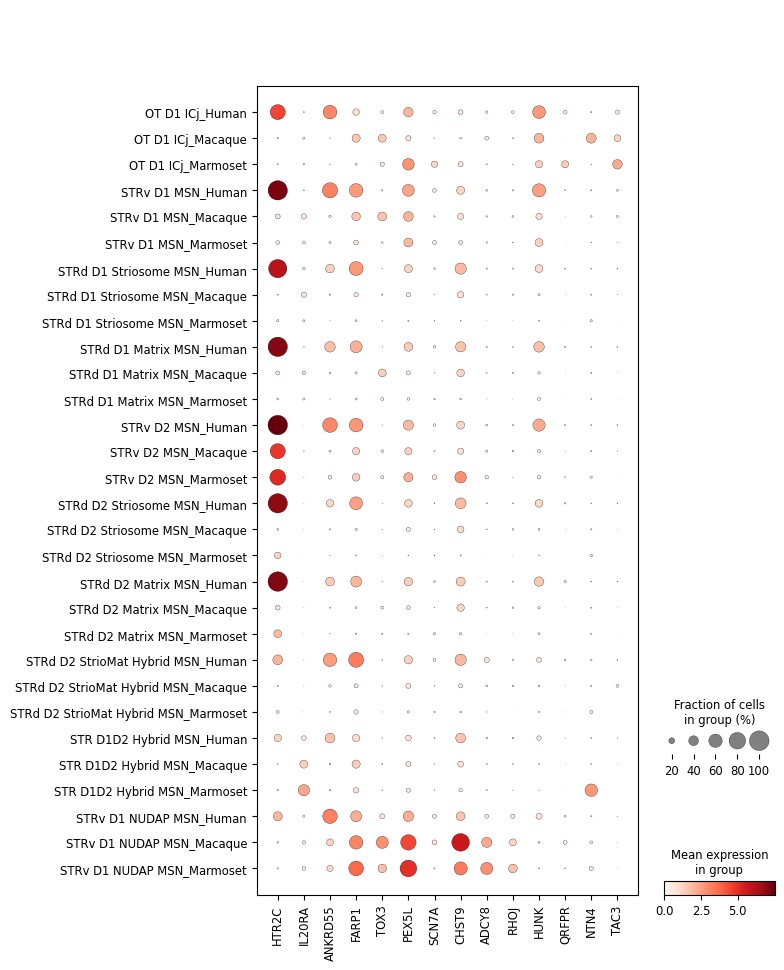

In [34]:
sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_order,
    groupby=["Group", "organism"],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)

#### macaque tau (type specific) high >0.75, and human/marmoset both <0.5 [only cell-type specific in macaque => potential macaque-specific markers?!)

In [53]:
df = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/analysis/expressologs//MSN_vignette/group/group_expressologs_MSN_auroc_tau_metrics.csv")

In [54]:
filtered_df = df[(df["macaque"] > 0.75) & (df["human"] < 0.5) & (df["marmoset"] < 0.5)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

57
['ANKK1', 'ANXA3', 'B3GAT2', 'BCAS1', 'BMP6', 'CACHD1', 'CCDC141', 'CD96', 'CDH20', 'CFAP58', 'CORO2A', 'DACH2', 'DHRS3', 'DNAH5', 'DOCK1', 'EDN1', 'ELOVL2', 'EPSTI1', 'EPYC', 'EYA4', 'FAT4', 'FBN2', 'FGF10', 'FREM3', 'GADL1', 'GNG8', 'GPSM2', 'GYG2', 'HTR1F', 'IGFBP7', 'INSYN2A', 'ISOC1', 'ITGA9', 'KCNJ16', 'KERA', 'LATS2', 'NPTX2', 'NPY2R', 'NRIP3', 'PDE3B', 'PKHD1', 'PLCE1', 'PLEKHH2', 'PTPN3', 'PTPRU', 'RGMB', 'RHOXF1', 'RIN3', 'SH3BP4', 'SLC26A5', 'SLCO6A1', 'SMIM32', 'SOX13', 'SPOCK1', 'STARD5', 'TMEM144', 'VANGL2']
3
['DACH2', 'SOX13', 'RHOXF1']


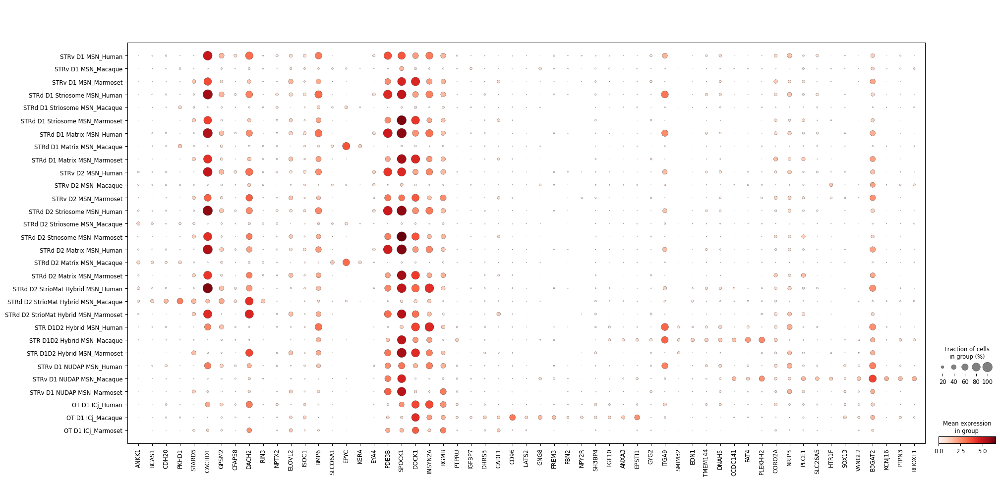

In [55]:
unique_genes_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=unique_genes,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="fraction"    #both, mean     
)

sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_order,
    groupby=["Group", "organism"],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)

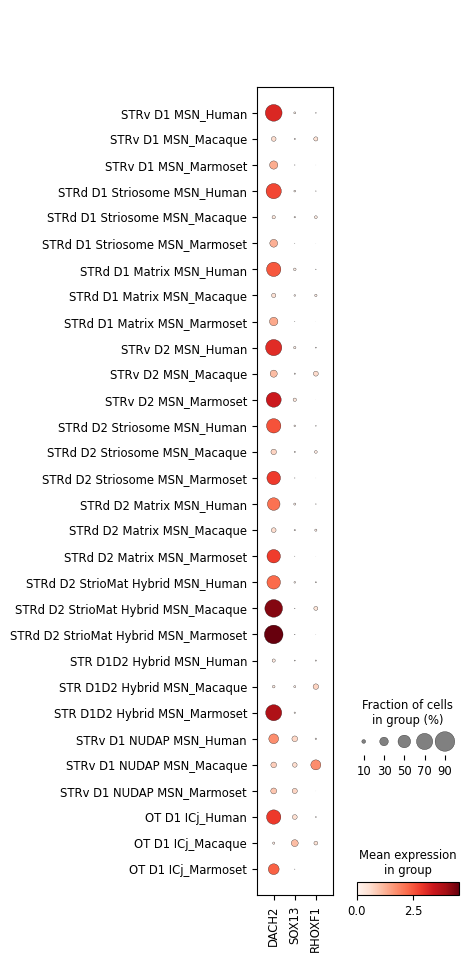

In [48]:
expr_tau_tf_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=expr_tau_tf,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="mean"         
)

sc.pl.dotplot(
    adata_msn,
    var_names=expr_tau_tf_order,
    groupby=["Group", "organism"],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)

#### marmoset tau (type specific) high >0.75, and human/macaque both <0.5 [only cell-type specific in marmoset => potential marmoset-specific markers?!)

In [50]:
filtered_df = df[(df["marmoset"] > 0.75) & (df["human"] < 0.5) & (df["macaque"] < 0.5)]
unique_genes = filtered_df["gene"].unique().tolist()

print(len(unique_genes))
print(unique_genes)

expr_tau_tf = list(set(unique_genes) & set(tf_genes))
print(len(expr_tau_tf))
print(expr_tau_tf)

51
['ABTB2', 'ADAMTS20', 'ADGRV1', 'ANGPT1', 'ANTXR2', 'ANXA4', 'ARHGAP24', 'ARSJ', 'ATF7IP2', 'BCL2L11', 'C13H18orf63', 'CDC14A', 'CFTR', 'CHN2', 'CMTM8', 'CRACR2A', 'DEPTOR', 'DNAH11', 'DYDC1', 'FSHR', 'GPC3', 'GPC5', 'HCRTR2', 'HTRA1', 'ID4', 'IGFBP2', 'IGFBP3', 'IGFBPL1', 'LGR6', 'LRP4', 'MAPKAPK2', 'MDFIC', 'MERTK', 'NWD2', 'PCBP3', 'PLS3', 'PRKCD', 'PRKX', 'RAB38', 'RASGEF1C', 'RGCC', 'SCGN', 'SLC9A9', 'STARD13', 'TDRD15', 'TMEM114', 'TNC', 'TP53BP2', 'TTC6', 'WHRN', 'WNT7A']
0
[]


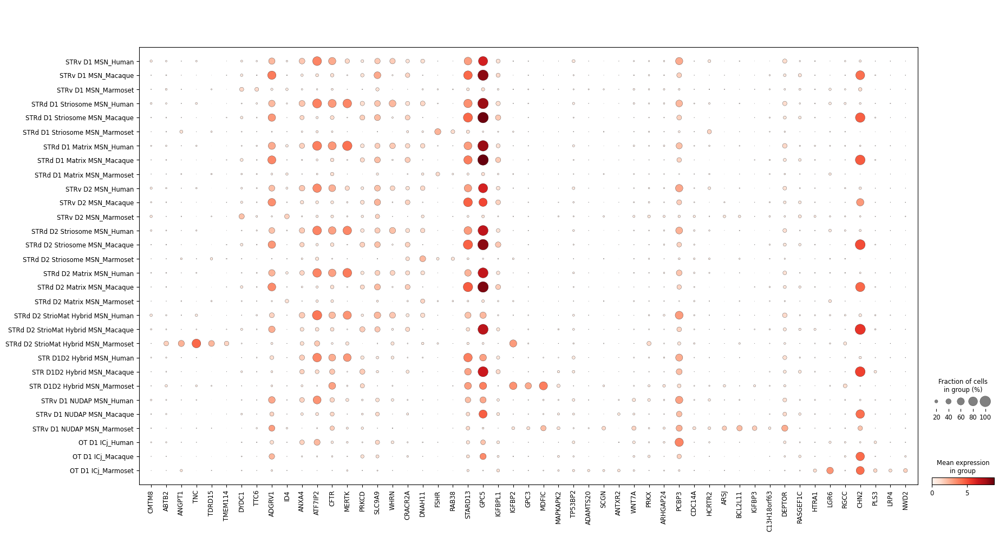

In [51]:
unique_genes_order = order_genes_by_pattern(
    adata=adata_msn,
    genes=unique_genes,
    group_key="Group",
    layer=None,                
    use_metric="correlation",  
    use_feature="mean"         
)

sc.pl.dotplot(
    adata_msn,
    var_names=unique_genes_order,
    groupby=["Group", "organism"],
    use_raw=False,
    dendrogram=False,   
    swap_axes=False,
    standard_scale=None
)

### gene list from the 4-species MSNs expr/tau analysis

### abundance

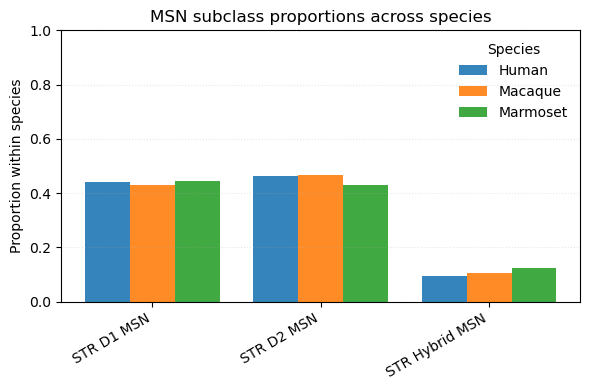

In [18]:
import matplotlib.pyplot as plt

selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN"]
obs = adata_msn.obs[adata_msn.obs["Subclass"].isin(selected)].copy()

counts_wide = pd.crosstab(obs["Subclass"], obs["organism"])

wide = counts_wide.div(counts_wide.sum(axis=0), axis=1)

subclass_order = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN"]
species_order  = [sp for sp in ["Human", "Macaque", "Marmoset"] if sp in wide.columns]
wide = wide.reindex(index=subclass_order, columns=species_order).fillna(0.0)


fig, ax = plt.subplots(figsize=(6, 4))
x = np.arange(len(wide.index))
nsp = len(wide.columns)
bar_w = 0.8 / max(nsp, 1)

for i, sp in enumerate(wide.columns):
    ax.bar(x + (i - (nsp-1)/2)*bar_w, wide[sp].values,
           width=bar_w, label=sp, alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(wide.index, rotation=30, ha="right")
ax.set_ylabel("Proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN subclass proportions across species")
ax.legend(title="Species", frameon=False)
ax.grid(axis="y", linestyle=":", alpha=0.3)
plt.tight_layout()
plt.show()


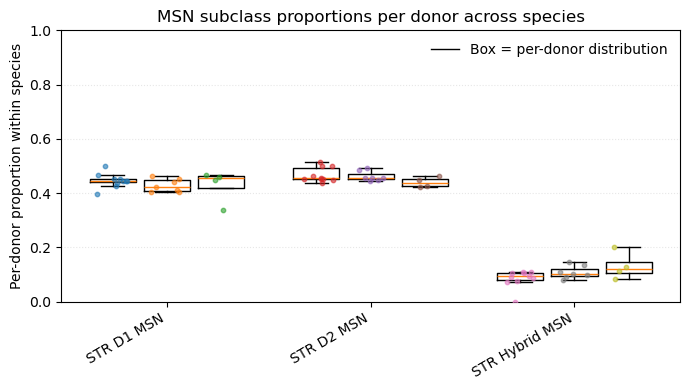

In [24]:
# --- subset to the three MSN subclasses ---
selected = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN"]
obs = adata_msn.obs[adata_msn.obs["Subclass"].isin(selected)].copy()

# --- per-donor totals (MSN cells) within species ---
totals = (obs.groupby(["organism","donor_id"])
            .size()
            .rename("total_msn_per_donor"))

# --- per-donor subclass counts ---
counts = (obs.groupby(["organism","donor_id","Subclass"])
            .size()
            .rename("n_cells"))

# merge and compute per-donor proportion of each subclass
df = (counts.reset_index()
            .merge(totals.reset_index(), on=["organism","donor_id"], how="left"))
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]

# desired orders
subclass_order = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN"]
species_order  = [sp for sp in ["Human","Macaque","Marmoset"] if sp in df["organism"].unique()]

# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
labels_pos  = []
x = np.arange(len(subclass_order))      # 3 groups
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp,1)

positions = []
for i, sc in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[(df["Subclass"]==sc) & (df["organism"]==sp), "proportion"].dropna().values
        data_lists.append(vals)
        # x-position for this box
        pos = x[i] + (j - (nsp-1)/2)*dx
        positions.append(pos)

# --- plot ---
fig, ax = plt.subplots(figsize=(7, 4))

# boxplot 
bp = ax.boxplot(
    data_lists,
    positions=positions,
    widths=dx*0.85,
    manage_ticks=False,
    showfliers=False
)


rng = np.random.default_rng(0)
for vals, pos in zip(data_lists, positions):
    if len(vals):
        jitter = (rng.random(len(vals)) - 0.5) * dx*0.6
        ax.scatter(np.full_like(vals, pos)+jitter, vals, s=10, alpha=0.6, zorder=3)


ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")

ax.set_ylabel("Per-donor proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN subclass proportions per donor across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)


from matplotlib.lines import Line2D
legend_handles = [Line2D([0],[0], color="black", lw=1)]
legend_labels  = ["Box = per-donor distribution"]
ax.legend(legend_handles, legend_labels, frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


In [21]:
set(adata_msn.obs['Group'])

{'STR D1D2 Hybrid MSN',
 'STRd D1 Matrix MSN',
 'STRd D1 Striosome MSN',
 'STRd D2 Matrix MSN',
 'STRd D2 StrioMat Hybrid MSN',
 'STRd D2 Striosome MSN',
 'STRv D1 MSN',
 'STRv D1 NUDAP MSN',
 'STRv D2 MSN'}

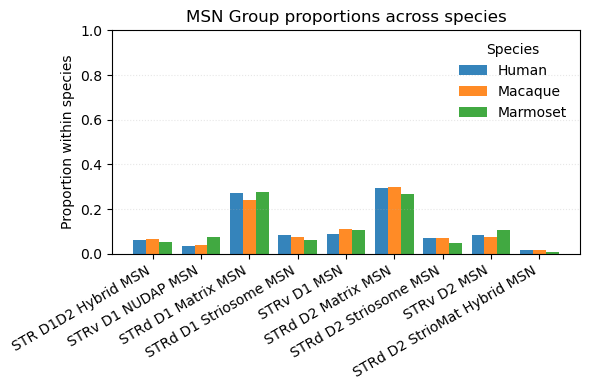

In [22]:
selected = ["STR D1D2 Hybrid MSN", "STRv D1 NUDAP MSN",'STRd D1 Matrix MSN','STRd D1 Striosome MSN','STRv D1 MSN', 'STRd D2 Matrix MSN','STRd D2 Striosome MSN','STRv D2 MSN','STRd D2 StrioMat Hybrid MSN',]
obs = adata_msn.obs[adata_msn.obs["Group"].isin(selected)].copy()

counts_wide = pd.crosstab(obs["Group"], obs["organism"])

wide = counts_wide.div(counts_wide.sum(axis=0), axis=1)

subclass_order = ["STR D1D2 Hybrid MSN", "STRv D1 NUDAP MSN",'STRd D1 Matrix MSN','STRd D1 Striosome MSN','STRv D1 MSN', 'STRd D2 Matrix MSN','STRd D2 Striosome MSN','STRv D2 MSN','STRd D2 StrioMat Hybrid MSN',]
species_order  = [sp for sp in ["Human", "Macaque", "Marmoset"] if sp in wide.columns]
wide = wide.reindex(index=subclass_order, columns=species_order).fillna(0.0)


fig, ax = plt.subplots(figsize=(6, 4))
x = np.arange(len(wide.index))
nsp = len(wide.columns)
bar_w = 0.8 / max(nsp, 1)

for i, sp in enumerate(wide.columns):
    ax.bar(x + (i - (nsp-1)/2)*bar_w, wide[sp].values,
           width=bar_w, label=sp, alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(wide.index, rotation=30, ha="right")
ax.set_ylabel("Proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN Group proportions across species")
ax.legend(title="Species", frameon=False)
ax.grid(axis="y", linestyle=":", alpha=0.3)
plt.tight_layout()
plt.show()

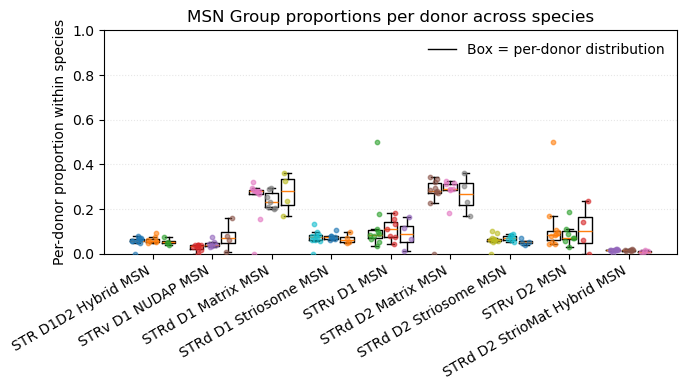

In [23]:
# --- per-donor totals (MSN cells) within species ---
totals = (obs.groupby(["organism","donor_id"])
            .size()
            .rename("total_msn_per_donor"))

# --- per-donor subclass counts ---
counts = (obs.groupby(["organism","donor_id","Group"])
            .size()
            .rename("n_cells"))

# merge and compute per-donor proportion of each subclass
df = (counts.reset_index()
            .merge(totals.reset_index(), on=["organism","donor_id"], how="left"))
df["proportion"] = df["n_cells"] / df["total_msn_per_donor"]


# --- collect data lists for boxplot (one list per Subclass×Species) ---
data_lists = []
labels_pos  = []
x = np.arange(len(subclass_order))      # 3 groups
nsp = len(species_order)
group_w = 0.8
dx = group_w / max(nsp,1)

positions = []
for i, sc in enumerate(subclass_order):
    for j, sp in enumerate(species_order):
        vals = df.loc[(df["Group"]==sc) & (df["organism"]==sp), "proportion"].dropna().values
        data_lists.append(vals)
        # x-position for this box
        pos = x[i] + (j - (nsp-1)/2)*dx
        positions.append(pos)

# --- plot ---
fig, ax = plt.subplots(figsize=(7, 4))

# boxplot (showfliers可开/关；whis=IQR*1.5)
bp = ax.boxplot(
    data_lists,
    positions=positions,
    widths=dx*0.85,
    manage_ticks=False,
    showfliers=False
)


rng = np.random.default_rng(0)
for vals, pos in zip(data_lists, positions):
    if len(vals):
        jitter = (rng.random(len(vals)) - 0.5) * dx*0.6
        ax.scatter(np.full_like(vals, pos)+jitter, vals, s=10, alpha=0.6, zorder=3)


ax.set_xticks(x)
ax.set_xticklabels(subclass_order, rotation=30, ha="right")

ax.set_ylabel("Per-donor proportion within species")
ax.set_ylim(0, 1)
ax.set_title("MSN Group proportions per donor across species")
ax.grid(axis="y", linestyle=":", alpha=0.3)


from matplotlib.lines import Line2D
legend_handles = [Line2D([0],[0], color="black", lw=1)]
legend_labels  = ["Box = per-donor distribution"]
ax.legend(legend_handles, legend_labels, frameon=False, loc="upper right")

plt.tight_layout()
plt.show()

In [16]:
from typing import Optional, List
from anndata import AnnData
import numpy as np
import pandas as pd

def downsample_per_cluster_donor(
    adata: AnnData,
    cluster_key: str = "Cluster",
    donor_key: str = "donor_id",
    max_cells_per_group: int = 50,
    clusters_to_include: Optional[List[str]] = None,
    require_shared_donors: bool = True,
    random_state: Optional[int] = None
) -> AnnData:
    """
    Downsample per (cluster × donor) to a maximum number of cells,
    with optional filtering to retain only donors shared across multiple clusters.
    Supports fixed random seed for reproducibility.

    Parameters
    ----------
    adata : AnnData
        Input AnnData object.
    cluster_key : str
        Column in .obs specifying clusters.
    donor_key : str
        Column in .obs specifying donor IDs.
    max_cells_per_group : int
        Maximum number of cells per (cluster × donor) group.
    clusters_to_include : list of str, optional
        Only retain these clusters if provided.
    require_shared_donors : bool
        If True, only keep donors that appear in ≥2 of the specified clusters.
    random_state : int, optional
        Seed for reproducible downsampling. If None, randomness is not fixed.

    Returns
    -------
    AnnData
        Downsampled AnnData object.
    """
    obs = adata.obs
    if clusters_to_include is not None:
        obs = obs[obs[cluster_key].isin(clusters_to_include)]

    # Identify donors present in ≥2 different clusters
    if require_shared_donors:
        donor_cluster_counts = obs.groupby(donor_key)[cluster_key].nunique()
        shared_donors = donor_cluster_counts[donor_cluster_counts >= 2].index.tolist()
        obs = obs[obs[donor_key].isin(shared_donors)]

    rng = np.random.default_rng(random_state)  # reproducible generator
    selected_indices = []

    for clus in obs[cluster_key].unique():
        clus_df = obs[obs[cluster_key] == clus]
        for donor in clus_df[donor_key].unique():
            donor_cells = clus_df[clus_df[donor_key] == donor].index.tolist()
            if len(donor_cells) <= max_cells_per_group:
                selected_indices.extend(donor_cells)
            else:
                sampled = rng.choice(donor_cells, size=max_cells_per_group, replace=False)
                selected_indices.extend(sampled)

    return adata[selected_indices].copy()


## DEGs between classic D1/D2 islands and Hybrid island per species 

In [3]:
adata_msn = sc.read_h5ad("Consensus_preprint_3species_MSNs_withlogCPM_X.h5ad")

KeyboardInterrupt: 

In [4]:
mapping = {
    "STR Hybrid MSN": "Hybrid",
    "STR D1 MSN": "Classic",
    "STR D2 MSN": "Classic",
}

adata_msn.obs["hybrid_vs_classic"] = adata_msn.obs["Subclass"].map(mapping)
#ordered
adata_msn.obs["hybrid_vs_classic"] = pd.Categorical(
    adata_msn.obs["hybrid_vs_classic"],
    categories=["Hybrid", "Classic"],  
    ordered=False,
)

adata_msn.obs["hybrid_vs_classic"].value_counts(dropna=False)


hybrid_vs_classic
Classic    754554
Hybrid      86451
Name: count, dtype: int64

In [5]:
adata_msn_human = adata_msn[adata_msn.obs["organism"].isin(['Human'])].copy()
adata_msn_macaque = adata_msn[adata_msn.obs["organism"].isin(['Macaque'])].copy()
adata_msn_marmoset = adata_msn[adata_msn.obs["organism"].isin(['Marmoset'])].copy()

In [6]:
from scipy.stats import spearmanr
from typing import Dict, Optional, List, Tuple
from anndata import AnnData
import scipy.sparse as sp
import matplotlib.pyplot as plt


def _to_dense(X):
    """Safely convert a (possibly sparse) matrix to dense numpy array."""
    if sp.issparse(X):
        return X.toarray()
    return np.asarray(X)


def compute_group_medians_by_species(
    adata: AnnData,
    species_key: str = "organism",
    group_key: str = "Group",
    use_raw: bool = False,
    genes_filter: Optional[List[str]] = None,
    min_cells_per_group: int = 1
) -> Dict[str, pd.DataFrame]:
    """
    Compute per-species, per-group median expression across genes.

    Returns a dict mapping species -> DataFrame of shape (n_groups, n_genes),
    where each row is a group's median gene expression vector within that species.

    Parameters
    ----------
    adata : AnnData
        Integrated AnnData containing multiple species.
    species_key : str
        Column in .obs that specifies species (e.g., 'organism').
    group_key : str
        Column in .obs that specifies groups/clusters within each species (e.g., 'Group').
    use_raw : bool
        If True, use adata.raw.X and adata.raw.var_names.
    genes_filter : list of str or None
        Optional list of gene names to subset columns (must be present in var_names).
    min_cells_per_group : int
        Minimum number of cells required to compute a median for the group. Groups
        with fewer cells are dropped.

    Returns
    -------
    medians_by_species : Dict[str, pd.DataFrame]
        Keys are species values; values are DataFrames indexed by group IDs with columns = genes.
    """
    # Select expression matrix and gene names
    expr = adata.raw.X if use_raw else adata.X
    var_names = np.array(adata.raw.var_names if use_raw else adata.var_names, dtype=str)

    # Optional gene filtering with order preserved
    if genes_filter is not None:
        genes_filter = [g for g in genes_filter if g in set(var_names)]
        if len(genes_filter) == 0:
            raise ValueError("None of the genes in genes_filter are present in var_names.")
        gene_mask = np.isin(var_names, genes_filter)
        var_names = var_names[gene_mask]
        expr = expr[:, gene_mask]

    # Ensure consistent dtypes for keys
    species_series = adata.obs[species_key].astype(str)
    group_series = adata.obs[group_key].astype(str)

    medians_by_species: Dict[str, pd.DataFrame] = {}

    # Iterate over species
    for spc in sorted(species_series.unique()):
        spc_mask = (species_series == spc).values
        if spc_mask.sum() == 0:
            continue

        # Slice AnnData-like arrays efficiently
        X_spc = expr[spc_mask, :]
        groups_spc = group_series[spc_mask].values

        # Compute median per group
        group_ids = sorted(pd.unique(groups_spc))
        rows = []
        row_names = []

        X_spc_dense = None  # lazily materialize dense per group to save memory when possible

        for gid in group_ids:
            gmask = (groups_spc == gid)
            n_cells = int(gmask.sum())
            if n_cells < min_cells_per_group:
                continue

            # Subset rows for this group
            Xg = X_spc[gmask, :]

            # Convert to dense once per group if needed
            Xg = _to_dense(Xg)

            # Median across cells, per gene
            med = np.median(Xg, axis=0)
            rows.append(med)
            row_names.append(gid)

        if len(rows) == 0:
            # No valid groups for this species
            continue

        df = pd.DataFrame(np.vstack(rows), index=row_names, columns=var_names).astype(float)
        medians_by_species[spc] = df

    return medians_by_species


def spearman_within_species(
    medians_by_species: Dict[str, pd.DataFrame]
) -> Dict[str, pd.DataFrame]:
    """
    For each species, compute a group×group Spearman correlation matrix across genes.

    Parameters
    ----------
    medians_by_species : Dict[str, pd.DataFrame]
        Output from compute_group_medians_by_species(), mapping species -> (groups × genes).

    Returns
    -------
    corr_by_species : Dict[str, pd.DataFrame]
        Mapping species -> DataFrame (groups × groups) of Spearman correlations.
    """
    corr_by_species: Dict[str, pd.DataFrame] = {}

    for spc, df in medians_by_species.items():
        # df: rows=groups, cols=genes
        if df.shape[0] < 2:
            # Need at least two groups to compute correlations
            continue

        # Spearman across genes: correlation between group profiles
        # spearmanr expects observations in rows when axis=1 compares rows.
        corr = spearmanr(df.values, axis=1).correlation  # (n_groups + n_groups) if paired, but here it's square
        # For a single input (m×n), spearmanr returns an m×m correlation between rows.
        # However, older SciPy versions can behave differently; to be safe, slice square.
        n = df.shape[0]
        corr_mat = corr[:n, :n]

        corr_df = pd.DataFrame(corr_mat, index=df.index, columns=df.index)
        corr_by_species[spc] = corr_df

    return corr_by_species


def plot_correlation_heatmap_matplotlib(
    corr_df: pd.DataFrame,
    title: Optional[str] = None,
    figsize: Tuple[float, float] = (8, 7),
    vmin: float = -1.0,
    vmax: float = 1.0,
    cmap: str = "viridis",
    annotate: bool = False,
    annotation_fmt: str = ".2f",
    output_file: Optional[str] = None,
):
    """
    Plot a group×group correlation heatmap using pure matplotlib (no seaborn).

    Parameters
    ----------
    corr_df : pd.DataFrame
        Square correlation matrix (groups × groups).
    title : str, optional
        Figure title.
    figsize : tuple
        Matplotlib figure size.
    vmin, vmax : float
        Color scale limits.
    cmap : str
        Matplotlib colormap name.
    annotate : bool
        If True, draw correlation values in each cell.
    annotation_fmt : str
        Format string for annotations (e.g., '.2f').
    output_file : str or None
        If provided, save the figure to this path.
    """
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(corr_df.values, vmin=vmin, vmax=vmax, cmap=cmap, aspect='equal')

    # Ticks and labels
    ax.set_xticks(np.arange(corr_df.shape[1]))
    ax.set_yticks(np.arange(corr_df.shape[0]))
    ax.set_xticklabels(corr_df.columns, rotation=90)
    ax.set_yticklabels(corr_df.index)

    # Grid lines
    ax.set_xticks(np.arange(-.5, corr_df.shape[1], 1), minor=True)
    ax.set_yticks(np.arange(-.5, corr_df.shape[0], 1), minor=True)
    ax.grid(which="minor", color="white", linestyle='-', linewidth=0.5)
    ax.tick_params(which="minor", bottom=False, left=False)

    # Colorbar
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Spearman correlation", rotation=90)

    if title:
        ax.set_title(title)

    # Optional annotations
    if annotate:
        m, n = corr_df.shape
        for i in range(m):
            for j in range(n):
                ax.text(j, i, format(corr_df.iat[i, j], annotation_fmt),
                        ha="center", va="center", fontsize=8)

    fig.tight_layout()
    if output_file:
        fig.savefig(output_file, dpi=300, bbox_inches="tight")
    plt.show()

In [18]:
from scipy.spatial.distance import squareform
from scipy.cluster import hierarchy as sch
import matplotlib.pyplot as plt
from matplotlib import gridspec

def reorder_by_linkage_from_corr(
    corr_df: pd.DataFrame,
    method: str = "average",
    optimal_ordering: bool = True
) -> Tuple[pd.DataFrame, np.ndarray, np.ndarray]:
    """
    Reorder a square correlation matrix using hierarchical clustering.

    Parameters
    ----------
    corr_df : pd.DataFrame
        Square correlation matrix (groups × groups).
    method : str
        Linkage method for scipy.cluster.hierarchy.linkage (e.g., 'average', 'complete', 'ward').
        Note: 'ward' requires Euclidean distances; for correlations, 'average' or 'complete' are common.
    optimal_ordering : bool
        If True, uses optimal leaf ordering to match original distances.

    Returns
    -------
    corr_reordered : pd.DataFrame
        Reordered correlation matrix.
    Z : np.ndarray
        Linkage matrix returned by scipy.
    leaves : np.ndarray
        Leaf order (indices into the original row/column order).
    """
    # Convert correlation to a distance in [0, 2]; force diagonal to 0
    corr = corr_df.values.astype(float)
    np.fill_diagonal(corr, 1.0)
    dist = 1.0 - corr
    np.fill_diagonal(dist, 0.0)

    # Condensed distance vector for linkage
    dist_condensed = squareform(dist, checks=False)

    # Linkage on distances
    Z = sch.linkage(dist_condensed, method=method, optimal_ordering=optimal_ordering)

    # Leaves order
    leaves = sch.leaves_list(Z)

    # Reorder rows/cols
    labels = corr_df.index.to_numpy()
    corr_reordered = corr_df.iloc[leaves, :].iloc[:, leaves]
    corr_reordered.index = labels[leaves]
    corr_reordered.columns = labels[leaves]

    return corr_reordered, Z, leaves


def plot_correlation_heatmap_with_dendrogram(
    corr_df: pd.DataFrame,
    title: Optional[str] = None,
    figsize: Tuple[float, float] = (9, 9),
    vmin: float = -1.0,
    vmax: float = 1.0,
    cmap: str = "viridis",
    annotate: bool = False,
    annotation_fmt: str = ".2f",
    linkage_method: str = "average",
    optimal_ordering: bool = True,
    output_file: Optional[str] = None,
):
    """
    Plot a correlation heatmap with top and left dendrograms (pure matplotlib).

    Parameters
    ----------
    corr_df : pd.DataFrame
        Square correlation matrix (groups × groups).
    title : str, optional
        Figure title.
    figsize : tuple
        Overall figure size.
    vmin, vmax : float
        Color scale limits for the heatmap.
    cmap : str
        Matplotlib colormap name.
    annotate : bool
        If True, draw correlation values in each cell.
    annotation_fmt : str
        Format for annotations (e.g., '.2f').
    linkage_method : str
        Linkage method for hierarchical clustering (e.g., 'average', 'complete').
    optimal_ordering : bool
        Use optimal leaf ordering when forming dendrograms.
    output_file : str or None
        If provided, save the figure to this path.

    Returns
    -------
    corr_reordered : pd.DataFrame
        Reordered correlation matrix (matching dendrogram leaves).
    """
    # Reorder by hierarchical clustering
    corr_reordered, Z, leaves = reorder_by_linkage_from_corr(
        corr_df, method=linkage_method, optimal_ordering=optimal_ordering
    )

    # Layout: 2x2 grid (top dendrogram, left dendrogram, heatmap, and colorbar on the right)
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(
        2, 2,
        width_ratios=[0.2, 0.8],
        height_ratios=[0.2, 0.8],
        wspace=0.05,
        hspace=0.05
    )

    # Axes
    ax_dendro_col = fig.add_subplot(gs[0, 1])
    ax_dendro_row = fig.add_subplot(gs[1, 0])
    ax_matrix     = fig.add_subplot(gs[1, 1])
    # Colorbar axis (create a small inset on the right)
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    ax_cbar = inset_axes(ax_matrix, width="3%", height="60%", loc="right", borderpad=1.5)

    # Column dendrogram (top)
    sch.dendrogram(
        Z,
        ax=ax_dendro_col,
        no_labels=True,
        color_threshold=None
    )
    ax_dendro_col.set_xticks([])
    ax_dendro_col.set_yticks([])
    ax_dendro_col.set_xlim([0, len(leaves)])

    # Row dendrogram (left): use the same linkage but plot sideways
    sch.dendrogram(
        Z,
        ax=ax_dendro_row,
        orientation="right",
        no_labels=True,
        color_threshold=None
    )
    ax_dendro_row.set_xticks([])
    ax_dendro_row.set_yticks([])
    ax_dendro_row.set_ylim([0, len(leaves)])

    # Heatmap
    im = ax_matrix.imshow(
        corr_reordered.values,
        vmin=vmin, vmax=vmax, cmap=cmap, aspect='equal'
    )

    # Ticks and labels
    n = corr_reordered.shape[0]
    ax_matrix.set_xticks(np.arange(n))
    ax_matrix.set_yticks(np.arange(n))
    ax_matrix.set_xticklabels(corr_reordered.columns, rotation=90)
    ax_matrix.set_yticklabels(corr_reordered.index)

    # Minor grid
    ax_matrix.set_xticks(np.arange(-.5, n, 1), minor=True)
    ax_matrix.set_yticks(np.arange(-.5, n, 1), minor=True)
    ax_matrix.grid(which="minor", color="white", linestyle='-', linewidth=0.5)
    ax_matrix.tick_params(which="minor", bottom=False, left=False)

    # Colorbar
    cbar = fig.colorbar(im, cax=ax_cbar)
    cbar.set_label("Spearman correlation", rotation=90)

    # Optional annotations
    if annotate:
        for i in range(n):
            for j in range(n):
                ax_matrix.text(
                    j, i, format(corr_reordered.iat[i, j], annotation_fmt),
                    ha="center", va="center", fontsize=8
                )

    # Title
    if title:
        fig.suptitle(title, y=0.98)

    fig.tight_layout()
    if output_file:
        fig.savefig(output_file, dpi=300, bbox_inches="tight")
    plt.show()

    return corr_reordered


/scratch/fast/4134667/ipykernel_1669021/453438598.py:183: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


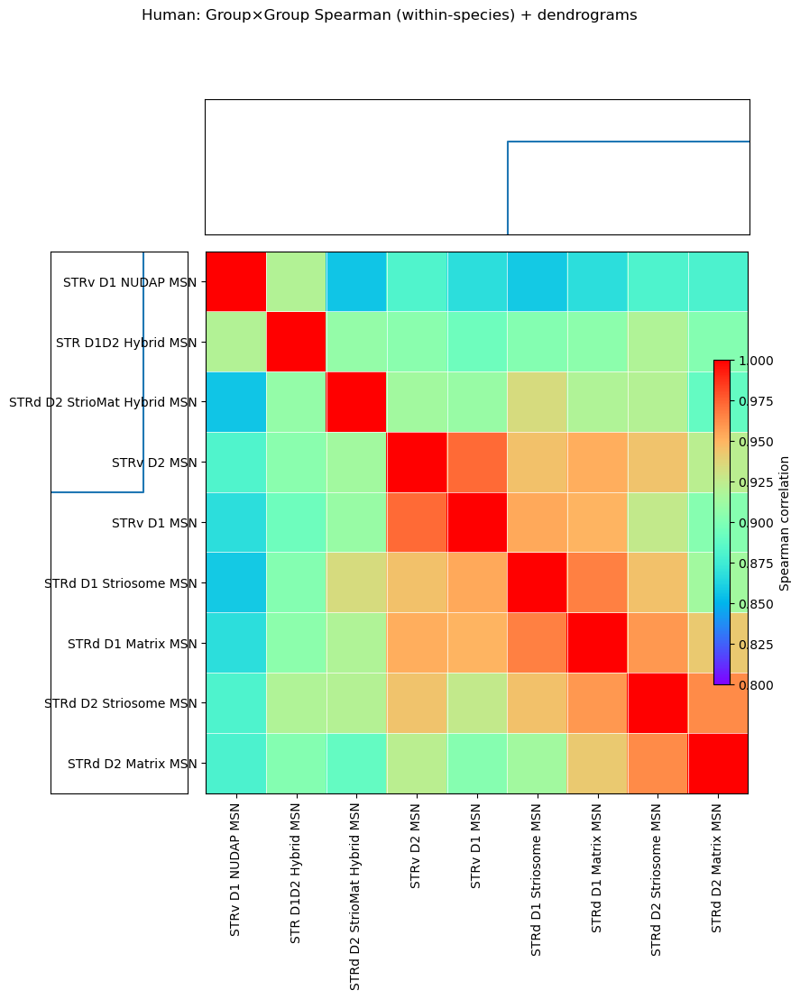

/scratch/fast/4134667/ipykernel_1669021/453438598.py:183: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


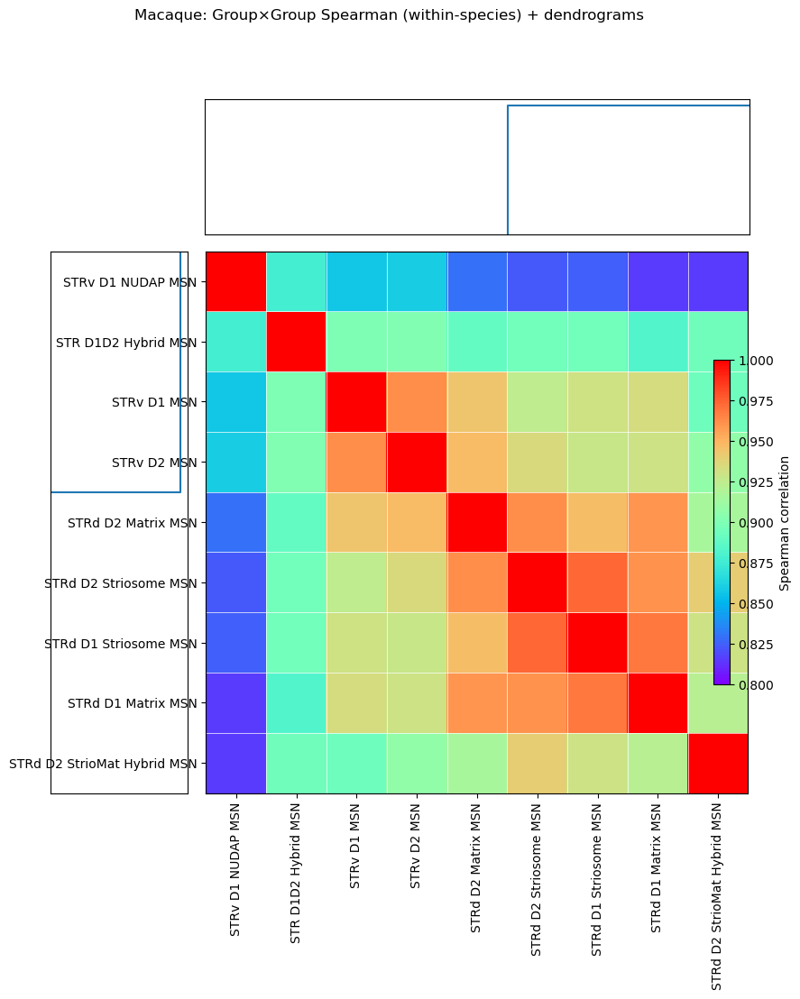

/scratch/fast/4134667/ipykernel_1669021/453438598.py:183: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


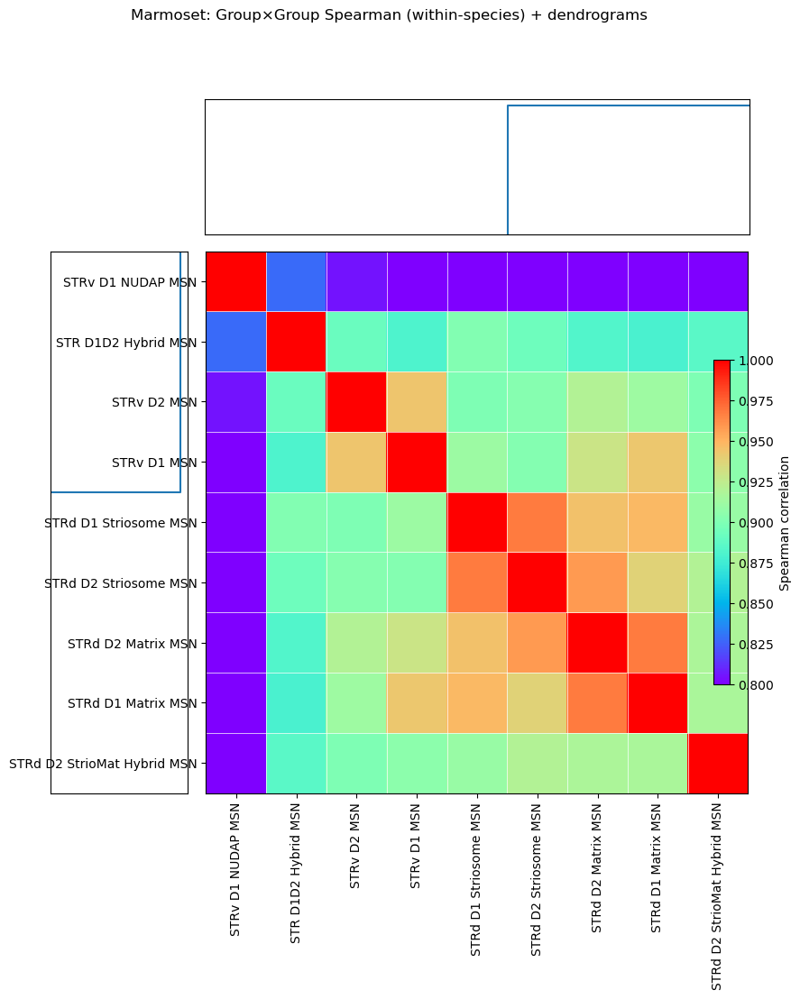

In [21]:
for spc, corr_df in corr_by_sp.items():
    plot_correlation_heatmap_with_dendrogram(
        corr_df,
        title=f"{spc}: Group×Group Spearman (within-species) + dendrograms",
        figsize=(10, 10),
        vmin=0.8, vmax=1,
        cmap="rainbow", #viridis
        annotate=False,
        linkage_method="average",
        optimal_ordering=True,
        output_file=None
    )


In [29]:
adata_msn_ds = downsample_per_cluster_donor(
    adata_msn,
    cluster_key="Cluster",
    donor_key="donor_id",
    max_cells_per_group=100,
    require_shared_donors=True,
    random_state=123  # reproducible
)


In [15]:
adata_msn_ds.obs.groupby(['Cluster', 'donor_id']).size().unstack(fill_value=0)

donor_id,H18.30.001,H19.30.004,H20.30.001,H20.30.002,H21.30.004,H23.30.001,H24.30.001,H24.30.003,H24.30.004,H24.30.007,...,Q21.26.002,Q21.26.010,QM21.26.003,QM23.50.001,QM23.50.002,QM23.50.003,cjCroissant,cjJellybean,cjNutmeg,cjRambo
Cluster,,,,,,,,,,,,,,,,,,,,,
Human-2,81,0,150,500,258,53,232,500,305,397,...,0,0,0,0,0,0,0,0,0,0
Human-8,5,0,82,59,206,3,360,176,15,148,...,0,0,0,0,0,0,0,0,0,0
Human-9,16,0,193,49,366,8,500,141,51,319,...,0,0,0,0,0,0,0,0,0,0
Human-22,39,0,500,500,490,101,271,444,445,500,...,0,0,0,0,0,0,0,0,0,0
Human-23,103,0,169,215,37,500,26,58,454,19,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Marmoset-1222,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,13,500,450,0
Marmoset-1226,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,54,24,0
Marmoset-1228,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,98,37,0


In [30]:
adata_msn_human = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Human'])].copy()
adata_msn_macaque = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Macaque'])].copy()
adata_msn_marmoset = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Marmoset'])].copy()

In [31]:
print(adata_msn_human.shape)
print(adata_msn_macaque.shape)
print(adata_msn_marmoset.shape)

(66672, 16630)
(32941, 16630)
(25594, 16630)


### human

In [32]:
import scanpy as sc

In [47]:
sc.tl.rank_genes_groups(adata_msn_human, "hybrid_vs_classic", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["Hybrid"],reference="Classic", key_added="hybrid_vs_classic") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_human.uns["hybrid_vs_classic"]["names"].dtype.names)
all_groups = adata_msn_human.uns["hybrid_vs_classic"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_human, group=grp, key='hybrid_vs_classic').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_human= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "Hybrid") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_human_filtered = df_filtered.copy()

('Hybrid',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,FOXP2,178.079147,7.941296,0.0,0.0,0.994019,Hybrid
1,LUZP2,175.301331,10.389394,0.0,0.0,0.986724,Hybrid
2,ERBB4,171.910492,3.391320,0.0,0.0,0.999416,Hybrid
3,ADARB2,171.160004,9.926647,0.0,0.0,0.979503,Hybrid
4,TSHZ1,169.935242,6.101737,0.0,0.0,0.973740,Hybrid
5,TRHDE,167.320190,8.432074,0.0,0.0,0.958421,Hybrid
6,SLC35F1,166.836395,4.870334,0.0,0.0,0.997155,Hybrid
7,GALNTL6,165.285477,3.268923,0.0,0.0,0.998614,Hybrid
8,EPHA6,159.103928,1.593939,0.0,0.0,0.998614,Hybrid
9,KCNJ3,158.460892,9.127285,0.0,0.0,0.899044,Hybrid


In [ ]:
df_human_filtered

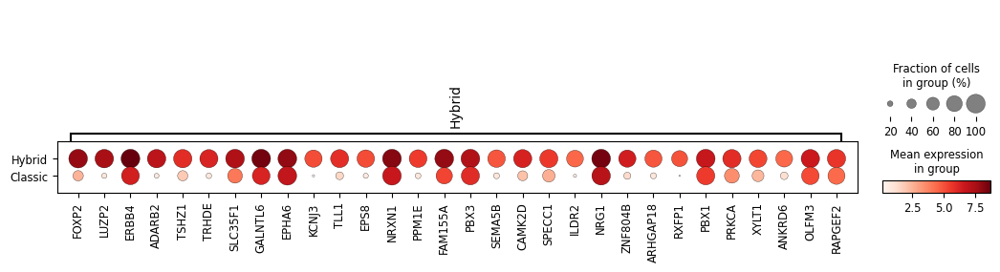

In [48]:
def top_genes_dict_from_df(df_filtered, top_n=10) -> dict:
    """
    Convert a filtered rank_genes_groups DataFrame into a var_names dictionary
    grouped by 'group', each with top N genes based on score.
    """
    top_genes_dict = {}
    for group, group_df in df_filtered.groupby("group"):
        top_genes = (
            group_df
            .sort_values("scores", ascending=False)
            .head(top_n)["names"]
            .tolist()
        )
        top_genes_dict[group] = top_genes
    return top_genes_dict
    

dict_df_filtered = top_genes_dict_from_df(df_human_filtered, top_n=30) # to show the gene patterns of filtered ones


sc.pl.dotplot(
    adata_msn_human,
    var_names=dict_df_filtered,
    groupby="hybrid_vs_classic", # groupby="GM_WM_location",
)

### macaque

In [33]:
sc.tl.rank_genes_groups(adata_msn_macaque, "hybrid_vs_classic", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["Hybrid"], reference="Classic", key_added="hybrid_vs_classic") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_macaque.uns["hybrid_vs_classic"]["names"].dtype.names)
all_groups = adata_msn_macaque.uns["hybrid_vs_classic"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_macaque, group=grp, key='hybrid_vs_classic').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_macaqueMSNs_ds.csv", index=False)
df_macaque= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "Hybrid") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_macaque_filtered = df_filtered.copy()

('Hybrid',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,FOXP2,129.909134,6.914824,0.0,0.0,0.999001,Hybrid
1,GALNTL6,129.107651,5.788788,0.0,0.0,0.999126,Hybrid
2,ERBB4,126.669098,5.236412,0.0,0.0,0.997128,Hybrid
3,TSHZ1,122.412086,6.181649,0.0,0.0,0.965659,Hybrid
4,PBX3,113.468300,2.611110,0.0,0.0,0.997253,Hybrid
5,PPM1E,112.703766,6.624145,0.0,0.0,0.931194,Hybrid
6,FAM155A,110.692993,1.753496,0.0,0.0,0.999875,Hybrid
7,EYA2,106.622475,8.479856,0.0,0.0,0.811439,Hybrid
8,RXFP1,106.590187,10.218843,0.0,0.0,0.798202,Hybrid
9,KCNJ3,106.011848,6.934495,0.0,0.0,0.883242,Hybrid


In [34]:
df_macaque_filtered

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,FOXP2,129.909134,6.914824,0.000000e+00,0.000000e+00,0.999001,Hybrid
1,GALNTL6,129.107651,5.788788,0.000000e+00,0.000000e+00,0.999126,Hybrid
2,ERBB4,126.669098,5.236412,0.000000e+00,0.000000e+00,0.997128,Hybrid
3,TSHZ1,122.412086,6.181649,0.000000e+00,0.000000e+00,0.965659,Hybrid
4,PBX3,113.468300,2.611110,0.000000e+00,0.000000e+00,0.997253,Hybrid
...,...,...,...,...,...,...,...
724,CAPN2,12.818591,1.007096,1.290240e-37,9.942861e-37,0.255994,Hybrid
755,TRMO,12.178740,1.179842,4.034709e-34,2.966278e-33,0.205170,Hybrid
772,LRRC75A,11.956794,1.129945,5.982763e-33,4.316414e-32,0.210040,Hybrid
784,PLD5,11.717320,1.076759,1.039073e-31,7.306465e-31,0.247128,Hybrid


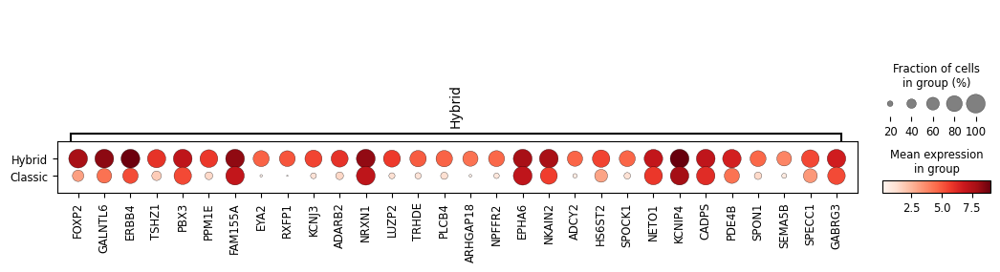

In [42]:
dict_df_filtered = top_genes_dict_from_df(df_macaque_filtered, top_n=30) # to show the gene patterns of filtered ones


sc.pl.dotplot(
    adata_msn_macaque,
    var_names=dict_df_filtered,
    groupby="hybrid_vs_classic", # groupby="GM_WM_location",
)

### marmoset

In [43]:
sc.tl.rank_genes_groups(adata_msn_marmoset, "hybrid_vs_classic", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["Hybrid"],reference="Classic", key_added="hybrid_vs_classic") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_marmoset.uns["hybrid_vs_classic"]["names"].dtype.names)
all_groups = adata_msn_marmoset.uns["hybrid_vs_classic"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_marmoset, group=grp, key='hybrid_vs_classic').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_marmosetMSNs_ds.csv", index=False)
df_marmoset= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "Hybrid") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_marmoset_filtered = df_filtered.copy()


('Hybrid',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,ERBB4,114.202057,6.283837,0.0,0.0,0.999479,Hybrid
1,FOXP2,112.569633,7.363066,0.0,0.0,0.995830,Hybrid
2,GALNTL6,110.050980,5.405732,0.0,0.0,0.996525,Hybrid
3,KCNJ3,106.793961,8.546674,0.0,0.0,0.975851,Hybrid
4,TSHZ1,101.510826,6.208059,0.0,0.0,0.942495,Hybrid
5,NKAIN3,101.191895,8.945581,0.0,0.0,0.945796,Hybrid
6,SLC35F1,100.710815,5.362536,0.0,0.0,0.984017,Hybrid
7,ADARB2,100.622208,7.792326,0.0,0.0,0.955003,Hybrid
8,PPM1E,94.315285,7.084549,0.0,0.0,0.932071,Hybrid
9,CDH12,91.052727,5.976825,0.0,0.0,0.977936,Hybrid


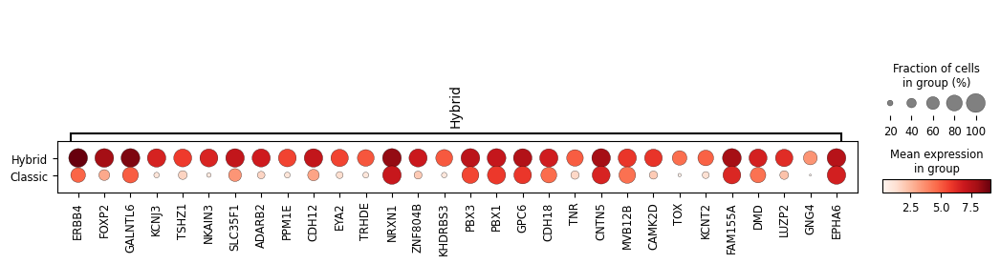

In [46]:
dict_df_filtered = top_genes_dict_from_df(df_marmoset_filtered, top_n=30) # to show the gene patterns of filtered ones


sc.pl.dotplot(
    adata_msn_marmoset,
    var_names=dict_df_filtered,
    groupby="hybrid_vs_classic", # groupby="GM_WM_location",
)

In [51]:
df_human_filtered

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,FOXP2,178.079147,7.941296,0.000000e+00,0.000000e+00,0.994019,Hybrid
1,LUZP2,175.301331,10.389394,0.000000e+00,0.000000e+00,0.986724,Hybrid
2,ERBB4,171.910492,3.391320,0.000000e+00,0.000000e+00,0.999416,Hybrid
3,ADARB2,171.160004,9.926647,0.000000e+00,0.000000e+00,0.979503,Hybrid
4,TSHZ1,169.935242,6.101737,0.000000e+00,0.000000e+00,0.973740,Hybrid
...,...,...,...,...,...,...,...
1106,HACD1,16.377193,1.089612,2.782923e-60,1.484761e-59,0.219783,Hybrid
1125,PDZRN3,16.111727,1.299469,2.110498e-58,1.104740e-57,0.202495,Hybrid
1157,SEL1L3,15.481467,1.017130,4.627955e-54,2.342145e-53,0.221460,Hybrid
1192,CADM4,15.108451,1.009762,1.424493e-51,7.048297e-51,0.208039,Hybrid


### Veen Plot of DEGs

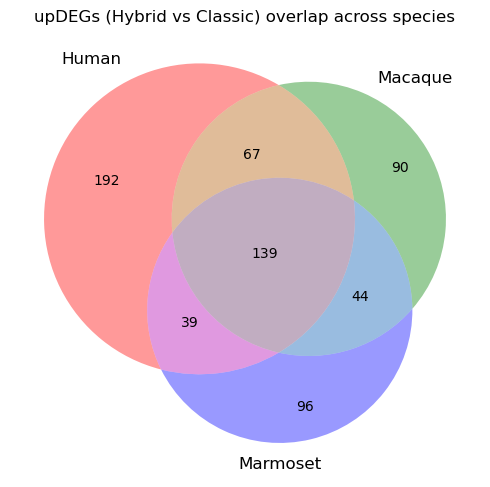

All three: 139
Human∩Macaque: 206
Human∩Marmoset: 178
Macaque∩Marmoset: 183


In [54]:
from matplotlib_venn import venn3

genes_h = set(df_human_filtered["names"])
genes_m = set(df_macaque_filtered["names"])
genes_mm = set(df_marmoset_filtered["names"])

plt.figure(figsize=(5,5))
venn3([genes_h, genes_m, genes_mm], set_labels=("Human","Macaque","Marmoset"))
plt.title("upDEGs (Hybrid vs Classic) overlap across species")
plt.tight_layout()
plt.show()


print("All three:", len(genes_h & genes_m & genes_mm))
print("Human∩Macaque:", len(genes_h & genes_m))
print("Human∩Marmoset:", len(genes_h & genes_mm))
print("Macaque∩Marmoset:", len(genes_m & genes_mm))


In [55]:
genes_human_only = genes_h - (genes_m | genes_mm)
genes_macaque_only = genes_m - (genes_h | genes_mm)
genes_marmoset_only = genes_mm - (genes_h | genes_m)


genes_human_macaque_shared = (genes_h & genes_m) - genes_mm
genes_human_marmoset_shared = (genes_h & genes_mm) - genes_m
genes_macaque_marmoset_shared = (genes_m & genes_mm) - genes_h


genes_shared_all_three = genes_h & genes_m & genes_mm


In [58]:
genes_human_only

{'ABCA1',
 'ABHD6',
 'ADAM32',
 'ADAM9',
 'ADAMTS10',
 'ADCY6',
 'AFAP1',
 'AFF2',
 'AHRR',
 'ANK1',
 'ANKRD29',
 'ARL6',
 'ATP1A3',
 'ATP8B4',
 'BAALC',
 'BACH1',
 'BAIAP3',
 'BICC1',
 'BLVRA',
 'C4H3orf33',
 'CADM4',
 'CALCOCO2',
 'CBLB',
 'CCDC152',
 'CDK5R1',
 'CEP112',
 'CHRM5',
 'CLEC2L',
 'COL28A1',
 'COL6A1',
 'COLGALT2',
 'CREG2',
 'CRHR1',
 'CRHR2',
 'CRTAC1',
 'CXCL14',
 'DDAH1',
 'DENND2A',
 'DIRAS3',
 'DISC1',
 'DNAH8',
 'DOC2B',
 'DRD1',
 'ELN',
 'EPDR1',
 'EPHA4',
 'ETS2',
 'FAM102B',
 'FAM107B',
 'FAM160A1',
 'FAM189A2',
 'FAM47E',
 'FBXO27',
 'FERMT2',
 'FGD4',
 'FGFR1',
 'FNIP2',
 'FOXN3',
 'FRAS1',
 'FRK',
 'FRMD3',
 'FXYD6',
 'FZD6',
 'GABRQ',
 'GALNT2',
 'GHR',
 'GNAI2',
 'GRAMD1B',
 'GRB14',
 'GRIK3',
 'GRIN2A',
 'GSAP',
 'HACD1',
 'HIPK2',
 'HPCAL1',
 'HS3ST1',
 'HS6ST1',
 'IFFO2',
 'INPP5B',
 'INSR',
 'IQGAP1',
 'IRS1',
 'JAG1',
 'KCNIP3',
 'KCNK13',
 'KIAA2012',
 'KIF21B',
 'KIT',
 'KLHL4',
 'LAMA2',
 'LECT2',
 'LHFPL6',
 'LIN7A',
 'LMNTD1',
 'LSM11',
 'LSM14A'

### TFs

In [21]:
df_tfs = pd.read_csv("/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/Human/BasalGanglia/analysis/f1" + "/TFs_lambert_pmid29425488_1.01.txt")
tf_genes = set(df_tfs["hgnc_symbol"]) 
#tf_genes

In [67]:
genes_human_only_tf = list(set(genes_human_only) & set(tf_genes))
print(genes_human_only_tf)


genes_shared_all_three_tf = list(set(genes_shared_all_three) & set(tf_genes))
print(genes_shared_all_three_tf)

['SOX1', 'MKX', 'BACH1', 'FOXN3', 'RXRG', 'ETS2', 'PRDM5', 'SOX11', 'ZNF496', 'ZBTB16', 'KCNIP3', 'AHRR']
['ZNF804B', 'CUX2', 'PBX3', 'ZNF608', 'PBX1', 'TSHZ1', 'FOXP2', 'NFIB', 'ETV6', 'HIVEP1', 'SOX2', 'NFIX']


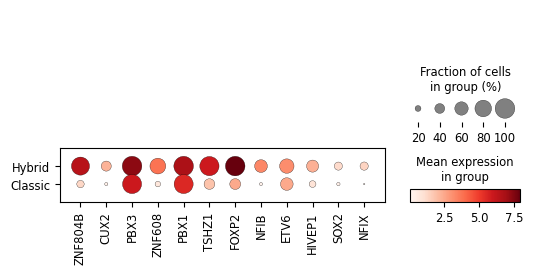

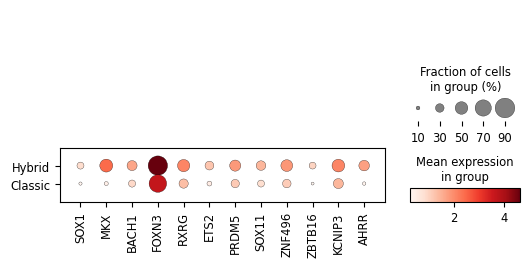

In [69]:
sc.pl.dotplot(
    adata_msn_human,
    var_names=genes_shared_all_three_tf,
    groupby="hybrid_vs_classic", # groupby="GM_WM_location",
)

sc.pl.dotplot(
    adata_msn_human,
    var_names=genes_human_only_tf,
    groupby="hybrid_vs_classic", # groupby="GM_WM_location",
)

In [ ]:
dict_df_filtered_tf = top_genes_dict_from_df(df_filtered_tf, top_n=30) # " df_filtered_tf " !!!! to show the gene patterns of filtered TF ones

sc.pl.rank_genes_groups_dotplot(
    adata,
    var_names=dict_df_filtered_tf, # filtered by " df_filtered_tf " 
    key="GM_WM_4_Subtypes", # groupby="GM_WM_location",
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-4,
    vmax=4,
    min_logfoldchange=2,
    swap_axes=False,  
    colorbar_title='log fold change',
    figsize=(15,1.5),
)

### GO of overlapped Hybrids up-regulated genes

### GO of human-specific Hybrids up-regulated genes

## D2 StrioMat

In [7]:
set(adata_msn.obs['Group'])

{'OT D1 ICj',
 'STR D1D2 Hybrid MSN',
 'STRd D1 Matrix MSN',
 'STRd D1 Striosome MSN',
 'STRd D2 Matrix MSN',
 'STRd D2 StrioMat Hybrid MSN',
 'STRd D2 Striosome MSN',
 'STRv D1 MSN',
 'STRv D1 NUDAP MSN',
 'STRv D2 MSN'}

### D2 StrioMat vs other 9 groups

In [8]:
mapping = {
    'OT D1 ICj': 'nonStrioMat',
    'STR D1D2 Hybrid MSN': 'nonStrioMat',
    'STRd D1 Matrix MSN': 'nonStrioMat',
     'STRd D1 Striosome MSN': 'nonStrioMat',
     'STRd D2 Matrix MSN': 'nonStrioMat',
     'STRd D2 StrioMat Hybrid MSN': 'D2_StrioMat',
     'STRd D2 Striosome MSN': 'nonStrioMat',
     'STRv D1 MSN': 'nonStrioMat',
     'STRv D1 NUDAP MSN': 'nonStrioMat',
     'STRv D2 MSN': 'nonStrioMat',
}

adata_msn.obs["D2StrioMat_or_not"] = adata_msn.obs["Group"].map(mapping)
#ordered
adata_msn.obs["D2StrioMat_or_not"] = pd.Categorical(
    adata_msn.obs["D2StrioMat_or_not"],
    categories=["D2_StrioMat", "nonStrioMat"],  
    ordered=False,
)

adata_msn.obs["D2StrioMat_or_not"].value_counts(dropna=False)


D2StrioMat_or_not
nonStrioMat    834718
D2_StrioMat     13483
Name: count, dtype: int64

In [13]:
adata_msn_ds = downsample_per_cluster_donor(
    adata_msn,
    cluster_key="Group",
    donor_key="donor_id",
    max_cells_per_group=400,
    require_shared_donors=True,
    random_state=123  # reproducible
)


In [14]:
adata_msn_ds.obs["D2StrioMat_or_not"].value_counts(dropna=False)


D2StrioMat_or_not
nonStrioMat    67060
D2_StrioMat     7024
Name: count, dtype: int64

In [15]:
adata_msn_human = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Human'])].copy()
adata_msn_macaque = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Macaque'])].copy()
adata_msn_marmoset = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Marmoset'])].copy()

In [16]:
sc.tl.rank_genes_groups(adata_msn_human, "D2StrioMat_or_not", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["D2_StrioMat"],reference="nonStrioMat", key_added="D2StrioMat_or_not") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_human.uns["D2StrioMat_or_not"]["names"].dtype.names)
all_groups = adata_msn_human.uns["D2StrioMat_or_not"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_human, group=grp, key='D2StrioMat_or_not').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
#df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_human= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "D2_StrioMat") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_human_filtered = df_filtered.copy()

('D2_StrioMat',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,PTPRT,90.188766,3.216585,0.0,0.0,0.998056,D2_StrioMat
1,SEMA6D,89.975769,3.999984,0.0,0.0,0.999167,D2_StrioMat
2,ZNF804A,87.224770,2.776852,0.0,0.0,1.000000,D2_StrioMat
3,GRIK3,86.851540,6.326723,0.0,0.0,0.986389,D2_StrioMat
4,DACH1,84.284805,2.651689,0.0,0.0,0.999722,D2_StrioMat
5,NCAM2,83.506538,2.257694,0.0,0.0,0.997222,D2_StrioMat
6,NETO1,82.336258,2.083284,0.0,0.0,0.996667,D2_StrioMat
7,GRIP1,82.198448,1.589424,0.0,0.0,1.000000,D2_StrioMat
8,AUTS2,81.746513,0.908494,0.0,0.0,1.000000,D2_StrioMat
9,DSCAML1,80.212196,2.554775,0.0,0.0,0.998056,D2_StrioMat


In [ ]:
sc.tl.rank_genes_groups(adata_msn_macaque, "D2StrioMat_or_not", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["D2_StrioMat"],reference="nonStrioMat", key_added="D2StrioMat_or_not") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_macaque.uns["D2StrioMat_or_not"]["names"].dtype.names)
all_groups = adata_msn_macaque.uns["D2StrioMat_or_not"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_macaque, group=grp, key='D2StrioMat_or_not').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
#df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_macaque= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "D2_StrioMat") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_macaque_filtered = df_filtered.copy()

In [18]:
sc.tl.rank_genes_groups(adata_msn_marmoset, "D2StrioMat_or_not", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["D2_StrioMat"],reference="nonStrioMat", key_added="D2StrioMat_or_not") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_marmoset.uns["D2StrioMat_or_not"]["names"].dtype.names)
all_groups = adata_msn_marmoset.uns["D2StrioMat_or_not"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_marmoset, group=grp, key='D2StrioMat_or_not').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
#df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_marmoset= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "D2_StrioMat") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_marmoset_filtered = df_filtered.copy()

('D2_StrioMat',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,SEMA3E,43.161636,7.140932,0.000000e+00,0.000000e+00,0.982123,D2_StrioMat
1,GRIP1,39.494968,1.675484,0.000000e+00,0.000000e+00,1.000000,D2_StrioMat
2,DACH1,38.994740,3.106482,0.000000e+00,0.000000e+00,0.996648,D2_StrioMat
3,NETO1,38.309975,2.381830,0.000000e+00,0.000000e+00,0.995531,D2_StrioMat
4,PTPRO,38.162422,1.903981,0.000000e+00,0.000000e+00,0.997765,D2_StrioMat
5,PHACTR2,38.068710,4.665534,0.000000e+00,0.000000e+00,0.966480,D2_StrioMat
6,NTNG1,38.060974,5.961360,0.000000e+00,0.000000e+00,0.900559,D2_StrioMat
7,TNC,37.850075,9.682956,0.000000e+00,0.000000e+00,0.767598,D2_StrioMat
8,AFF1,37.130253,5.435855,9.133320e-302,1.012581e-298,0.867039,D2_StrioMat
9,ZNF804A,36.766689,1.942758,6.292134e-296,6.155187e-293,1.000000,D2_StrioMat


#### veen

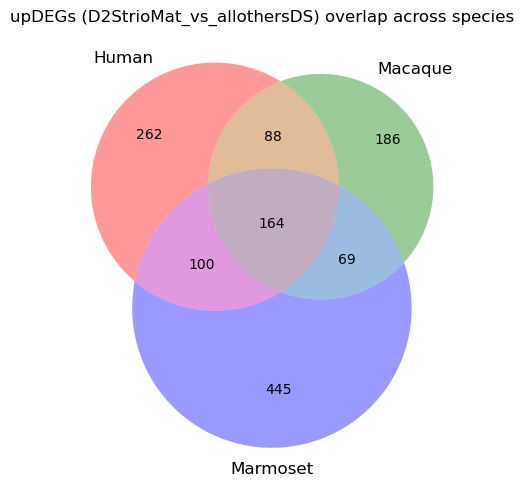

All three: 164
Human∩Macaque: 252
Human∩Marmoset: 264
Macaque∩Marmoset: 233


In [19]:
from matplotlib_venn import venn3

genes_h = set(df_human_filtered["names"])
genes_m = set(df_macaque_filtered["names"])
genes_mm = set(df_marmoset_filtered["names"])

plt.figure(figsize=(5,5))
venn3([genes_h, genes_m, genes_mm], set_labels=("Human","Macaque","Marmoset"))
plt.title("upDEGs (D2StrioMat_vs_allothersDS) overlap across species")
plt.tight_layout()
plt.show()


print("All three:", len(genes_h & genes_m & genes_mm))
print("Human∩Macaque:", len(genes_h & genes_m))
print("Human∩Marmoset:", len(genes_h & genes_mm))
print("Macaque∩Marmoset:", len(genes_m & genes_mm))


In [20]:
genes_human_only = genes_h - (genes_m | genes_mm)
genes_macaque_only = genes_m - (genes_h | genes_mm)
genes_marmoset_only = genes_mm - (genes_h | genes_m)


genes_human_macaque_shared = (genes_h & genes_m) - genes_mm
genes_human_marmoset_shared = (genes_h & genes_mm) - genes_m
genes_macaque_marmoset_shared = (genes_m & genes_mm) - genes_h


genes_shared_all_three = genes_h & genes_m & genes_mm

In [22]:
genes_human_only_tf = list(set(genes_human_only) & set(tf_genes))
print(genes_human_only_tf)


genes_shared_all_three_tf = list(set(genes_shared_all_three) & set(tf_genes))
print(genes_shared_all_three_tf)

['SREBF1', 'TET3', 'SOHLH2', 'ARNTL2', 'CREB5', 'ZBTB34', 'BAZ2B', 'BACH1', 'LIN28B', 'ARHGAP35', 'ARID3A', 'MLXIP', 'CXXC4', 'BHLHE40', 'ZNF385A', 'STAT4', 'DEAF1', 'KLF7', 'ZNF625', 'ZNF385C', 'ETV6', 'SKIL']
['NR3C2', 'NR4A3', 'ESRRG', 'NPAS3', 'FOXP1', 'POU3F1', 'ZNF385D', 'KLF12', 'SP9', 'ZNF804A', 'ZBTB7C', 'BACH2', 'BCL11A', 'RXRG', 'SIX3', 'DACH1']


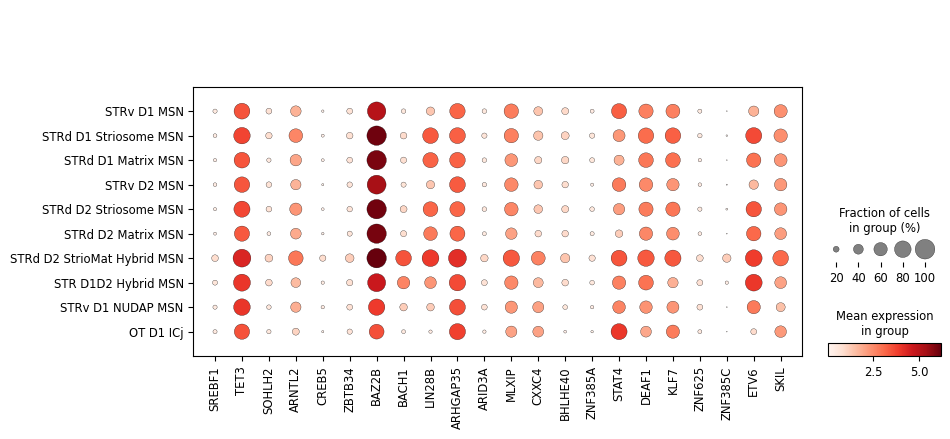

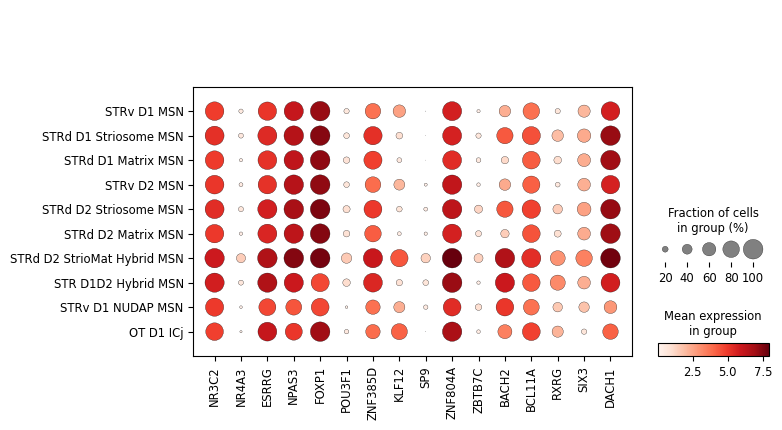

In [24]:
sc.pl.dotplot(
    adata_msn_human,
    var_names=genes_human_only_tf,
    groupby="Group", # groupby="GM_WM_location",
)

sc.pl.dotplot(
    adata_msn_human,
    var_names=genes_shared_all_three_tf,
    groupby="Group", # groupby="GM_WM_location",
)

### D2 strioMat with other D2 groups (within D2 subclass)

In [30]:
adata_msn_ds = adata_msn_ds[adata_msn_ds.obs["Subclass"].isin(['STR D2 MSN'])].copy() #only D2 island

adata_msn_human = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Human'])].copy()
adata_msn_macaque = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Macaque'])].copy()
adata_msn_marmoset = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Marmoset'])].copy()

In [31]:
print(adata_msn_human.obs["Group"].value_counts(dropna=False))
print(adata_msn_macaque.obs["Group"].value_counts(dropna=False))
print(adata_msn_marmoset.obs["Group"].value_counts(dropna=False))

Group
STRv D2 MSN                    3601
STRd D2 Striosome MSN          3600
STRd D2 Matrix MSN             3600
STRd D2 StrioMat Hybrid MSN    3600
Name: count, dtype: int64
Group
STRv D2 MSN                    2800
STRd D2 Striosome MSN          2800
STRd D2 Matrix MSN             2800
STRd D2 StrioMat Hybrid MSN    2529
Name: count, dtype: int64
Group
STRd D2 Matrix MSN             1600
STRd D2 Striosome MSN          1470
STRv D2 MSN                    1203
STRd D2 StrioMat Hybrid MSN     895
Name: count, dtype: int64


In [32]:
sc.tl.rank_genes_groups(adata_msn_human, "D2StrioMat_or_not", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["D2_StrioMat"],reference="nonStrioMat", key_added="D2StrioMat_or_not") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_human.uns["D2StrioMat_or_not"]["names"].dtype.names)
all_groups = adata_msn_human.uns["D2StrioMat_or_not"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_human, group=grp, key='D2StrioMat_or_not').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
#df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_human= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "D2_StrioMat") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_human_filtered = df_filtered.copy()

('D2_StrioMat',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,KCNT2,87.480019,9.383757,0.0,0.0,0.990833,D2_StrioMat
1,SEMA6D,86.037376,3.919282,0.0,0.0,0.999167,D2_StrioMat
2,NRG1,85.576981,2.431287,0.0,0.0,0.999167,D2_StrioMat
3,PTPRT,83.950256,2.933520,0.0,0.0,0.998056,D2_StrioMat
4,ZNF804A,81.880577,2.655121,0.0,0.0,1.000000,D2_StrioMat
5,LRP1B,81.613449,1.810375,0.0,0.0,1.000000,D2_StrioMat
6,SORCS2,80.578178,2.699944,0.0,0.0,0.992500,D2_StrioMat
7,CNTN5,80.391739,6.880020,0.0,0.0,0.991944,D2_StrioMat
8,GABRG3,80.167030,2.134045,0.0,0.0,0.998611,D2_StrioMat
9,NETO1,80.027802,2.006324,0.0,0.0,0.996667,D2_StrioMat


In [33]:
sc.tl.rank_genes_groups(adata_msn_macaque, "D2StrioMat_or_not", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["D2_StrioMat"],reference="nonStrioMat", key_added="D2StrioMat_or_not") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_macaque.uns["D2StrioMat_or_not"]["names"].dtype.names)
all_groups = adata_msn_macaque.uns["D2StrioMat_or_not"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_macaque, group=grp, key='D2StrioMat_or_not').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
#df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_macaque= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "D2_StrioMat") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_macaque_filtered = df_filtered.copy()

('D2_StrioMat',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,KCNT2,73.220009,9.473077,0.0,0.0,0.983393,D2_StrioMat
1,NETO1,68.391151,2.263370,0.0,0.0,0.998814,D2_StrioMat
2,PTPRT,66.997261,5.994681,0.0,0.0,0.971530,D2_StrioMat
3,SEMA6D,66.271179,3.213980,0.0,0.0,0.997232,D2_StrioMat
4,GRIK1,64.706001,9.852721,0.0,0.0,0.862001,D2_StrioMat
5,ZNF804A,63.674538,1.533982,0.0,0.0,1.000000,D2_StrioMat
6,TEAD1,62.791073,5.829898,0.0,0.0,0.926849,D2_StrioMat
7,GRIP1,62.408558,1.116278,0.0,0.0,1.000000,D2_StrioMat
8,GABRG3,61.467472,2.023844,0.0,0.0,0.996837,D2_StrioMat
9,FAM155A,60.987724,1.691404,0.0,0.0,1.000000,D2_StrioMat


In [34]:
sc.tl.rank_genes_groups(adata_msn_marmoset, "D2StrioMat_or_not", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups= ["D2_StrioMat"],reference="nonStrioMat", key_added="D2StrioMat_or_not") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_marmoset.uns["D2StrioMat_or_not"]["names"].dtype.names)
all_groups = adata_msn_marmoset.uns["D2StrioMat_or_not"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_marmoset, group=grp, key='D2StrioMat_or_not').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
#df_all.to_csv(work_dir + "/rank_genes_hybrid_vs_classic_DEGs_in_humanMSNs_ds.csv", index=False)
df_marmoset= df_all.copy()

df_filtered = df_all[
    (df_all["group"] == "D2_StrioMat") &
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_marmoset_filtered = df_filtered.copy()

('D2_StrioMat',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,SEMA3E,43.060802,7.659886,0.000000e+00,0.000000e+00,0.982123,D2_StrioMat
1,PTPRT,41.807419,5.157240,0.000000e+00,0.000000e+00,0.985475,D2_StrioMat
2,NETO1,40.640121,2.342156,0.000000e+00,0.000000e+00,0.995531,D2_StrioMat
3,GRIP1,39.889519,1.501998,0.000000e+00,0.000000e+00,1.000000,D2_StrioMat
4,GALNTL6,39.298744,4.602518,0.000000e+00,0.000000e+00,0.984358,D2_StrioMat
5,KCNT2,38.536903,6.601438,0.000000e+00,0.000000e+00,0.932961,D2_StrioMat
6,NRXN3,38.248821,0.898788,0.000000e+00,0.000000e+00,1.000000,D2_StrioMat
7,TAC1,37.973907,6.649565,0.000000e+00,0.000000e+00,0.905028,D2_StrioMat
8,GPHN,37.077827,0.895115,6.397366e-301,5.910456e-298,0.998883,D2_StrioMat
9,FAM155A,36.896370,2.583836,5.284236e-298,4.625097e-295,0.996648,D2_StrioMat


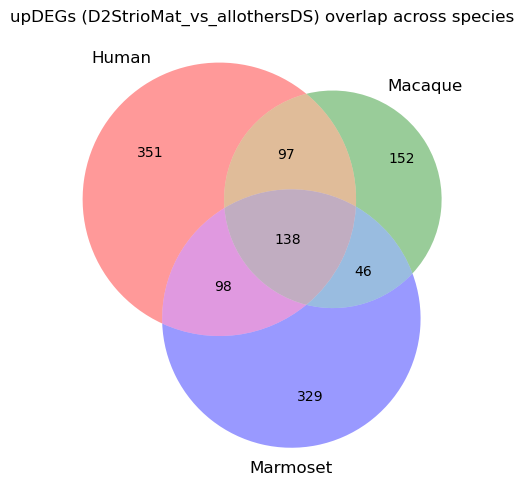

All three: 138
Human∩Macaque: 235
Human∩Marmoset: 236
Macaque∩Marmoset: 184


In [35]:
from matplotlib_venn import venn3

genes_h = set(df_human_filtered["names"])
genes_m = set(df_macaque_filtered["names"])
genes_mm = set(df_marmoset_filtered["names"])

plt.figure(figsize=(5,5))
venn3([genes_h, genes_m, genes_mm], set_labels=("Human","Macaque","Marmoset"))
plt.title("upDEGs (D2StrioMat_vs_allothersDS) overlap across species")
plt.tight_layout()
plt.show()


print("All three:", len(genes_h & genes_m & genes_mm))
print("Human∩Macaque:", len(genes_h & genes_m))
print("Human∩Marmoset:", len(genes_h & genes_mm))
print("Macaque∩Marmoset:", len(genes_m & genes_mm))


In [36]:
genes_human_only = genes_h - (genes_m | genes_mm)
genes_macaque_only = genes_m - (genes_h | genes_mm)
genes_marmoset_only = genes_mm - (genes_h | genes_m)


genes_human_macaque_shared = (genes_h & genes_m) - genes_mm
genes_human_marmoset_shared = (genes_h & genes_mm) - genes_m
genes_macaque_marmoset_shared = (genes_m & genes_mm) - genes_h


genes_shared_all_three = genes_h & genes_m & genes_mm

In [37]:
genes_human_only_tf = list(set(genes_human_only) & set(tf_genes))
print(genes_human_only_tf)


genes_shared_all_three_tf = list(set(genes_shared_all_three) & set(tf_genes))
print(genes_shared_all_three_tf)

['SREBF1', 'TET3', 'SOHLH2', 'ARNTL2', 'ZFHX2', 'ZNF709', 'CREB5', 'ZBTB34', 'BACH1', 'LIN28B', 'ARID3A', 'MLXIP', 'JDP2', 'ZNF34', 'PRDM5', 'FOXK1', 'CXXC4', 'ETS2', 'ZNF385A', 'ZBED3', 'STAT4', 'ZNF343', 'DEAF1', 'KLF7', 'NPAS2', 'RUNX2', 'ZNF625', 'ZNF385C', 'SKIL', 'SOX5', 'ZNF821']
['POU3F1', 'NR4A3', 'ESRRG', 'BAZ2A', 'ZBTB7C', 'KLF12', 'ZNF804A', 'SAFB2', 'FOXN3', 'TCF4', 'NCOA3', 'BACH2', 'ETV6', 'BCL11A', 'RXRG', 'DACH1']


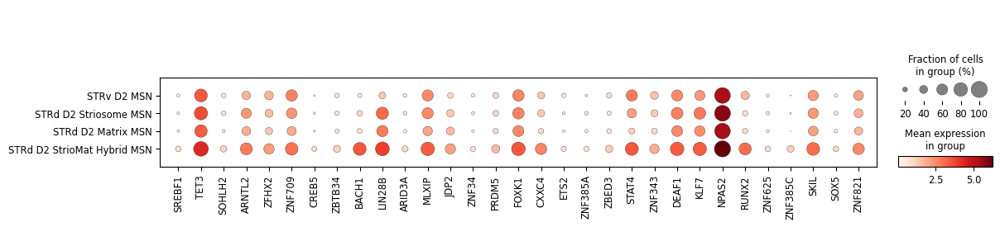

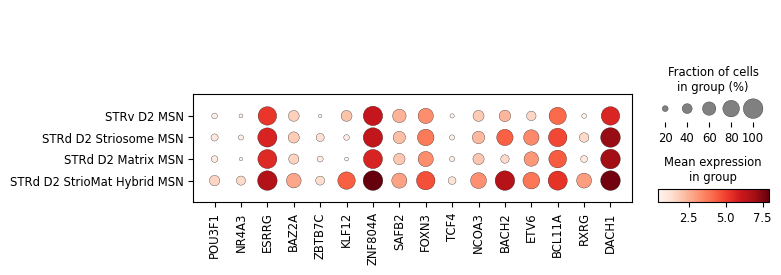

In [38]:
sc.pl.dotplot(
    adata_msn_human,
    var_names=genes_human_only_tf,
    groupby="Group", # groupby="GM_WM_location",
)

sc.pl.dotplot(
    adata_msn_human,
    var_names=genes_shared_all_three_tf,
    groupby="Group", # groupby="GM_WM_location",
)

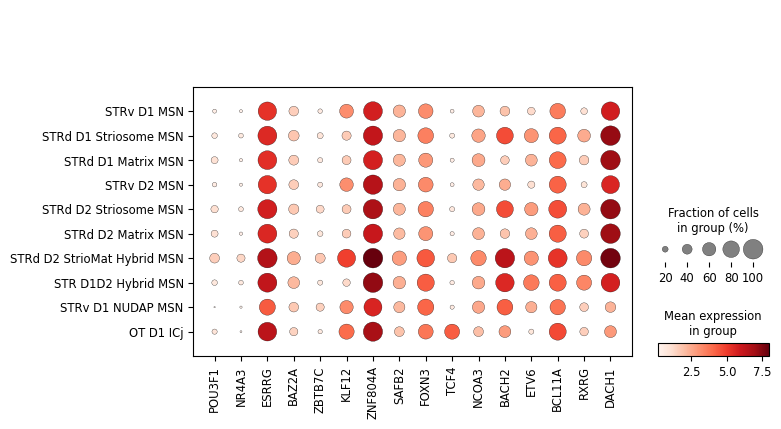

In [39]:
sc.pl.dotplot(
    adata_msn,
    var_names=genes_shared_all_three_tf,
    groupby="Group", # groupby="GM_WM_location",
)

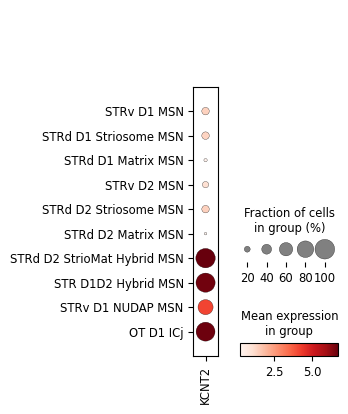

In [40]:
sc.pl.dotplot(
    adata_msn,
    var_names=['KCNT2'],
    groupby="Group", # groupby="GM_WM_location",
)

## logReg markers

In [3]:
adata_msn=sc.read_h5ad("Consensus_preprint_3species_MSNs-ICj_withlogCPM_X.h5ad") #10 groups

In [9]:
group_order = ['STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 
               'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN', 'STR D1D2 Hybrid MSN', 'STRv D1 NUDAP MSN', 'OT D1 ICj',
               ]
adata_msn.obs['Group'] = pd.Categorical(adata_msn.obs['Group'],
                                          categories=group_order,
                                          ordered=True)

In [6]:
import xarray as xr
import pandas as pd

top_k = 15
species_key = "organism"
leaf_key = "Group_propagated"

da = xr.open_dataset('/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/anno_tables/RNA/log_reg_markers.netcdf')['logreg_score']
conserved_da = da.min(dim=species_key, skipna=True) # can add .sel({'organism':['Human','Macaque','Marmoset']}) to do just primate (but looks the sameish)
conserved_df = pd.DataFrame(
    conserved_da.transpose("var", leaf_key).values,
    index=conserved_da.coords["var"].data,
    columns=conserved_da.coords[leaf_key].data
)

top_genes = None
if top_k is not None:
    top_genes = {
        g: conserved_df[g].dropna().sort_values(ascending=False).head(top_k)
        for g in conserved_da.coords[leaf_key].data
    }
 

In [5]:
print(da)

<xarray.DataArray 'logreg_score' (organism: 4, Group_propagated: 44, var: 15466)> Size: 11MB
array([[[-5.535985e-03, -4.573903e-04, ...,  0.000000e+00,  1.729015e-02],
        [-2.041380e-03, -4.486254e-04, ...,  0.000000e+00, -3.842673e-03],
        ...,
        [-1.530141e-03,  4.770744e-05, ...,  0.000000e+00, -5.055330e-03],
        [-7.663436e-04, -1.005463e-04, ...,  0.000000e+00, -1.224140e-03]],

       [[-1.703161e-02,  6.904841e-03, ..., -3.031378e-04, -6.120100e-03],
        [-8.791913e-03,  4.697954e-03, ..., -3.004497e-04, -7.420410e-03],
        ...,
        [ 1.561879e-02,  1.538037e-03, ..., -9.171429e-05, -9.048665e-04],
        [-1.692221e-03, -8.567343e-04, ..., -3.934962e-05,  3.368655e-03]],

       [[-3.582384e-03,  2.506083e-04, ...,  7.360227e-04,  2.492922e-03],
        [-1.710993e-03, -1.791667e-03, ...,  2.291955e-03, -3.618477e-03],
        ...,
        [ 3.151114e-03, -1.274312e-03, ..., -3.225744e-04, -7.065893e-03],
        [-5.933799e-04,  2.813074e-03, 

In [7]:
top_genes

{'STRd D1 Matrix MSN': EBF1       0.198910
 RELN       0.138289
 TAC1       0.136176
 PCDH9      0.099980
 DRD1       0.097055
 LINGO2     0.096400
 GALNT18    0.094026
 DCC        0.090652
 SLC35F3    0.085684
 FOXP2      0.068668
 PDZD2      0.061102
 ROBO2      0.059391
 LDB2       0.057153
 ZNF385B    0.056585
 EPHB1      0.054759
 Name: STRd D1 Matrix MSN, dtype: float32,
 'STRd D1 Striosome MSN': RELN       0.195279
 TAC1       0.162492
 SORCS1     0.109723
 HS6ST3     0.104370
 LINGO2     0.095599
 DRD1       0.094594
 FOXP2      0.088143
 MCTP1      0.074220
 DACH1      0.068880
 KHDRBS3    0.064817
 GPC6       0.062345
 GALNT18    0.055784
 GRIK2      0.052701
 ROBO2      0.047468
 KCNH1      0.047181
 Name: STRd D1 Striosome MSN, dtype: float32,
 'STRd D2 Matrix MSN': DRD2        0.239282
 PENK        0.202960
 CHRM3       0.150797
 PTPRM       0.099853
 ADORA2A     0.093767
 GRIK3       0.089770
 GRM3        0.086301
 HS3ST4      0.080413
 KCNH7       0.072955
 SGCZ        0

In [11]:
markers = [
    "FOXP2", "EBF1", "LINGO2", "DRD1", "DCC", "PCDH7", "SLC35F3", "DOCK10", "GALNT18", "MAP3K5",  # STRv D1 MSN
    "RELN", "TAC1", "SORCS1", "HS6ST3", "LINGO2", "DRD1", "FOXP2", "MCTP1", "DACH1", "GPC6", # STRd D1 Striosome MSN
    "EBF1", "RELN", "TAC1", "PCDH9", "DRD1", "LINGO2", "GALNT18", "DCC", "SLC35F3", "FOXP2",  # STRd D1 Matrix MSN
    "PENK", "DRD2", "PTPRM", "UNC5D", "SGCZ", "HTR2C", "GUCY1A1", "CHRM3", "ADORA2A", "KIRREL3",  # STRv D2 MSN
    "DRD2", "PENK", "CHRM3", "FIG4", "KCNK2", "PTPRM", "GRIK3", "ADORA2A", "PRKD1", "GPR88",  # STRd D2 Striosome MSN
    "DRD2", "PENK", "CHRM3", "PTPRM", "ADORA2A", "GRIK3", "GRM3", "HS3ST4", "KCNH7", "SGCZ",  # STRd D2 Matrix MSN
    "DACH1", "PTPRT", "BACH2", "ZNF804A", "GRIK3", "DRD2", "KCNT2", "MAML3", "SORCS2", "NETO1",  # STRd D2 StrioMat Hybrid MSN
    "FOXP2", "ADARB2", "ALK", "KCNT2", "GALNTL6", "PBX3", "SORCS2", "RARB", "TSHZ1", "PHACTR1",  # STR D1D2 Hybrid MSN
    "FOXP2", "ERBB4", "ZNF804B", "TSHZ1", "MEIS2", "PBX3", "EPHA6", "KCNIP4", "SLC35F1", "OLFM3",  # STRv D1 NUDAP MSN
    "FOXP2", "GRM1", "GPR149", "HTR4", "RASGRP1", "FSTL4", "ACVR2A", "FOXP1", "CACNA2D3", "NLGN1",  # OT D1 ICj
]

marker1 = [
    "FOXP2", "EBF1", "LINGO2", "DRD1", "DCC", "PCDH7", "SLC35F3", "DOCK10", "GALNT18", "MAP3K5",  # STRv D1 MSN
    "RELN", "TAC1", "SORCS1", "HS6ST3", "LINGO2", "DRD1", "FOXP2", "MCTP1", "DACH1", "GPC6", # STRd D1 Striosome MSN
    "EBF1", "RELN", "TAC1", "PCDH9", "DRD1", "LINGO2", "GALNT18", "DCC", "SLC35F3", "FOXP2",  # STRd D1 Matrix MSN
]

marker2 = [
    "PENK", "DRD2", "PTPRM", "UNC5D", "SGCZ", "HTR2C", "GUCY1A1", "CHRM3", "ADORA2A", "KIRREL3",  # STRv D2 MSN
    "DRD2", "PENK", "CHRM3", "FIG4", "KCNK2", "PTPRM", "GRIK3", "ADORA2A", "PRKD1", "GPR88",  # STRd D2 Striosome MSN
    "DRD2", "PENK", "CHRM3", "PTPRM", "ADORA2A", "GRIK3", "GRM3", "HS3ST4", "KCNH7", "SGCZ",  # STRd D2 Matrix MSN
]

marker3 = [
    "DACH1", "PTPRT", "BACH2", "ZNF804A", "GRIK3", "DRD2", "KCNT2", "MAML3", "SORCS2", "NETO1",  # STRd D2 StrioMat Hybrid MSN
    "FOXP2", "ADARB2", "ALK", "KCNT2", "GALNTL6", "PBX3", "SORCS2", "RARB", "TSHZ1", "PHACTR1",  # STR D1D2 Hybrid MSN
    "FOXP2", "ERBB4", "ZNF804B", "TSHZ1", "MEIS2", "PBX3", "EPHA6", "KCNIP4", "SLC35F1", "OLFM3",  # STRv D1 NUDAP MSN
    "FOXP2", "GRM1", "GPR149", "HTR4", "RASGRP1", "FSTL4", "ACVR2A", "FOXP1", "CACNA2D3", "NLGN1",  # OT D1 ICj
]

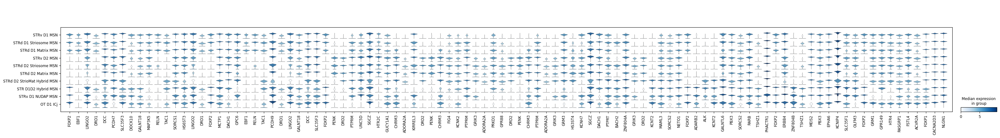

In [12]:
sc.pl.stacked_violin(
    adata_msn, 
    markers, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

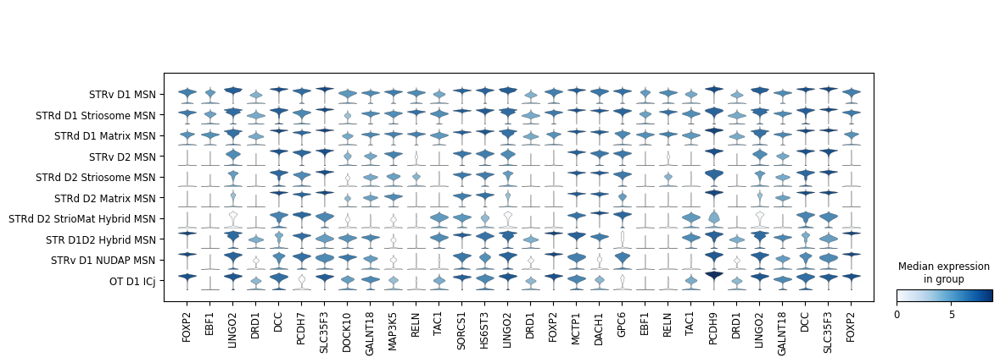

In [13]:
sc.pl.stacked_violin(
    adata_msn, 
    marker1, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

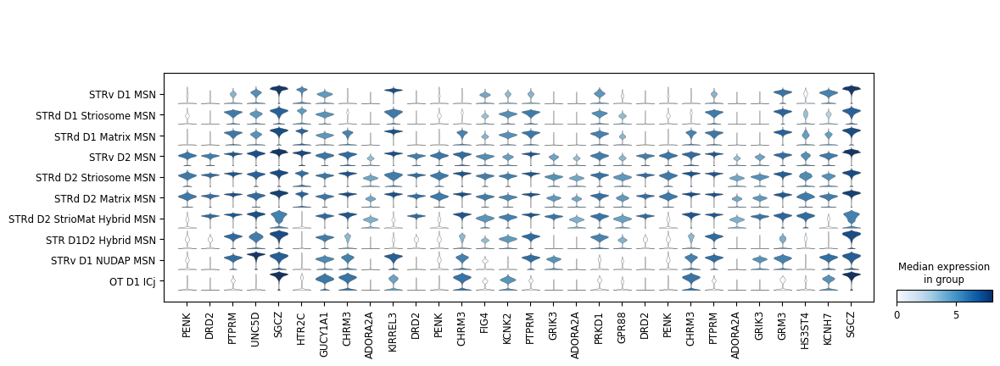

In [14]:
sc.pl.stacked_violin(
    adata_msn, 
    marker2, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

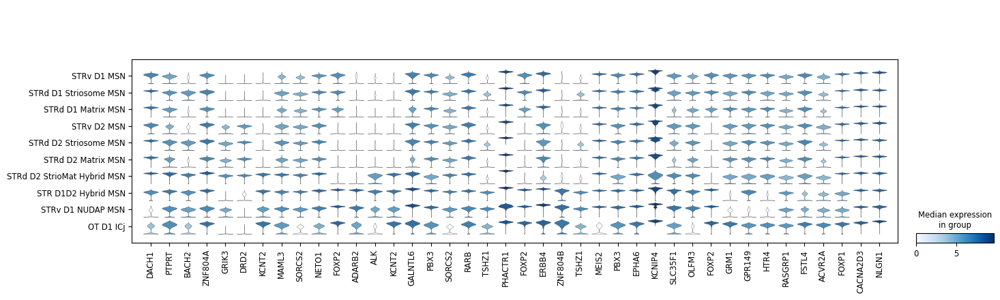

In [15]:
sc.pl.stacked_violin(
    adata_msn, 
    marker3, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=False, 
    #figsize=(6,3.5),
    #cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_AstroMarkers_fig2.pdf"
)

## DEGs of each group within Classic MSNs

In [17]:
adata_msn= adata_msn[adata_msn.obs["Subclass"].isin(['STR D2 MSN', 'STR D1 MSN'])]#.copy() #only D2 island
set(adata_msn.obs['Group'])

{'STRd D1 Matrix MSN',
 'STRd D1 Striosome MSN',
 'STRd D2 Matrix MSN',
 'STRd D2 StrioMat Hybrid MSN',
 'STRd D2 Striosome MSN',
 'STRv D1 MSN',
 'STRv D2 MSN'}

In [18]:
adata_msn_ds = downsample_per_cluster_donor(
    adata_msn,
    cluster_key="Group",
    donor_key="donor_id",
    max_cells_per_group=300,
    require_shared_donors=True,
    random_state=123  # reproducible
)


In [19]:
adata_msn_human = adata_msn_ds[adata_msn_ds.obs["organism"].isin(['Human'])].copy()
adata_msn_human

AnnData object with n_obs × n_vars = 18902 × 16630
    obs: 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster', 'cluster_id', 'cell_type_ontology_term', 'load_id', 'donor_id', 'assay', 'assay_ontology_term_id', 'organism', 'organism_ontology_term_id', 'development_stage', 'anatomical_region', 'anatomical_region_merged', 'anatomical_region_ontology_term_id', 'brain_region_ontology_term_id', 'self_reported_sex', 'self_reported_sex_ontology_term_id', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'disease', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'atac_confidently_mapped_read_pairs', 'atac_fraction_of_genome_in_peaks', 'atac_fraction_of_high_quality_fragments_in_cells', 'atac_fraction_of_high_quality_fragments_overlapping_tss', 'atac_fraction_of_high_quality_fragments_overlapping_peaks', 'atac_fraction_of_transposition_events_in_peaks_in_cells', 'atac_mean_raw_read_pairs_per_cell', 'atac_median_high_quality_fragments_per_cell', 'atac_

In [21]:
sc.tl.rank_genes_groups(adata_msn_human, "Group", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups='all',reference='rest', key_added="1vsOther_in_ClassicSubclass") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_human.uns["1vsOther_in_ClassicSubclass"]["names"].dtype.names)
all_groups = adata_msn_human.uns["1vsOther_in_ClassicSubclass"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_human, group=grp, key='1vsOther_in_ClassicSubclass').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_1vsOther_in_ClassicSubclass_DEGs_in_human-D1D2MSNs_ds.csv", index=False)

('STRv D1 MSN', 'STRd D1 Striosome MSN', 'STRd D1 Matrix MSN', 'STRv D2 MSN', 'STRd D2 Striosome MSN', 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN')


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,group
0,LINGO2,65.832947,5.606991,0.0,0.0,0.985931,0.472810,STRv D1 MSN
1,PRKG1,63.794022,5.230623,0.0,0.0,0.979267,0.603975,STRv D1 MSN
2,PDE1C,52.286015,3.543941,0.0,0.0,0.951499,0.654651,STRv D1 MSN
3,ERC2,52.131603,1.668336,0.0,0.0,0.987412,0.928893,STRv D1 MSN
4,CDH12,51.774227,2.426093,0.0,0.0,0.969641,0.869267,STRv D1 MSN
5,MPDZ,50.274021,3.051085,0.0,0.0,0.908182,0.632307,STRv D1 MSN
6,GDA,49.863831,4.363640,0.0,0.0,0.837097,0.298130,STRv D1 MSN
7,DSCAM,49.171783,2.496574,0.0,0.0,0.980007,0.813715,STRv D1 MSN
8,CADM1,49.088108,1.802801,0.0,0.0,0.994076,0.926239,STRv D1 MSN
9,ARHGAP6,49.065620,4.587823,0.0,0.0,0.809330,0.261589,STRv D1 MSN


In [9]:
df_all = pd.read_csv(work_dir + "/rank_genes_1vsOther_in_ClassicSubclass_DEGs_in_human-D1D2MSNs_ds.csv")

In [10]:
df_human= df_all.copy()

df_filtered = df_all[
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_human_filtered = df_filtered.copy()

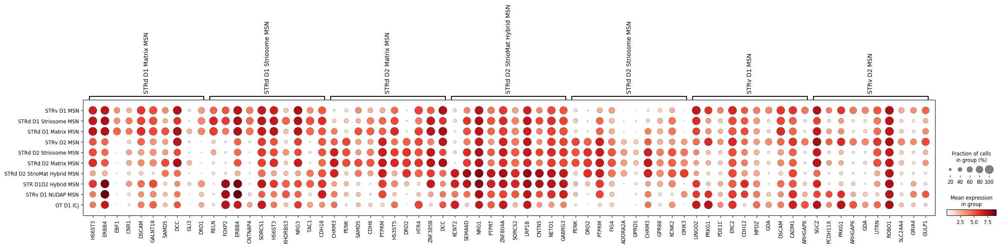

In [14]:
def top_genes_dict_from_df(df_filtered, top_n=10) -> dict:
    """
    Convert a filtered rank_genes_groups DataFrame into a var_names dictionary
    grouped by 'group', each with top N genes based on score.
    """
    top_genes_dict = {}
    for group, group_df in df_filtered.groupby("group"):
        top_genes = (
            group_df
            .sort_values("scores", ascending=False)
            .head(top_n)["names"]
            .tolist()
        )
        top_genes_dict[group] = top_genes
    return top_genes_dict
    

dict_df_filtered = top_genes_dict_from_df(df_human_filtered, top_n=10) # to show the gene patterns of filtered ones


sc.pl.dotplot(
    adata_msn,
    var_names=dict_df_filtered,
    groupby="Group", # groupby="GM_WM_location",
)

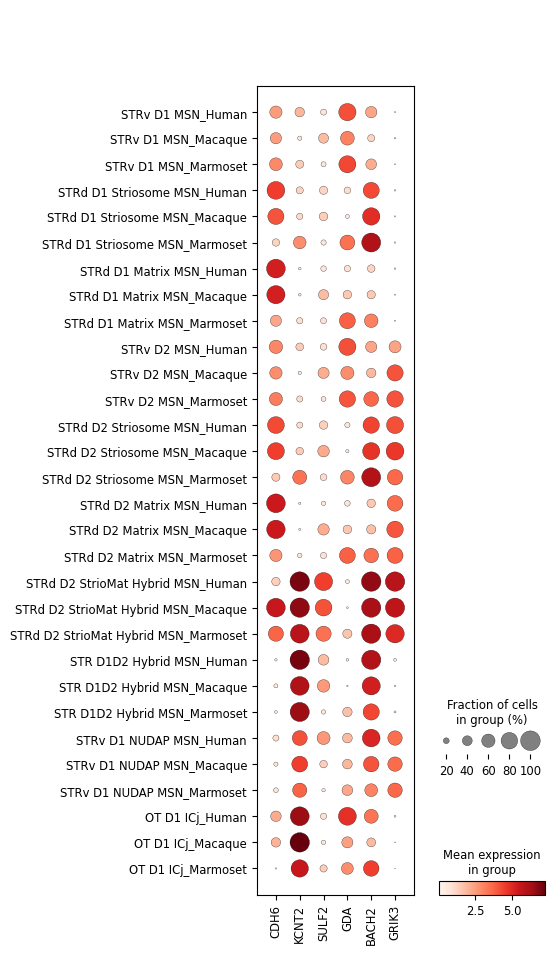

In [18]:
sc.pl.dotplot(
    adata_msn,
    var_names=['CDH6', 'KCNT2', 'SULF2', 'GDA', 'BACH2', 'GRIK3'], 
    groupby=["Group", 'organism'], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
  #  figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)

## DEGs of each paired groups within classic subclasses of MSNs

In [22]:
mapping = {
    'STRd D1 Matrix MSN': 'Matrix',
    'STRd D1 Striosome MSN': 'Striosome',
    'STRd D2 Matrix MSN': 'Matrix',
    'STRd D2 StrioMat Hybrid MSN': 'StrioMat',
    'STRd D2 Striosome MSN': 'Striosome',
    'STRv D1 MSN': 'ventral',
    'STRv D2 MSN': 'ventral',
}

adata_msn_human.obs["Strio_Matrix_Ventral"] = adata_msn_human.obs["Group"].map(mapping)
#ordered
adata_msn_human.obs["Strio_Matrix_Ventral"] = pd.Categorical(
    adata_msn_human.obs["Strio_Matrix_Ventral"],
    categories=["Matrix", "Striosome", "StrioMat"],  
    ordered=False,
)

adata_msn_human.obs["Strio_Matrix_Ventral"].value_counts(dropna=False)


Strio_Matrix_Ventral
NaN          5402
Matrix       5400
Striosome    5400
StrioMat     2700
Name: count, dtype: int64

In [23]:
sc.tl.rank_genes_groups(adata_msn_human, "Strio_Matrix_Ventral", method="wilcoxon", corr_method = "benjamini-hochberg", pts=True, 
                        use_raw=False, groups='all',reference='rest', key_added="1vsOther_in_ClassicSubclass_paired") #https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html


print(adata_msn_human.uns["1vsOther_in_ClassicSubclass_paired"]["names"].dtype.names)
all_groups = adata_msn_human.uns["1vsOther_in_ClassicSubclass_paired"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(adata_msn_human, group=grp, key='1vsOther_in_ClassicSubclass_paired').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_1vsOther_in_ClassicSubclass_paried_DEGs_in_human-D1D2MSNs_ds.csv", index=False)

('Matrix', 'Striosome', 'StrioMat')


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,group
0,SAMD5,71.581078,3.989413,0.0,0.0,0.949444,0.581692,Matrix
1,KCND2,71.169106,0.968211,0.0,0.0,1.000000,0.997926,Matrix
2,DCC,66.089104,2.297262,0.0,0.0,0.999074,0.885721,Matrix
3,HS3ST5,65.709038,2.034433,0.0,0.0,0.996296,0.904829,Matrix
4,ZNF385B,65.317215,2.929623,0.0,0.0,0.992593,0.846615,Matrix
5,CDH6,64.986992,3.270273,0.0,0.0,0.945741,0.631092,Matrix
6,ADAM12,64.218864,3.369066,0.0,0.0,0.907407,0.577914,Matrix
7,TESPA1,64.126678,4.530241,0.0,0.0,0.822593,0.301807,Matrix
8,GLI3,63.282253,5.685833,0.0,0.0,0.645185,0.087543,Matrix
9,PRKCB,60.875946,1.140794,0.0,0.0,0.999815,0.986446,Matrix


In [15]:
df_all = pd.read_csv(work_dir + "/rank_genes_1vsOther_in_ClassicSubclass_paried_DEGs_in_human-D1D2MSNs_ds.csv")

In [16]:
df_human= df_all.copy()

df_filtered = df_all[
    (df_all['logfoldchanges'] > 1) &
    (df_all['pvals_adj'] < 0.01) &
    (df_all['pct_nz_group'] > 0.2)
]
df_human_filtered = df_filtered.copy()

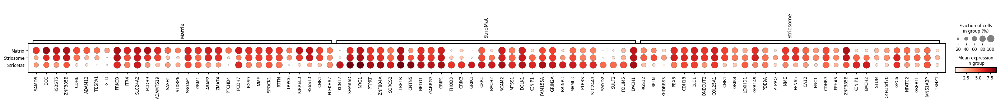

In [26]:
def top_genes_dict_from_df(df_filtered, top_n=10) -> dict:
    """
    Convert a filtered rank_genes_groups DataFrame into a var_names dictionary
    grouped by 'group', each with top N genes based on score.
    """
    top_genes_dict = {}
    for group, group_df in df_filtered.groupby("group"):
        top_genes = (
            group_df
            .sort_values("scores", ascending=False)
            .head(top_n)["names"]
            .tolist()
        )
        top_genes_dict[group] = top_genes
    return top_genes_dict
    

dict_df_filtered = top_genes_dict_from_df(df_human_filtered, top_n=30) # to show the gene patterns of filtered ones


sc.pl.dotplot(
    adata_msn_human,
    var_names=dict_df_filtered,
    groupby="Strio_Matrix_Ventral", # groupby="GM_WM_location",
)

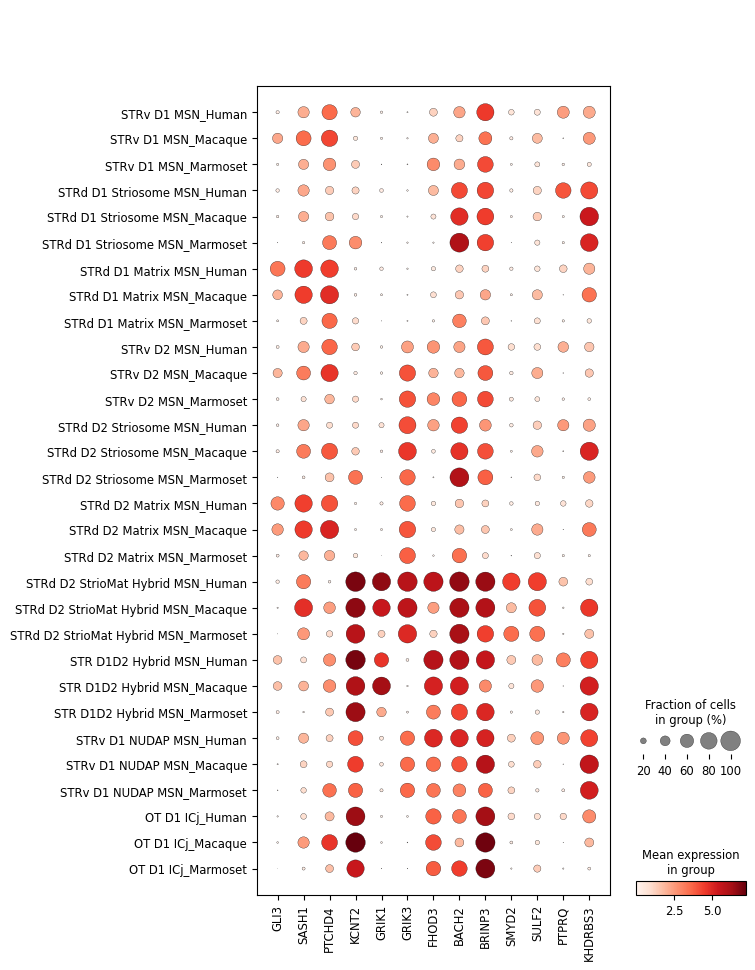

In [17]:
sc.pl.dotplot(
    adata_msn,
    var_names=['GLI3', 'SASH1', 'PTCHD4', 'KCNT2', 'GRIK1', 'GRIK3', 'FHOD3', 'BACH2', 'BRINP3', 'SMYD2', 'SULF2', 'PTPRQ', 'KHDRBS3'], 
    groupby=["Group", 'organism'], 
    use_raw=False,
    dendrogram=False,
    standard_scale= 'None',#'var',#'None',  
    swap_axes=False,
  #  figsize=(5.5, 2.5),
    #save="Dotplot_Astro_DopaReceptors.pdf"
)
